In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import scipy
import h5py
import xlrd
import sklearn as skl
import scipy as sp
from scipy import signal 

%matplotlib inline

import sys
# change this path to where you have the pyecog development downloaded on your computer
sys.path.append('C:\\Users\\sajon\\Desktop\\pyecog-Development\\pyecog-Development')
import pyecog as pg
from scipy.stats import norm, kurtosis
# verify that this is the correct path for module
pg.__path__

['C:\\Users\\sajon\\Desktop\\pyecog-Development\\pyecog-Development\\pyecog']

In [2]:
import pandas as pd
Indexing = pd.DataFrame(columns = ['Hour','File','Timestamps','Count'])

In [54]:
#define folder location
folders = [r'F:\Yichen NDF files\TiD 130_132\h5\TREATED'] 

#######################################
#stage = 'baseline'
stage = 'treated'

folder_name = os.path.join(folders[0])
print(folder_name)
h5_files = [os.path.join(folder_name,f) for f in os.listdir(folder_name) if not f.startswith('.')]

# check folders exist
for f in folders:
        print(os.path.exists(os.path.join(f)))
h5file = pg.H5File(h5_files[0])    
print(h5file)
# list of files
print('Number of files:')
print(len(h5_files))
ids = h5file.attributes['t_ids']
ids
print('IDs are:')
for tid in ids:
    print(tid)
    
HC = 132

F:\Yichen NDF files\TiD 130_132\h5\TREATED
True
Attributes:{'fs_dict': '{132: 256.0}', 'num_channels': 1, 't_ids': array([132]), 'Mcode': 'M1623330483'}
Number of files:
247
IDs are:
132


In [55]:
stage

'treated'

In [56]:
h5_file = h5_files[0]

921600


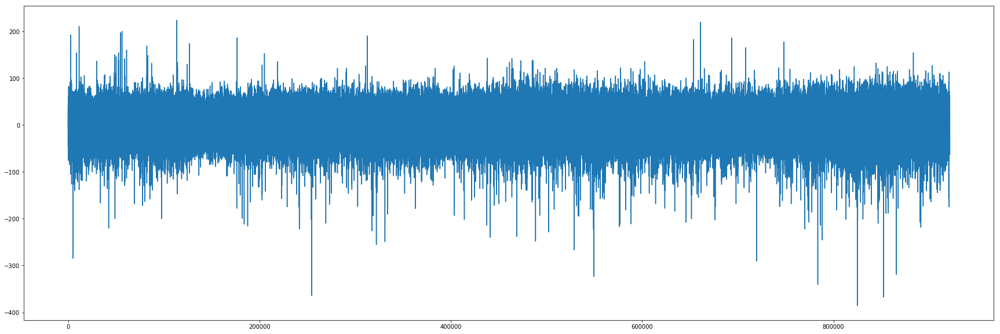

In [57]:
##Test to see if files + Tids are correct

h5file = pg.H5File(h5_files[0])
plt.figure(figsize=(30, 10))
Data = np.array(h5file[HC]['data'])
print(len(Data))

DataHC = np.array(h5file[HC]['data'])
plt.plot(DataHC)

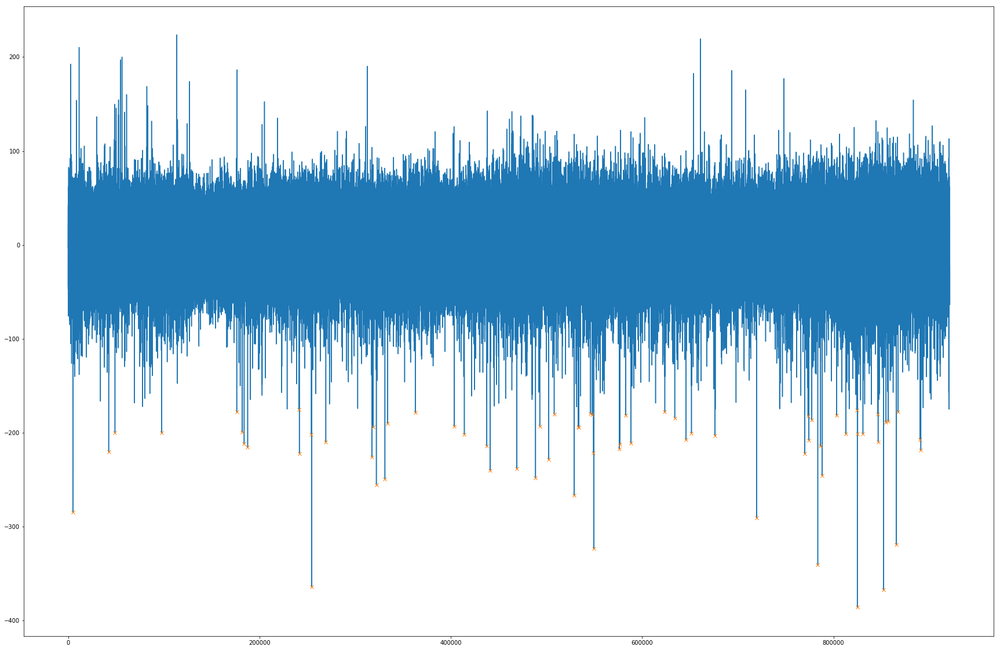

In [58]:
DataDF = pd.DataFrame(columns = ['Time','uV'])
DataDF['uV'] = np.array(DataHC)
#DataDF['Time'] = np.linspace(0,3600,len(DataHC))

x = -DataDF['uV']


peaks, properties = signal.find_peaks(x, height = Threshold,distance = 25)


plt.figure(figsize=(30, 20))
plt.plot(-x)
plt.plot(peaks, -x[peaks], "x",mfc='red')
plt.show()

In [59]:
St_devs = []
Kurtoses = []
Completion = 1

for file in h5_files:
    h5file = pg.H5File(file)
    DataHC = np.array(h5file[HC]['data'])
    #sos = signal.butter(1, (1,50), 'bp', fs=512, output='sos')
    #DataDF_HC_for_detection = signal.sosfilt(sos, DataHC)
    std  =np.std(DataHC)
    St_devs.append(std)
    print(Completion)
    Completion = Completion + 1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


KeyboardInterrupt: 

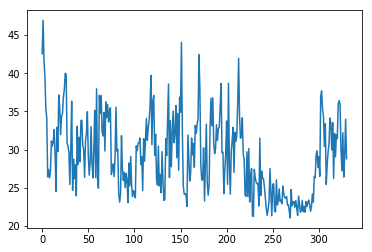

In [10]:
plt.plot(St_devs[:])

In [61]:
Threshold = np.average(St_devs[:]) * 6
Threshold = 177

In [62]:
#### SUMMARY AND AVERAGING ####

tids = h5file.attributes['t_ids']
DataDF['Time'] = np.linspace(0,3600,len(Data))

Indexing = pd.DataFrame(columns = ['Hour','File','Timestamps','Count'])

Completion = 1

for file in h5_files[:]:
    
    Timestamp = str(file[68:70]) +':00'
                  
    All_Spikes_for_avs = []
    All_Potentials_for_avs = []
    
    Success_Spikes_for_avs = []
    Success_Potentials_for_avs = []
    
    print(str(Completion) + " out of " + str(len(h5_files)))
    
    ###CREATE DATAFRAME OF DATA###
    h5file = pg.H5File(file)
    
    DataHC = np.array(h5file[HC]['data'])

    DataDF_HC_for_detection = -DataHC

    indexes = scipy.signal.find_peaks(DataDF_HC_for_detection,height=Threshold,distance = 25, width = 3)
   
    Peak_index = pd.DataFrame(indexes[0],columns =['Index'])
    
    df = pd.DataFrame({
            'Hour':[Timestamp],
            'File':[file],
            'Timestamps':[indexes[0]],
            'Count':len(indexes[0])})
    
    Indexing = pd.concat([Indexing,df])
    Completion = Completion + 1
    
Indexing = Indexing.reset_index(drop=True)

Indexing.to_pickle(str(HC) + "_" + stage + "_YQ_indexing.pkl")

1 out of 247
2 out of 247
3 out of 247
4 out of 247
5 out of 247
6 out of 247
7 out of 247
8 out of 247
9 out of 247
10 out of 247
11 out of 247
12 out of 247
13 out of 247
14 out of 247
15 out of 247
16 out of 247
17 out of 247
18 out of 247
19 out of 247
20 out of 247
21 out of 247
22 out of 247
23 out of 247
24 out of 247
25 out of 247
26 out of 247
27 out of 247
28 out of 247
29 out of 247
30 out of 247
31 out of 247
32 out of 247
33 out of 247
34 out of 247
35 out of 247
36 out of 247
37 out of 247
38 out of 247
39 out of 247
40 out of 247
41 out of 247
42 out of 247
43 out of 247
44 out of 247
45 out of 247
46 out of 247
47 out of 247
48 out of 247
49 out of 247
50 out of 247
51 out of 247
52 out of 247
53 out of 247
54 out of 247
55 out of 247
56 out of 247
57 out of 247
58 out of 247
59 out of 247
60 out of 247
61 out of 247
62 out of 247
63 out of 247
64 out of 247
65 out of 247
66 out of 247
67 out of 247
68 out of 247
69 out of 247
70 out of 247
71 out of 247
72 out of 247
7

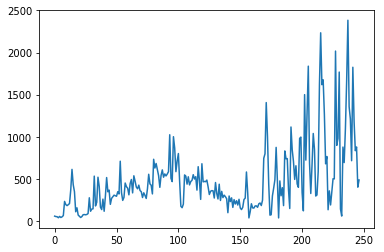

In [63]:
plt.plot(Indexing['Count'][:])

In [367]:
sum(Indexing['Count'])

2259

1 out of 331


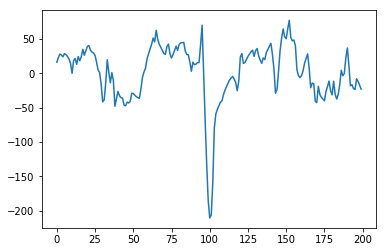

Do you want to save? [Y/n]: 


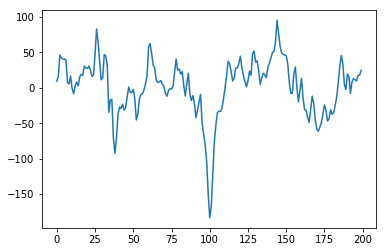

Do you want to save? [Y/n]: 


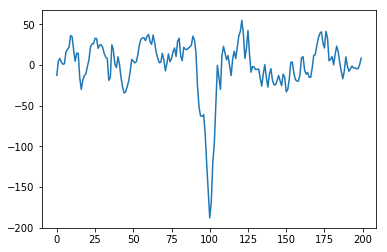

Do you want to save? [Y/n]: 


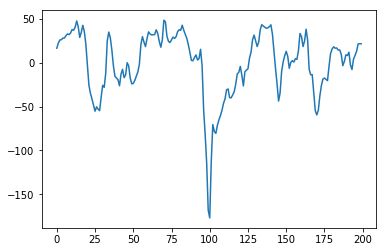

Do you want to save? [Y/n]: 


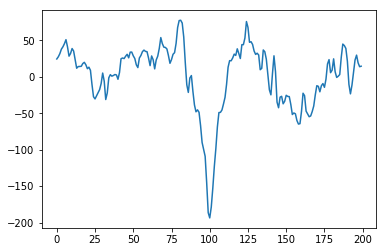

Do you want to save? [Y/n]: 


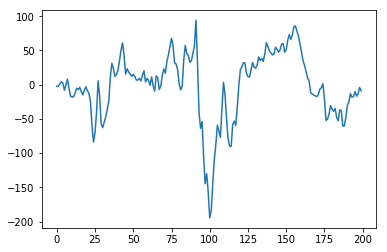

Do you want to save? [Y/n]: 


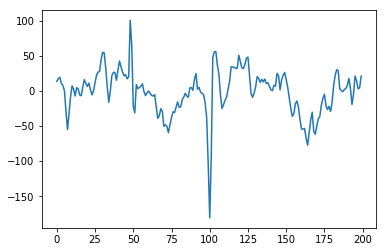

Do you want to save? [Y/n]: 


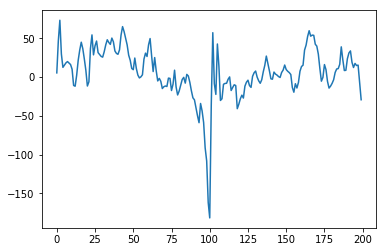

Do you want to save? [Y/n]: 


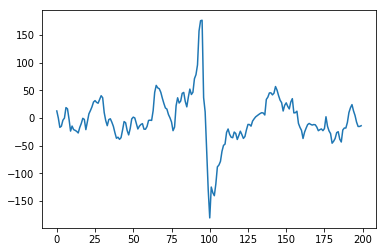

Do you want to save? [Y/n]: n


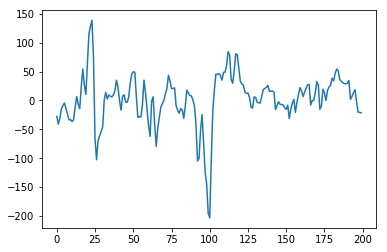

Do you want to save? [Y/n]: 


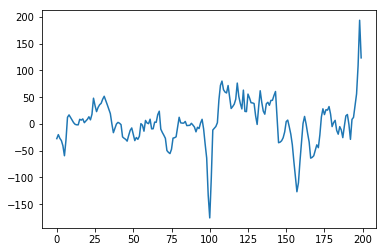

Do you want to save? [Y/n]: 


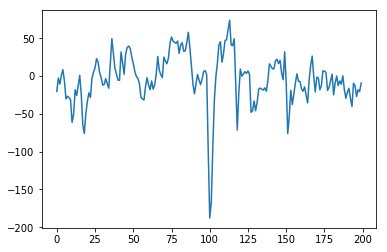

Do you want to save? [Y/n]: 


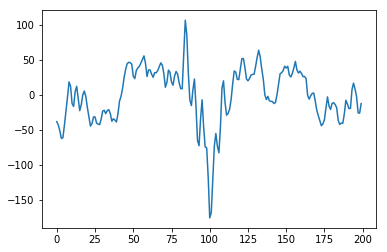

Do you want to save? [Y/n]: 


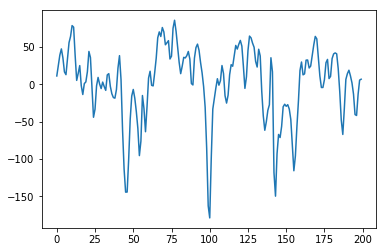

Do you want to save? [Y/n]: 


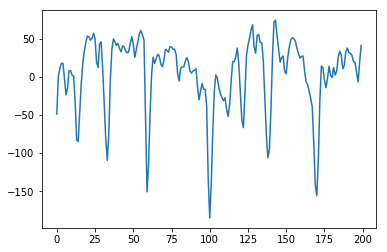

Do you want to save? [Y/n]: 


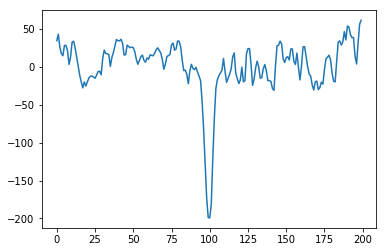

Do you want to save? [Y/n]: 


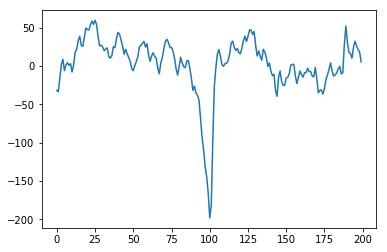

Do you want to save? [Y/n]: 


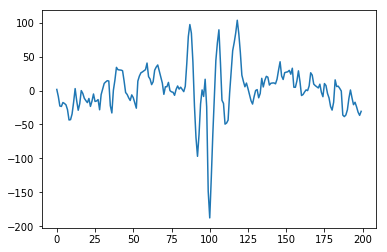

Do you want to save? [Y/n]: n
2 out of 331


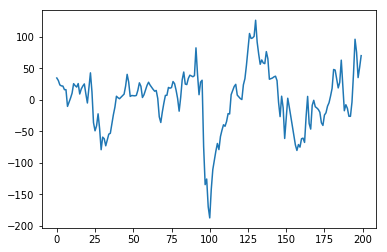

Do you want to save? [Y/n]: 


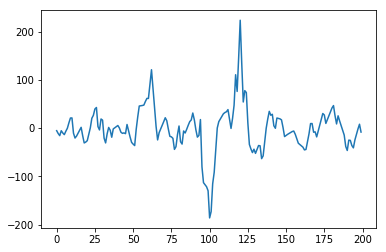

Do you want to save? [Y/n]: 


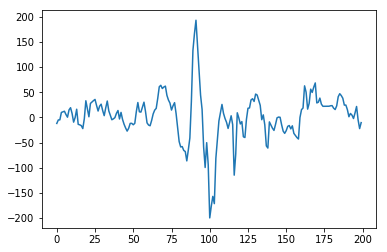

Do you want to save? [Y/n]: 


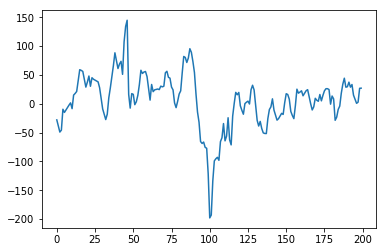

Do you want to save? [Y/n]: 


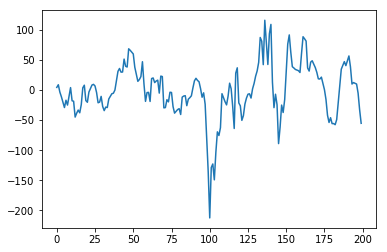

Do you want to save? [Y/n]: 


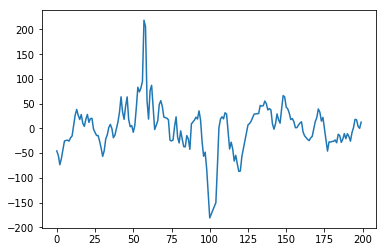

Do you want to save? [Y/n]: 


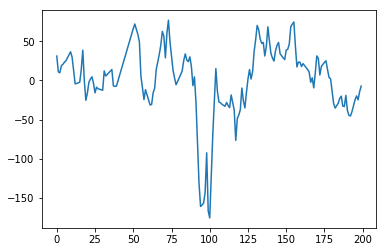

Do you want to save? [Y/n]: 


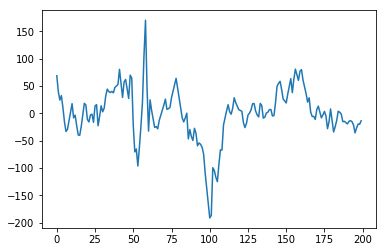

Do you want to save? [Y/n]: 


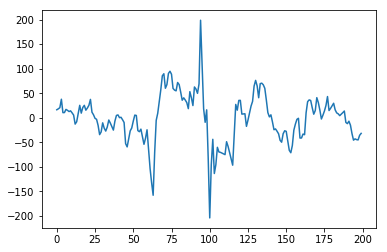

Do you want to save? [Y/n]: n


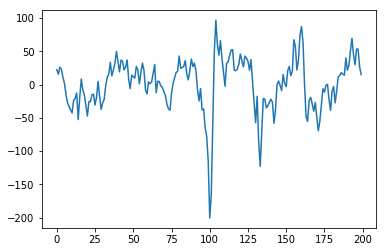

Do you want to save? [Y/n]: 


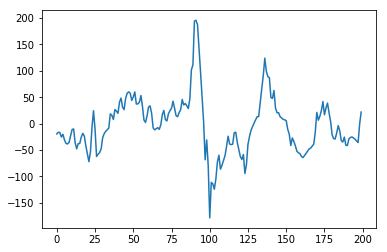

Do you want to save? [Y/n]: n


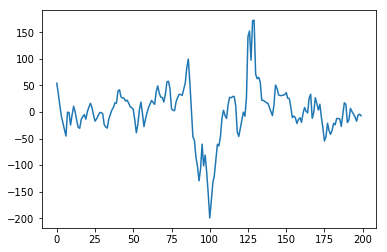

Do you want to save? [Y/n]: n


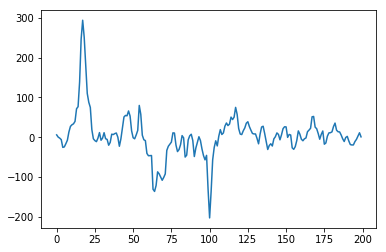

Do you want to save? [Y/n]: 


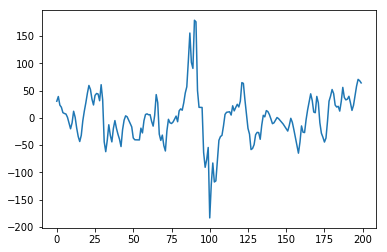

Do you want to save? [Y/n]: n


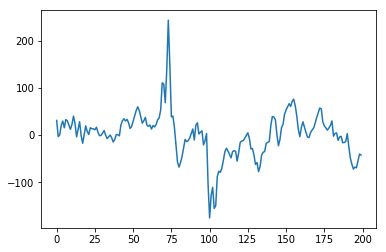

Do you want to save? [Y/n]: n


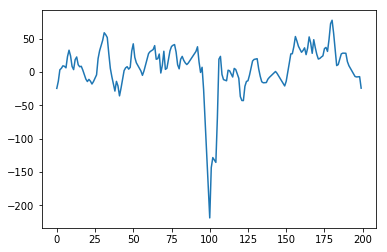

Do you want to save? [Y/n]: 


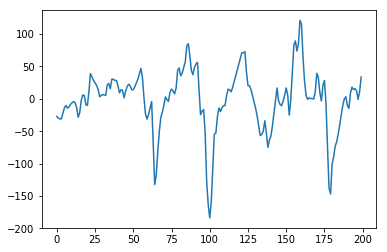

Do you want to save? [Y/n]: 


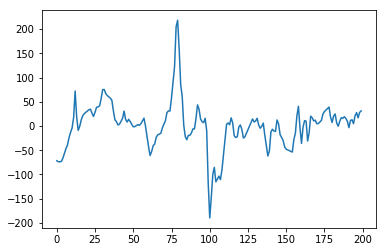

Do you want to save? [Y/n]: 


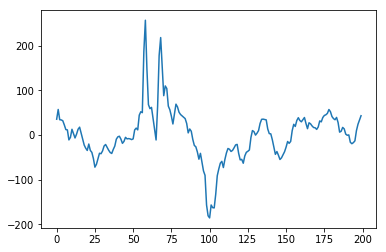

Do you want to save? [Y/n]: n


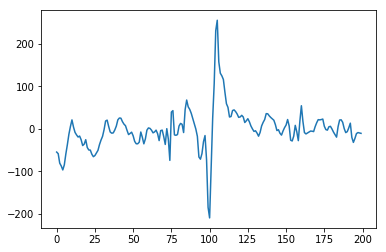

Do you want to save? [Y/n]: 


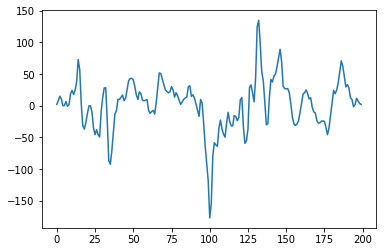

Do you want to save? [Y/n]: 


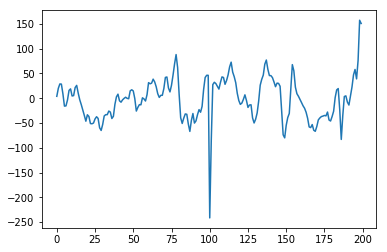

Do you want to save? [Y/n]: 


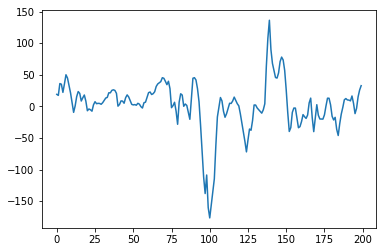

Do you want to save? [Y/n]: n


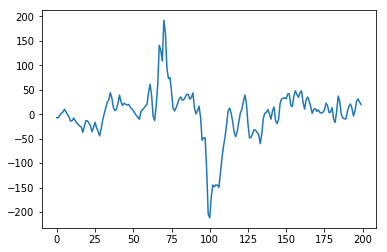

Do you want to save? [Y/n]: 


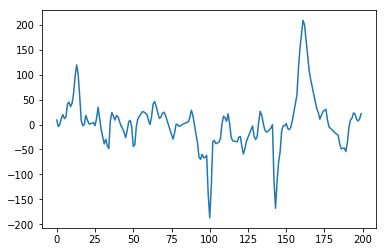

Do you want to save? [Y/n]: 


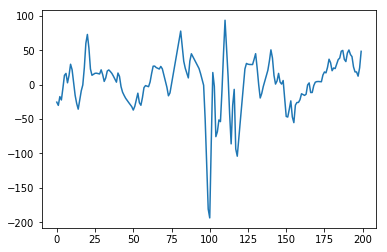

Do you want to save? [Y/n]: 


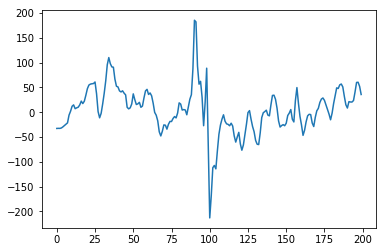

Do you want to save? [Y/n]: 


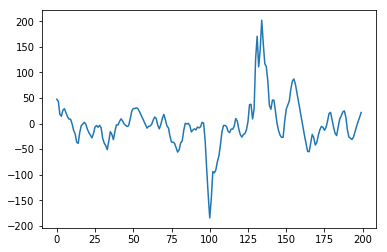

Do you want to save? [Y/n]: 


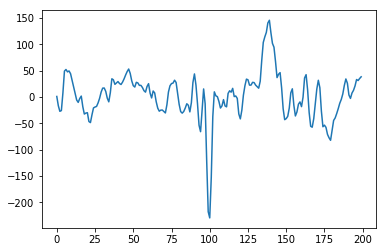

Do you want to save? [Y/n]: 


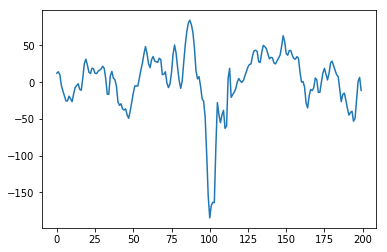

Do you want to save? [Y/n]: 


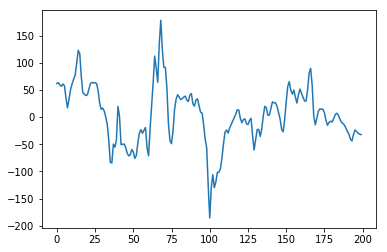

Do you want to save? [Y/n]: 


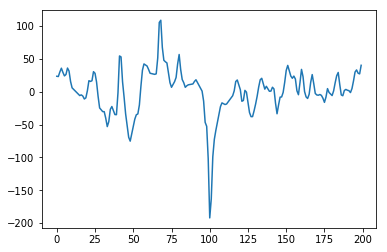

Do you want to save? [Y/n]: 


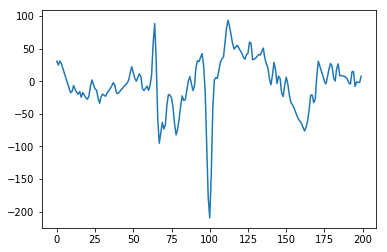

Do you want to save? [Y/n]: 


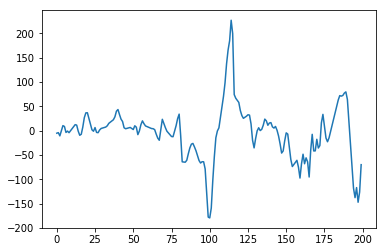

Do you want to save? [Y/n]: 


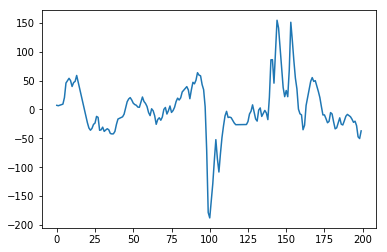

Do you want to save? [Y/n]: 


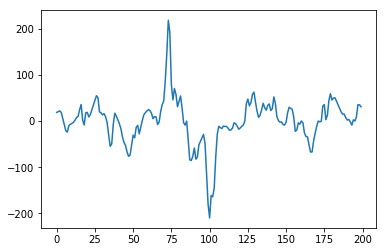

Do you want to save? [Y/n]: 


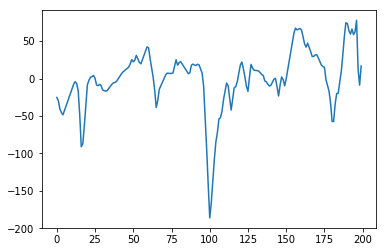

Do you want to save? [Y/n]: 


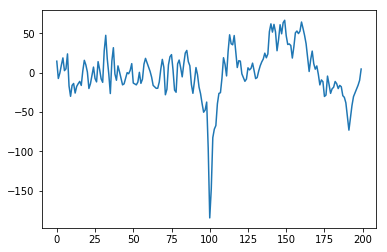

Do you want to save? [Y/n]: 


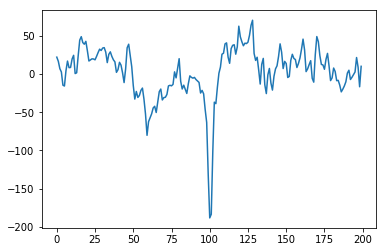

Do you want to save? [Y/n]: 


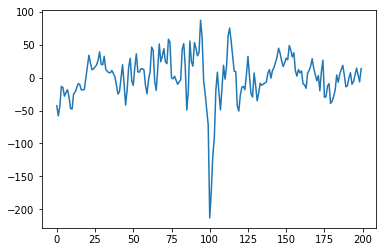

Do you want to save? [Y/n]: 


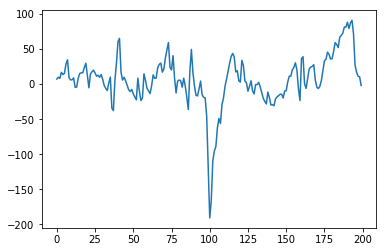

Do you want to save? [Y/n]: 


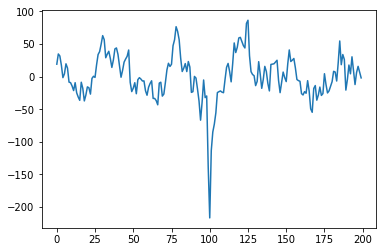

Do you want to save? [Y/n]: 


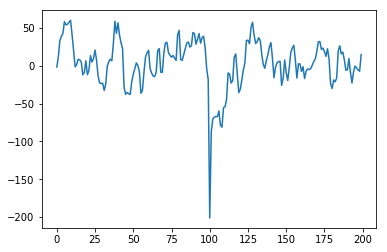

Do you want to save? [Y/n]: 


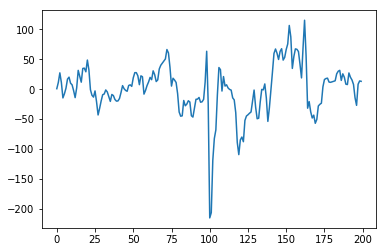

Do you want to save? [Y/n]: 


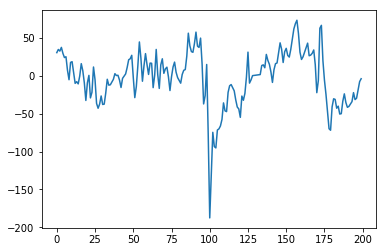

Do you want to save? [Y/n]: 


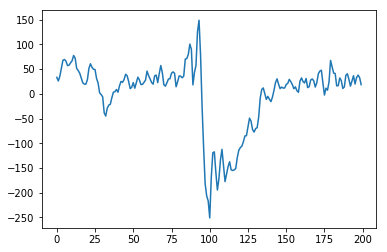

Do you want to save? [Y/n]: n


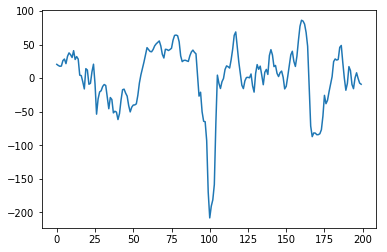

Do you want to save? [Y/n]: 


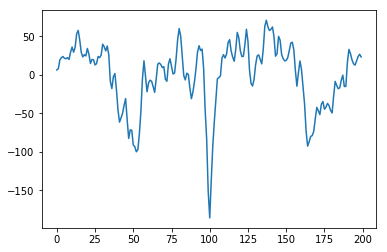

Do you want to save? [Y/n]: 


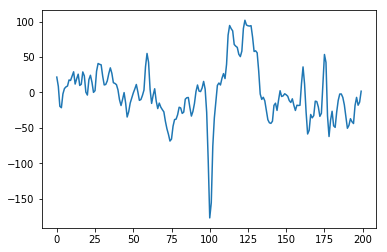

Do you want to save? [Y/n]: 


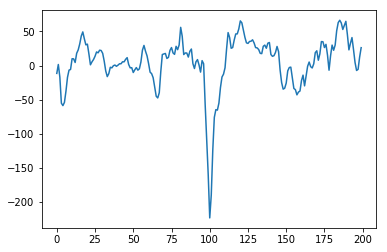

Do you want to save? [Y/n]: 
3 out of 331


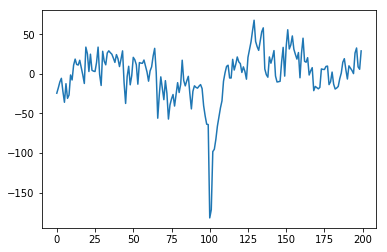

Do you want to save? [Y/n]: 


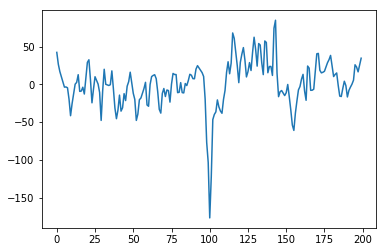

Do you want to save? [Y/n]: 


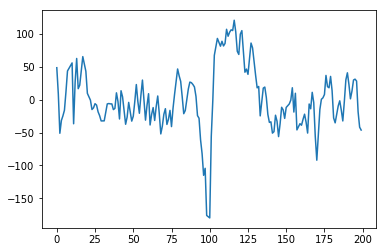

Do you want to save? [Y/n]: 


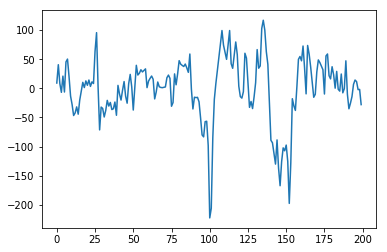

Do you want to save? [Y/n]: 


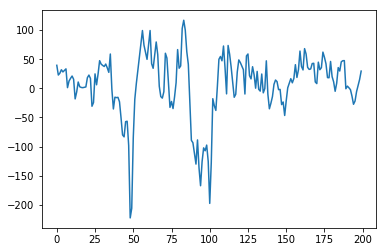

Do you want to save? [Y/n]: n


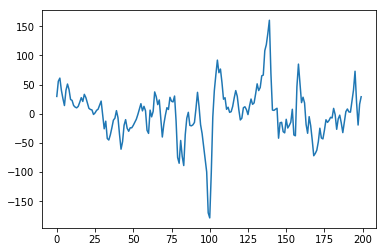

Do you want to save? [Y/n]: n


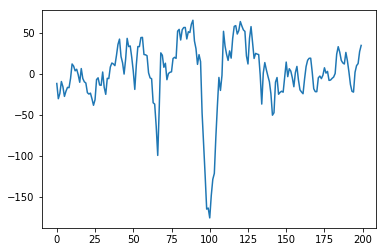

Do you want to save? [Y/n]: 


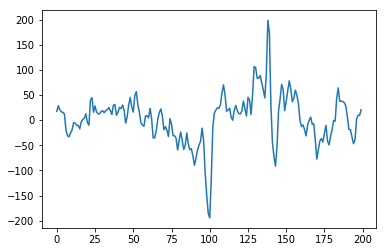

Do you want to save? [Y/n]: 


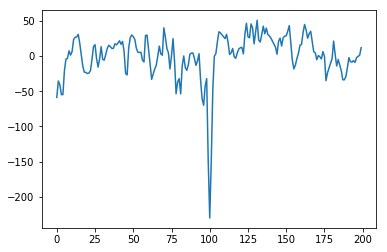

Do you want to save? [Y/n]: 


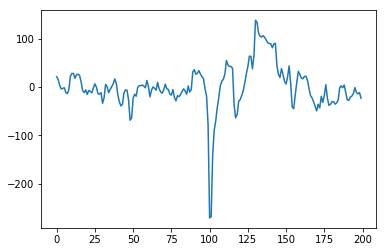

Do you want to save? [Y/n]: 


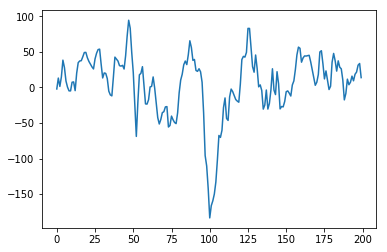

Do you want to save? [Y/n]: 


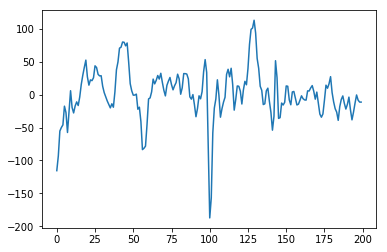

Do you want to save? [Y/n]: 


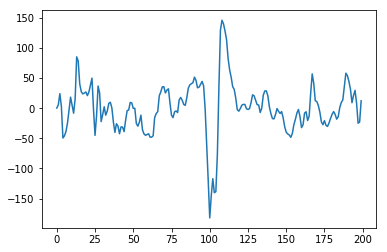

Do you want to save? [Y/n]: 


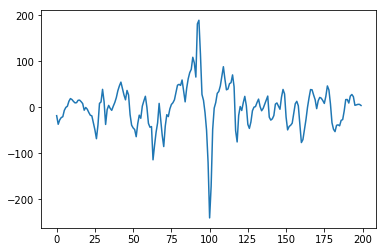

Do you want to save? [Y/n]: 


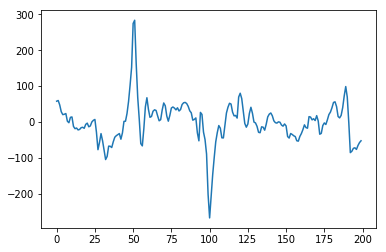

Do you want to save? [Y/n]: 


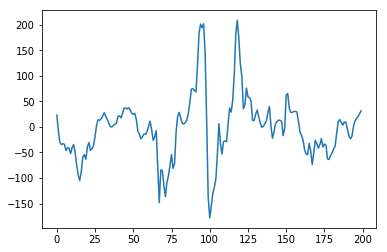

Do you want to save? [Y/n]: n


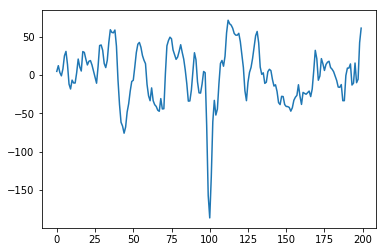

Do you want to save? [Y/n]: 


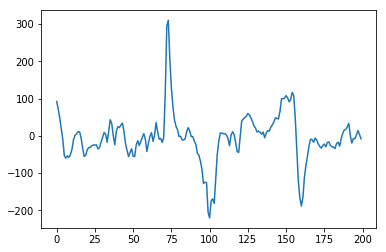

Do you want to save? [Y/n]: n


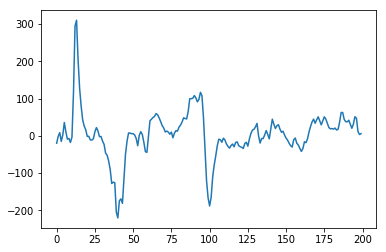

Do you want to save? [Y/n]: n


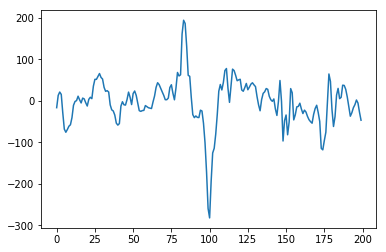

Do you want to save? [Y/n]: 


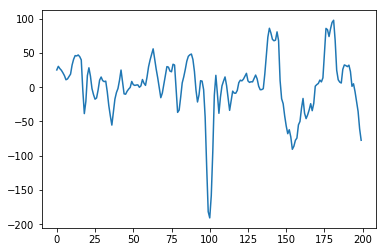

Do you want to save? [Y/n]: 


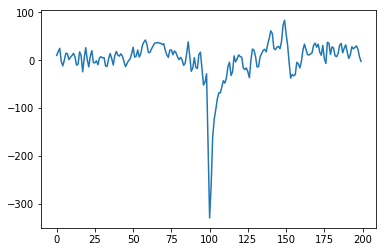

Do you want to save? [Y/n]: 


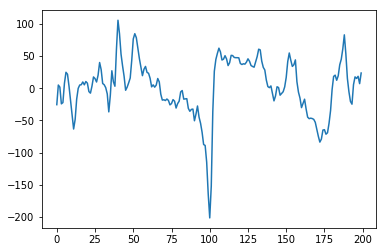

Do you want to save? [Y/n]: 


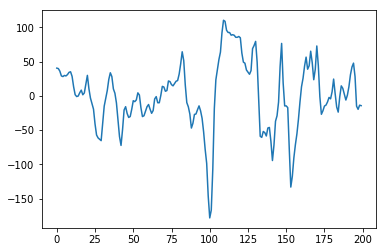

Do you want to save? [Y/n]: 


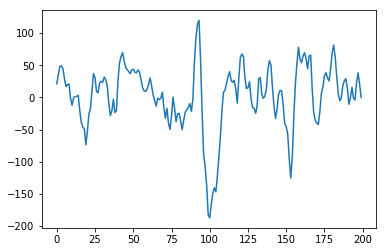

Do you want to save? [Y/n]: 


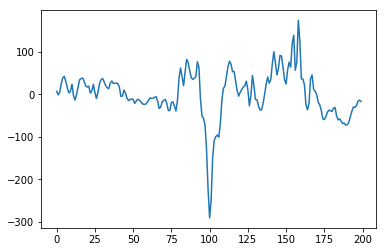

Do you want to save? [Y/n]: 


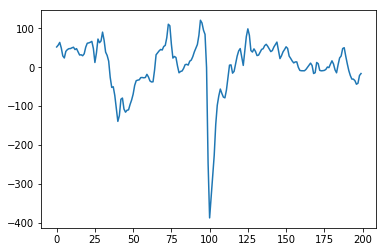

Do you want to save? [Y/n]: 


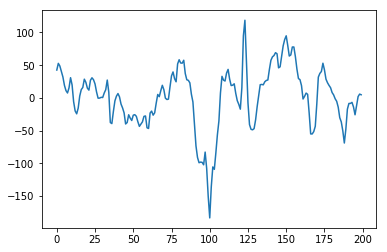

Do you want to save? [Y/n]: 


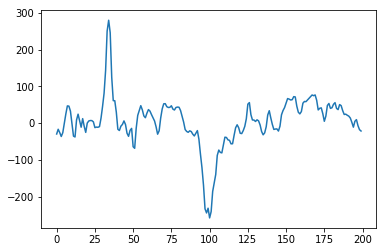

Do you want to save? [Y/n]: 


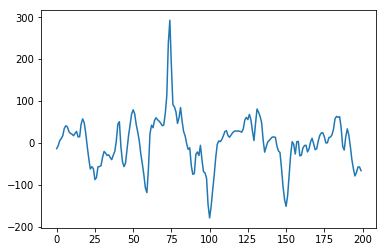

Do you want to save? [Y/n]: 


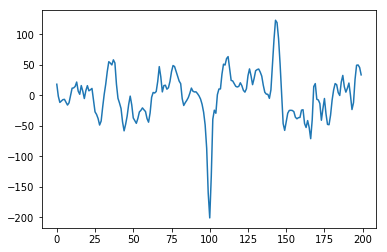

Do you want to save? [Y/n]: 


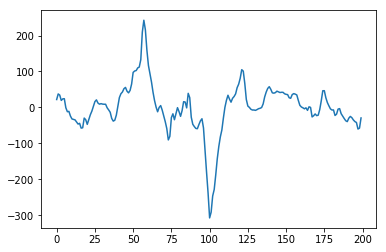

Do you want to save? [Y/n]: 


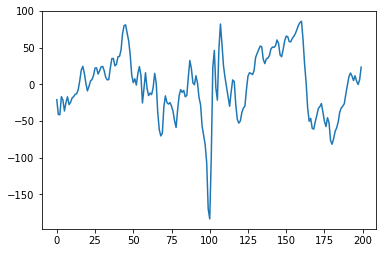

Do you want to save? [Y/n]: 


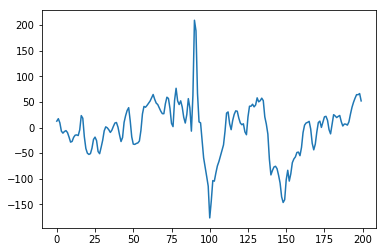

Do you want to save? [Y/n]: n


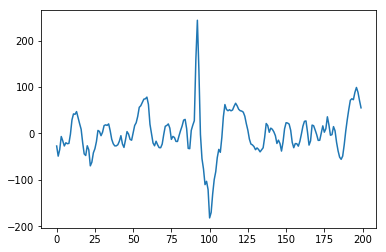

Do you want to save? [Y/n]: n


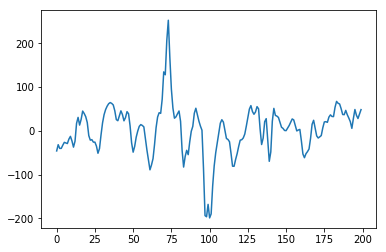

Do you want to save? [Y/n]: n


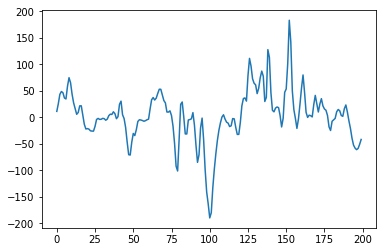

Do you want to save? [Y/n]: 


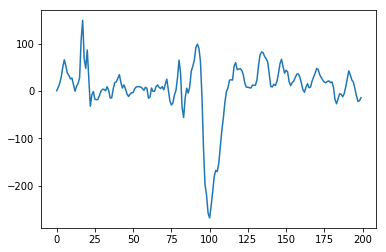

Do you want to save? [Y/n]: 


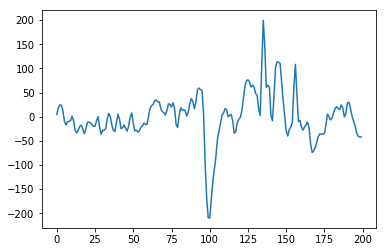

Do you want to save? [Y/n]: 


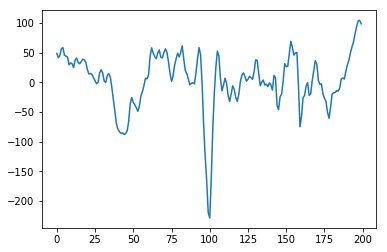

Do you want to save? [Y/n]: 


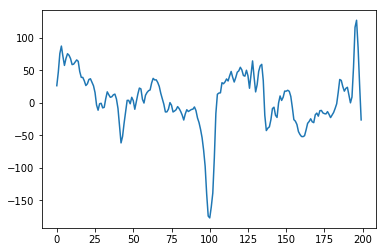

Do you want to save? [Y/n]: 


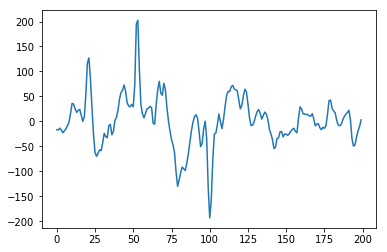

Do you want to save? [Y/n]: n


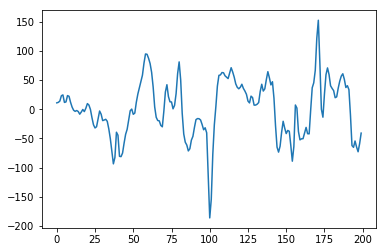

Do you want to save? [Y/n]: 


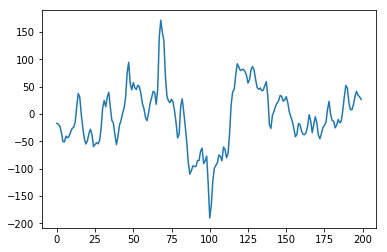

Do you want to save? [Y/n]: n


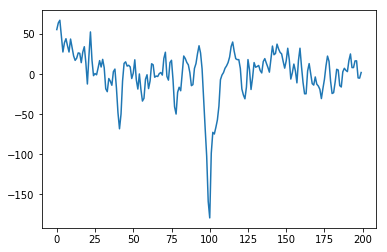

Do you want to save? [Y/n]: 


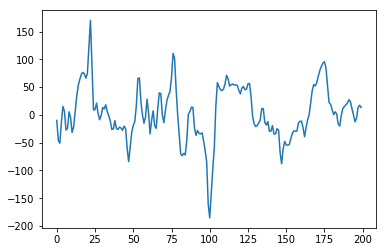

Do you want to save? [Y/n]: 


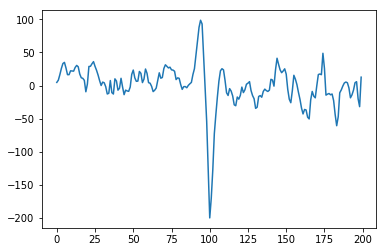

Do you want to save? [Y/n]: 


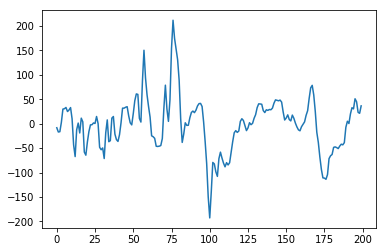

Do you want to save? [Y/n]: 


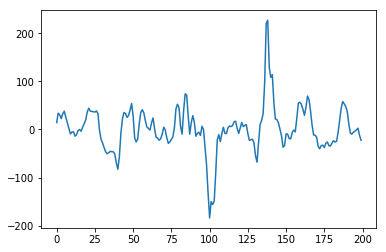

Do you want to save? [Y/n]: 


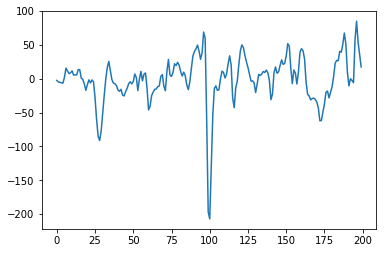

Do you want to save? [Y/n]: 
4 out of 331


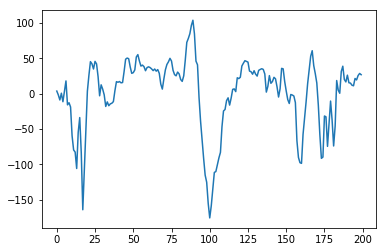

Do you want to save? [Y/n]: 


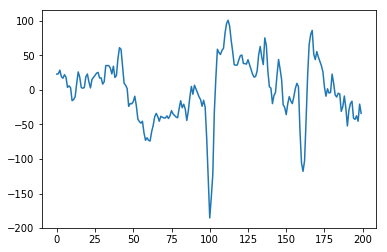

Do you want to save? [Y/n]: 


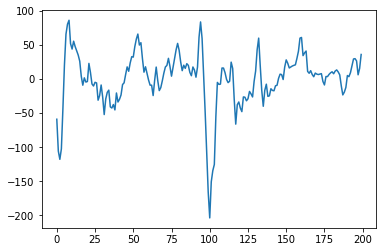

Do you want to save? [Y/n]: 


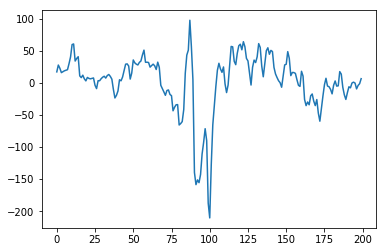

Do you want to save? [Y/n]: 


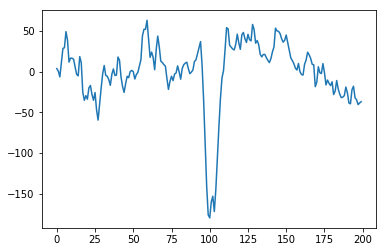

Do you want to save? [Y/n]: 


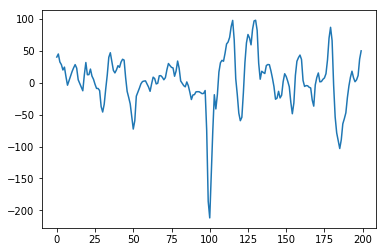

Do you want to save? [Y/n]: 


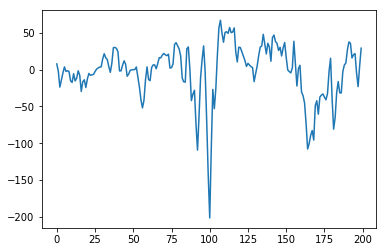

Do you want to save? [Y/n]: 


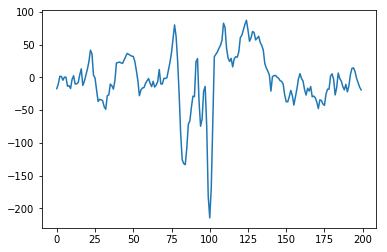

Do you want to save? [Y/n]: 


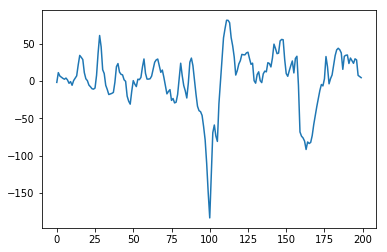

Do you want to save? [Y/n]: 


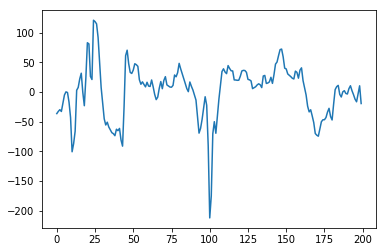

Do you want to save? [Y/n]: 


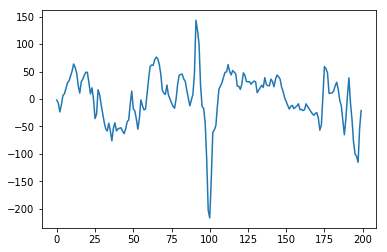

Do you want to save? [Y/n]: 


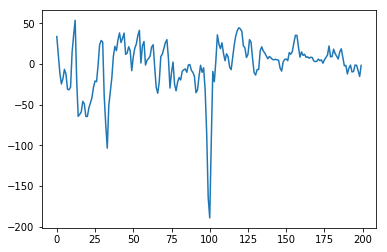

Do you want to save? [Y/n]: 


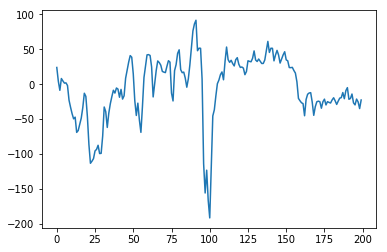

Do you want to save? [Y/n]: 


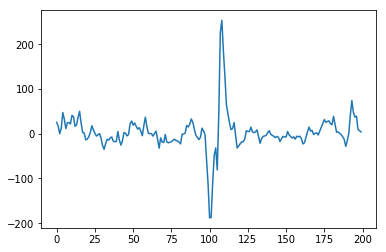

Do you want to save? [Y/n]: n


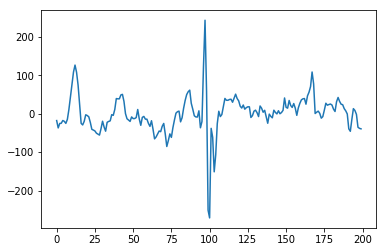

Do you want to save? [Y/n]: n


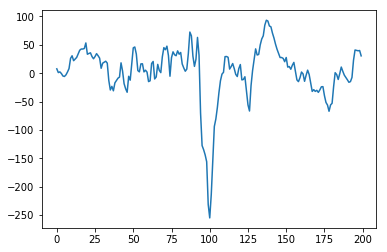

Do you want to save? [Y/n]: 


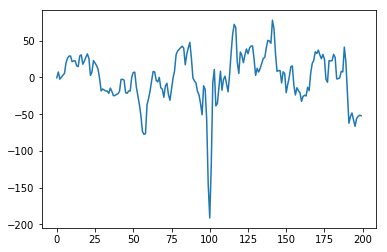

Do you want to save? [Y/n]: 


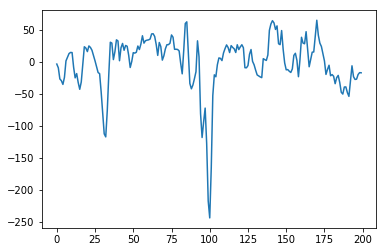

Do you want to save? [Y/n]: 


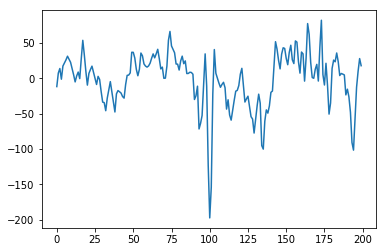

Do you want to save? [Y/n]: 


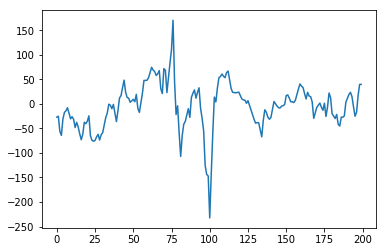

Do you want to save? [Y/n]: 


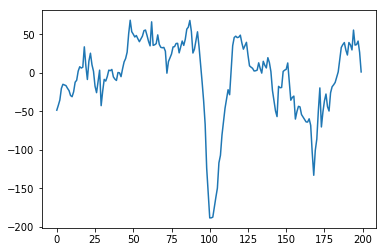

Do you want to save? [Y/n]: 


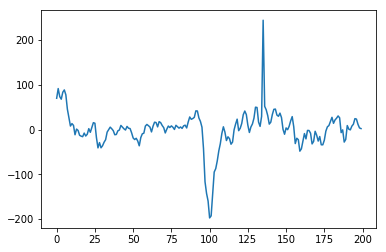

Do you want to save? [Y/n]: 


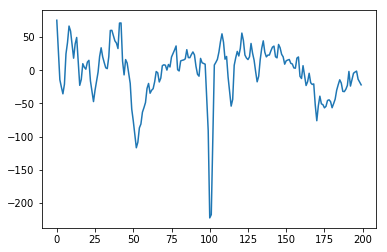

Do you want to save? [Y/n]: 


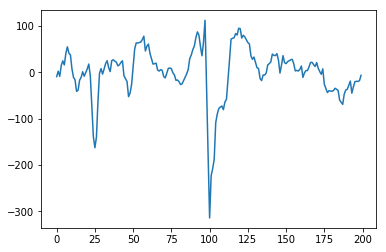

Do you want to save? [Y/n]: 


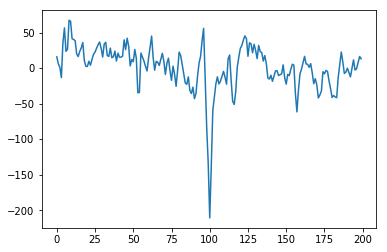

Do you want to save? [Y/n]: 


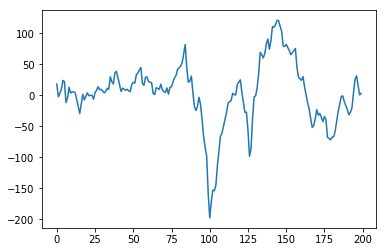

Do you want to save? [Y/n]: 


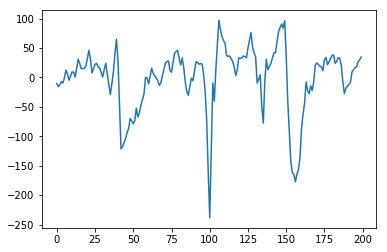

Do you want to save? [Y/n]: 


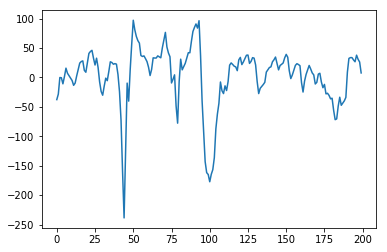

Do you want to save? [Y/n]: 


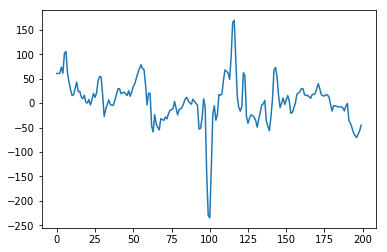

Do you want to save? [Y/n]: 


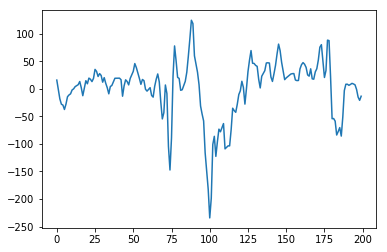

Do you want to save? [Y/n]: n


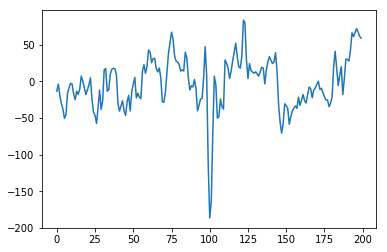

Do you want to save? [Y/n]: 


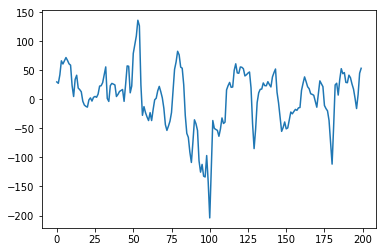

Do you want to save? [Y/n]: n


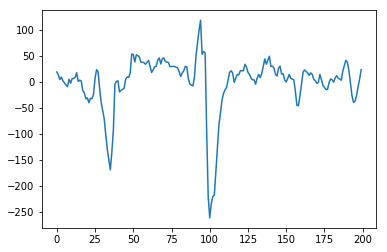

Do you want to save? [Y/n]: 


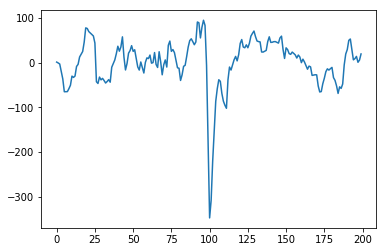

Do you want to save? [Y/n]: 


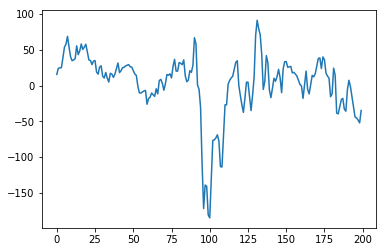

Do you want to save? [Y/n]: 


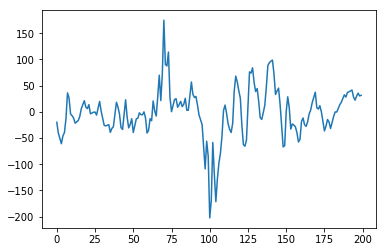

Do you want to save? [Y/n]: n


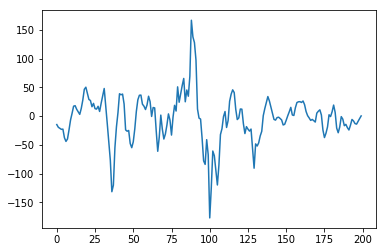

Do you want to save? [Y/n]: n


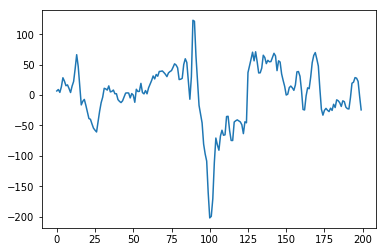

Do you want to save? [Y/n]: 


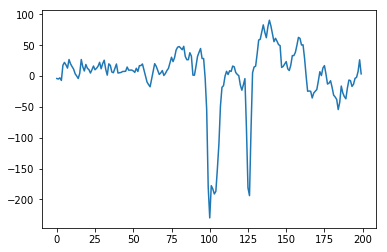

Do you want to save? [Y/n]: 


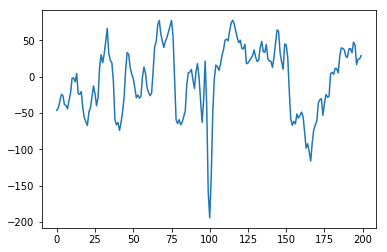

Do you want to save? [Y/n]: 


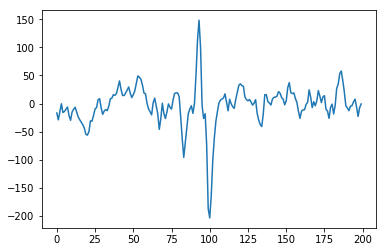

Do you want to save? [Y/n]: 


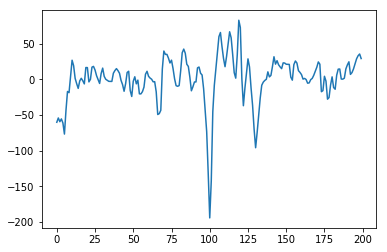

Do you want to save? [Y/n]: 


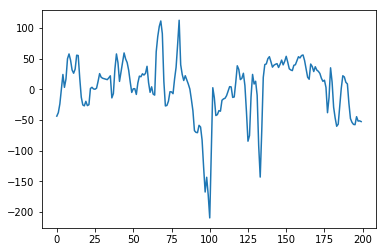

Do you want to save? [Y/n]: n


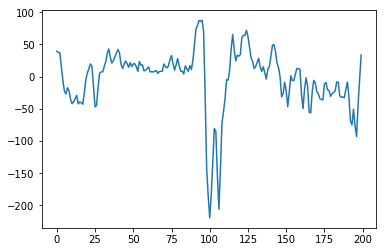

Do you want to save? [Y/n]: 


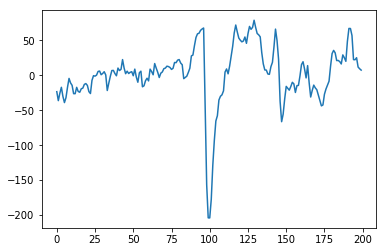

Do you want to save? [Y/n]: 


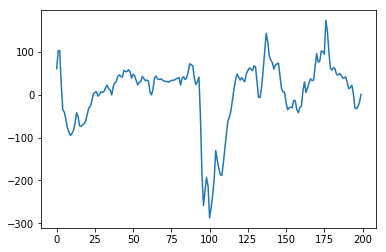

Do you want to save? [Y/n]: 


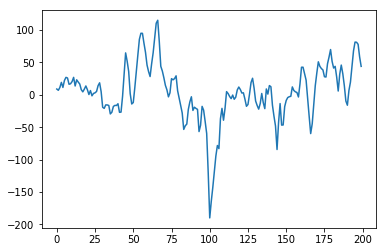

Do you want to save? [Y/n]: 


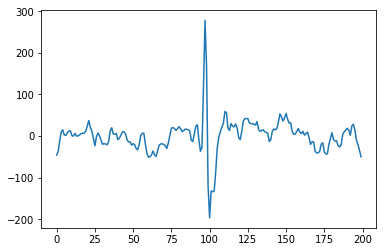

Do you want to save? [Y/n]: n


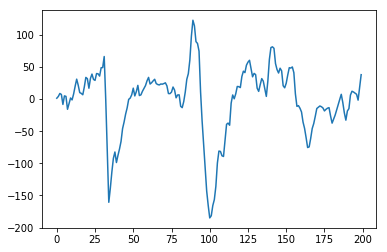

Do you want to save? [Y/n]: 


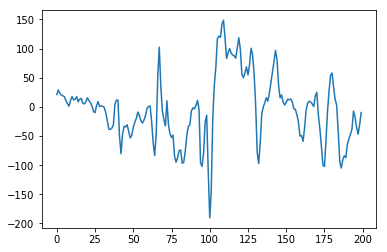

Do you want to save? [Y/n]: 
5 out of 331


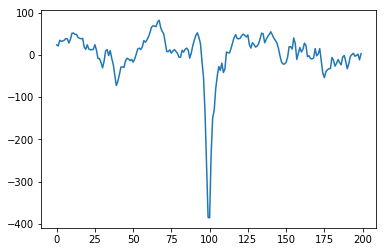

Do you want to save? [Y/n]: 


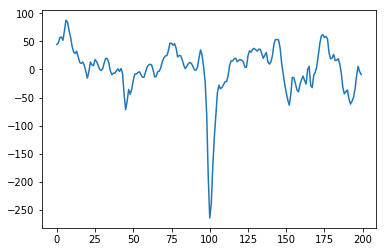

Do you want to save? [Y/n]: 


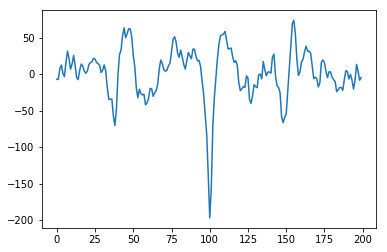

Do you want to save? [Y/n]: 


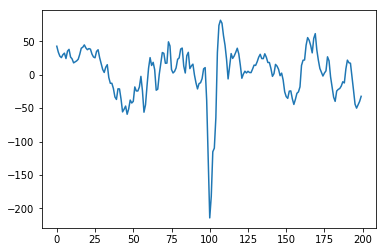

Do you want to save? [Y/n]: 


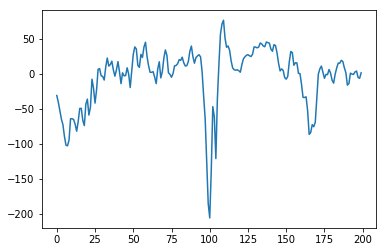

Do you want to save? [Y/n]: 


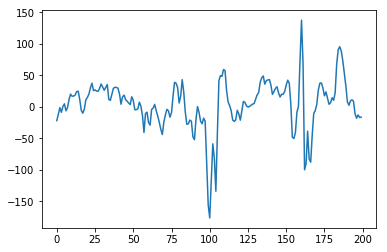

Do you want to save? [Y/n]: 


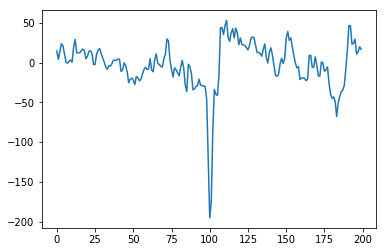

Do you want to save? [Y/n]: 


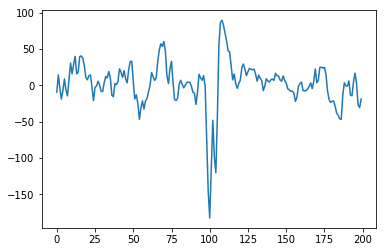

Do you want to save? [Y/n]: 


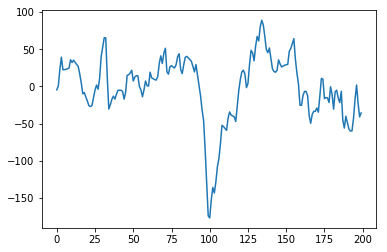

Do you want to save? [Y/n]: 


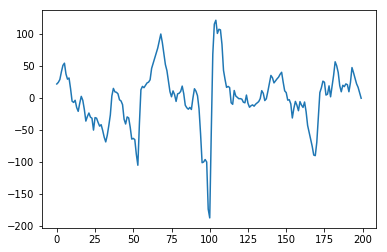

Do you want to save? [Y/n]: 


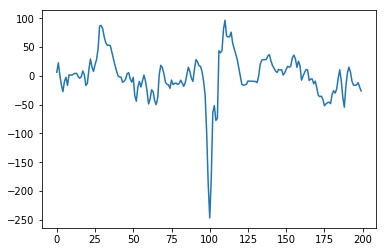

Do you want to save? [Y/n]: 


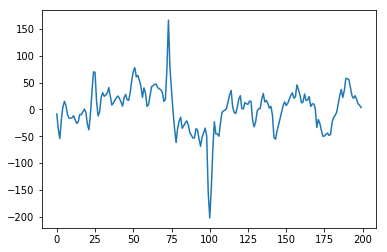

Do you want to save? [Y/n]: n


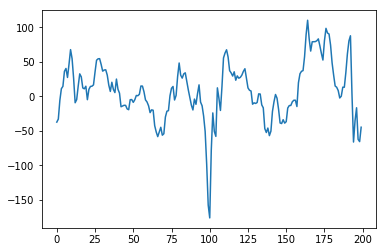

Do you want to save? [Y/n]: 


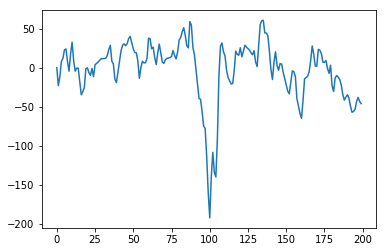

Do you want to save? [Y/n]: 


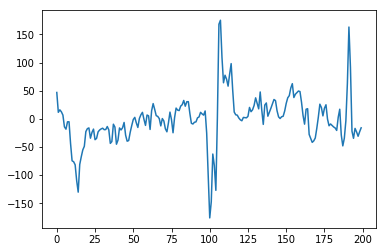

Do you want to save? [Y/n]: 


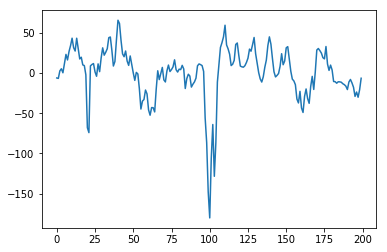

Do you want to save? [Y/n]: 


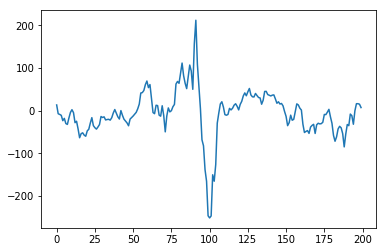

Do you want to save? [Y/n]: 


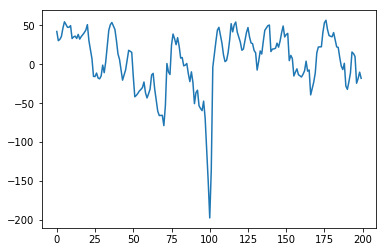

Do you want to save? [Y/n]: 


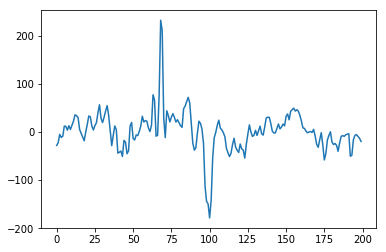

Do you want to save? [Y/n]: 


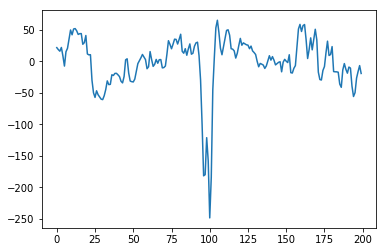

Do you want to save? [Y/n]: 


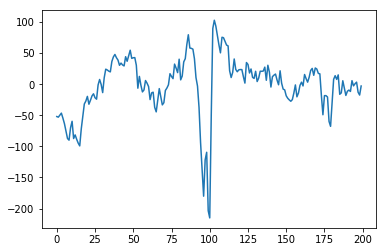

Do you want to save? [Y/n]: 


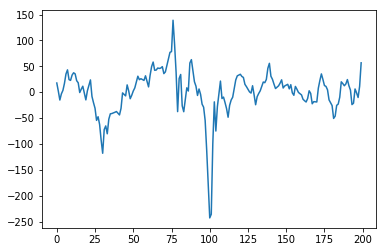

Do you want to save? [Y/n]: 


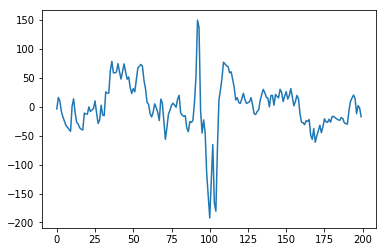

Do you want to save? [Y/n]: 


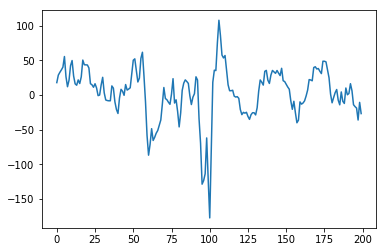

Do you want to save? [Y/n]: 


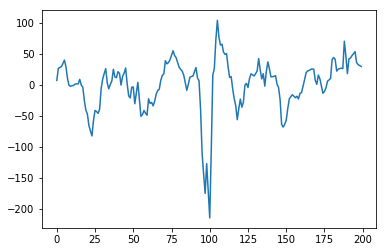

Do you want to save? [Y/n]: 


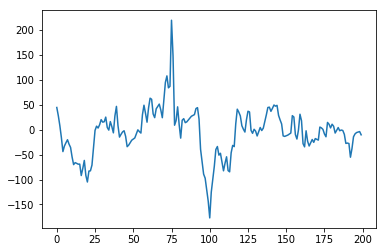

Do you want to save? [Y/n]: 


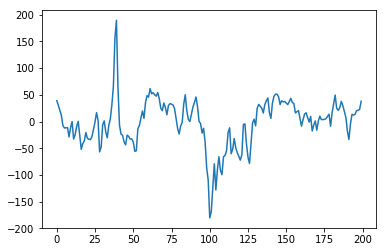

Do you want to save? [Y/n]: n


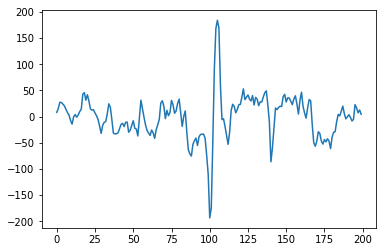

Do you want to save? [Y/n]: n


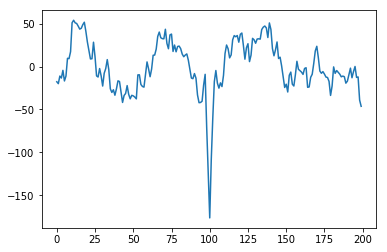

Do you want to save? [Y/n]: 


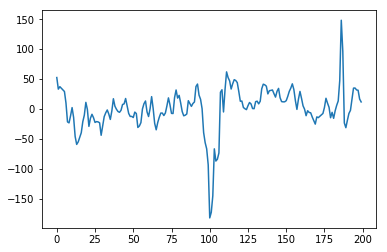

Do you want to save? [Y/n]: n


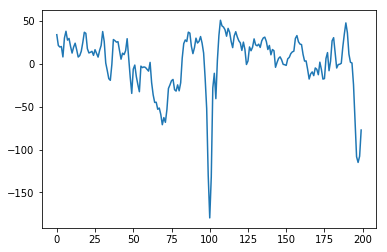

Do you want to save? [Y/n]: 


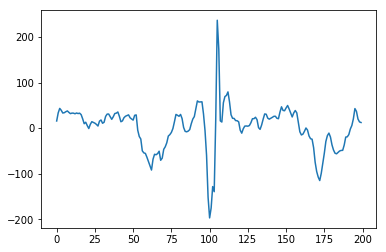

Do you want to save? [Y/n]: 


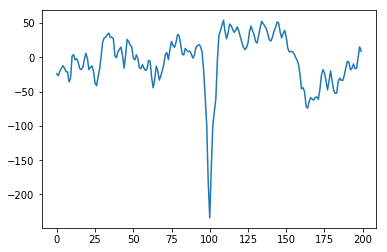

Do you want to save? [Y/n]: 


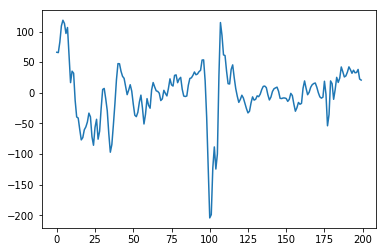

Do you want to save? [Y/n]: 


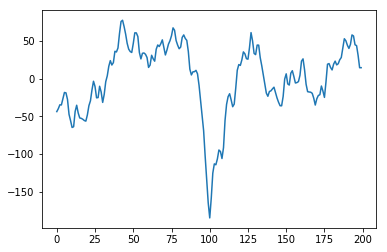

Do you want to save? [Y/n]: 


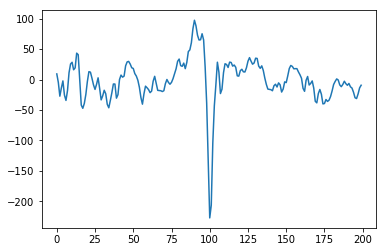

Do you want to save? [Y/n]: 


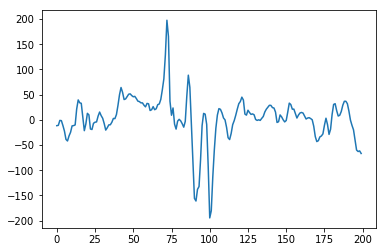

Do you want to save? [Y/n]: n


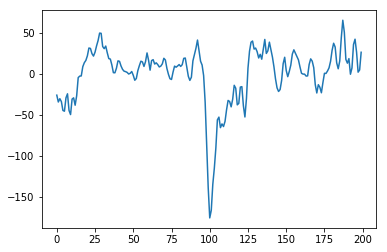

Do you want to save? [Y/n]: 


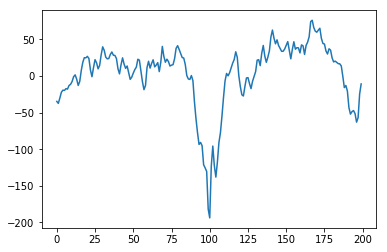

Do you want to save? [Y/n]: n


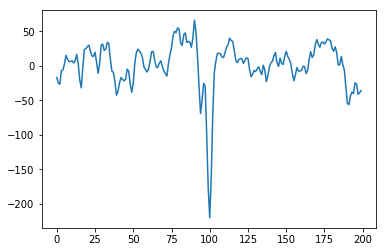

Do you want to save? [Y/n]: 


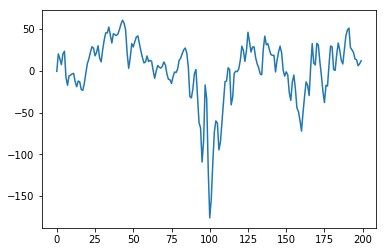

Do you want to save? [Y/n]: 


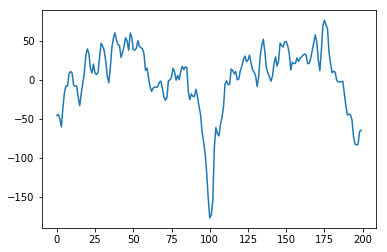

Do you want to save? [Y/n]: 


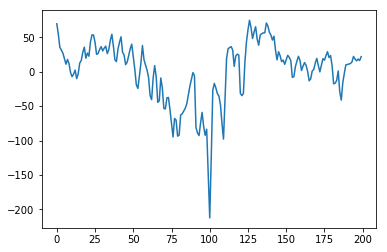

Do you want to save? [Y/n]: 


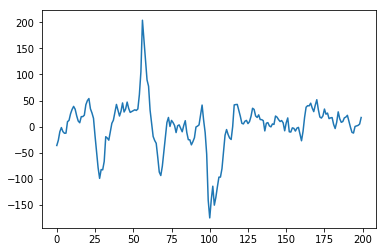

Do you want to save? [Y/n]: n


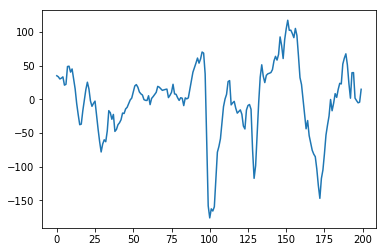

Do you want to save? [Y/n]: 


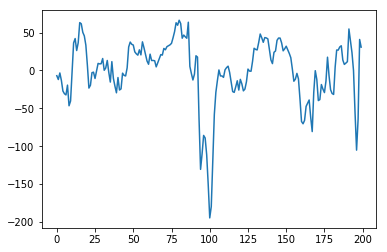

Do you want to save? [Y/n]: 


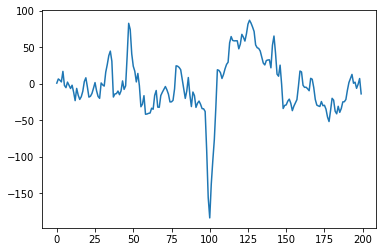

Do you want to save? [Y/n]: 


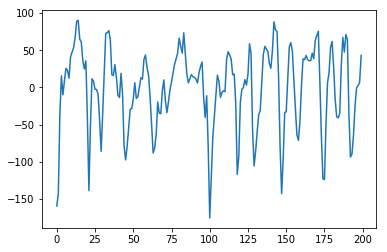

Do you want to save? [Y/n]: 


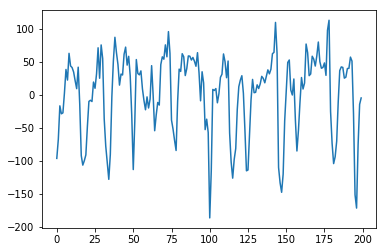

Do you want to save? [Y/n]: n


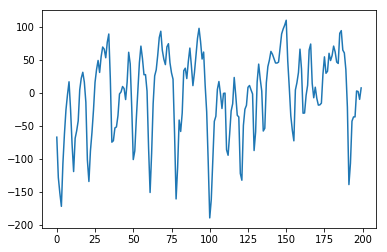

Do you want to save? [Y/n]: n
6 out of 331


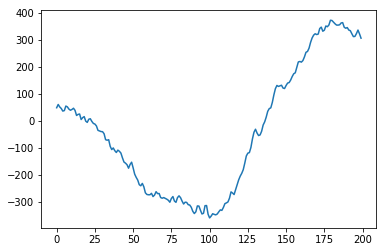

Do you want to save? [Y/n]: n


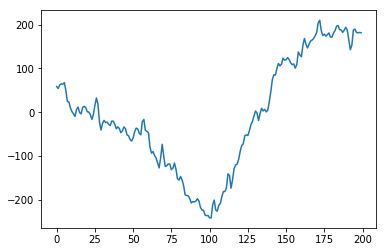

Do you want to save? [Y/n]: n


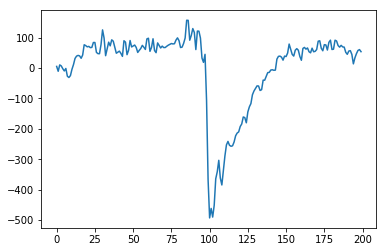

Do you want to save? [Y/n]: 


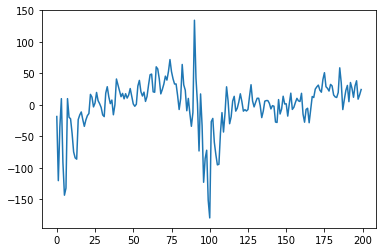

Do you want to save? [Y/n]: n


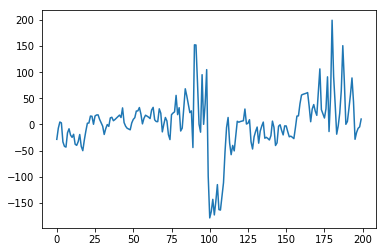

Do you want to save? [Y/n]: n


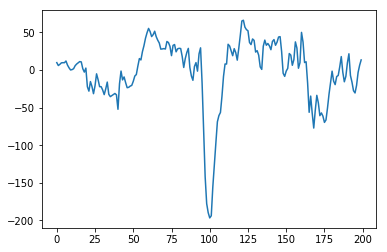

Do you want to save? [Y/n]: 


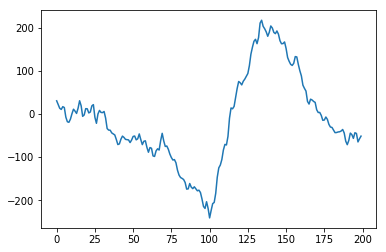

Do you want to save? [Y/n]: n


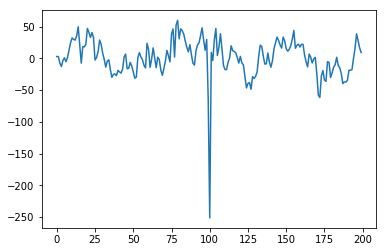

Do you want to save? [Y/n]: n


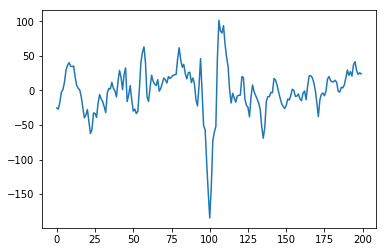

Do you want to save? [Y/n]: 


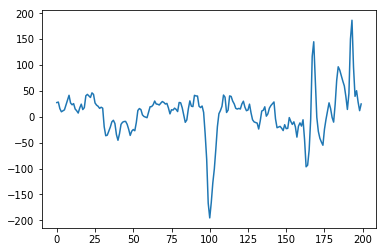

Do you want to save? [Y/n]: 


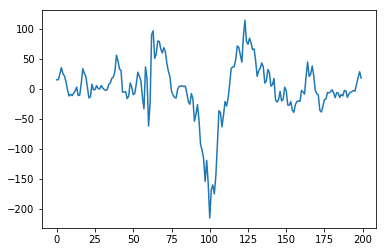

Do you want to save? [Y/n]: n


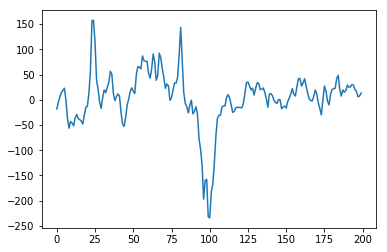

Do you want to save? [Y/n]: 


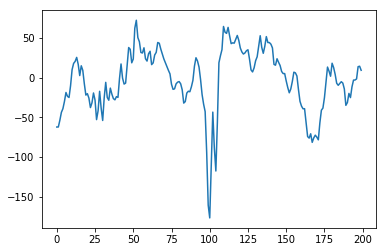

Do you want to save? [Y/n]: 


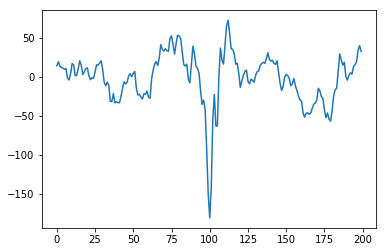

Do you want to save? [Y/n]: 


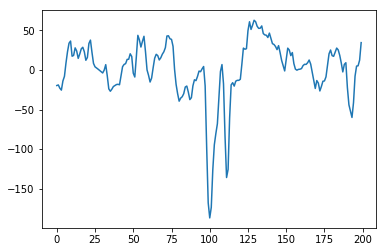

Do you want to save? [Y/n]: 


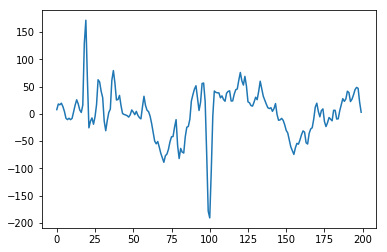

Do you want to save? [Y/n]: 


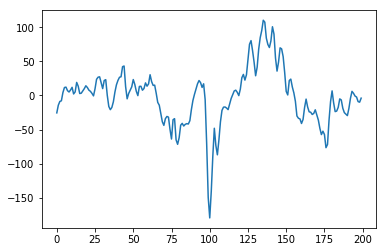

Do you want to save? [Y/n]: 


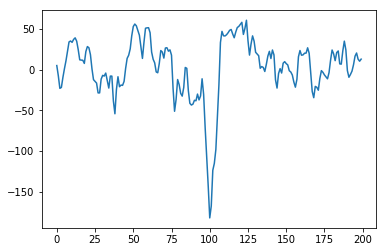

Do you want to save? [Y/n]: 


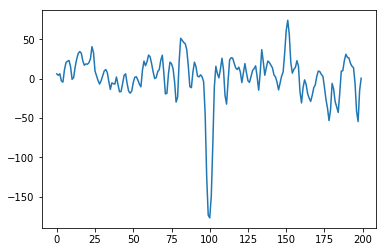

Do you want to save? [Y/n]: 


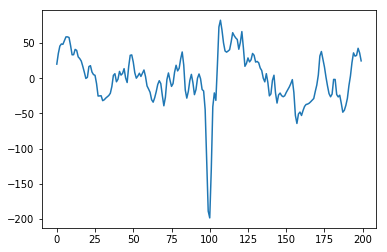

Do you want to save? [Y/n]: 


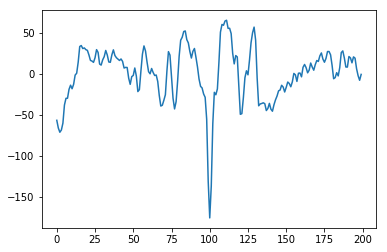

Do you want to save? [Y/n]: 


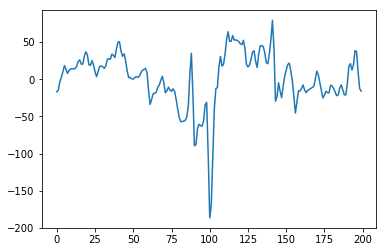

Do you want to save? [Y/n]: 


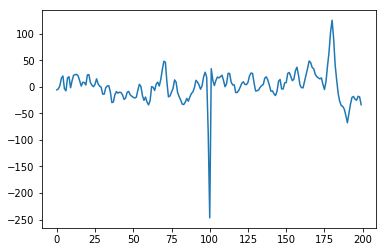

Do you want to save? [Y/n]: n


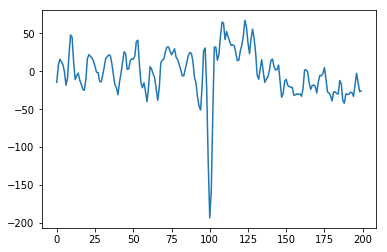

Do you want to save? [Y/n]: 


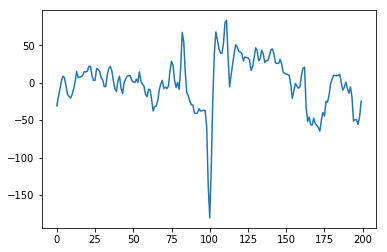

Do you want to save? [Y/n]: 


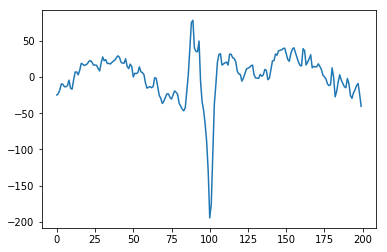

Do you want to save? [Y/n]: 


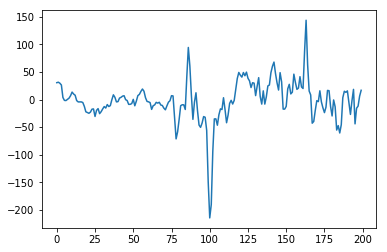

Do you want to save? [Y/n]: 


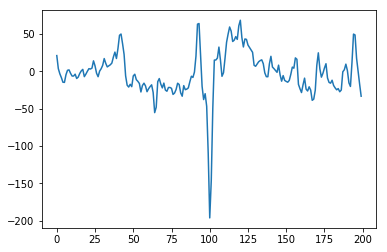

Do you want to save? [Y/n]: 


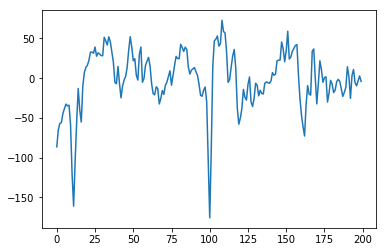

Do you want to save? [Y/n]: 


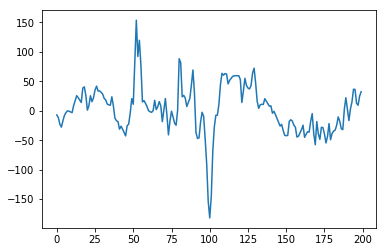

Do you want to save? [Y/n]: 


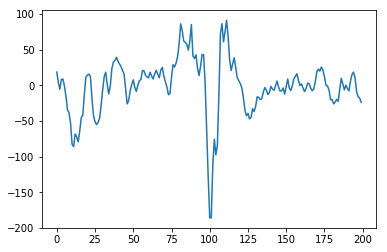

Do you want to save? [Y/n]: 
7 out of 331


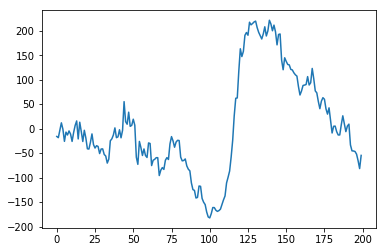

Do you want to save? [Y/n]: n


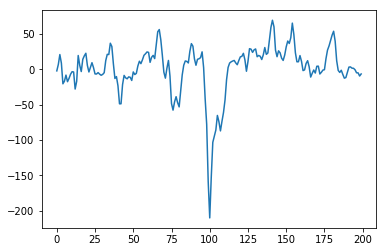

Do you want to save? [Y/n]: 


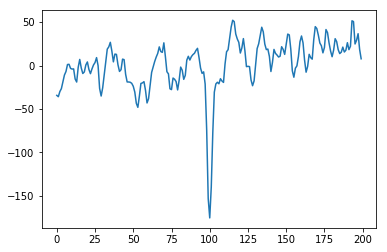

Do you want to save? [Y/n]: 


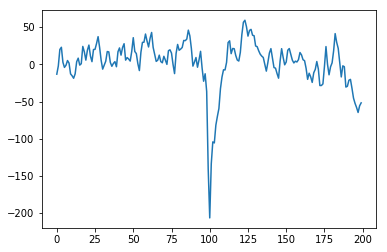

Do you want to save? [Y/n]: 


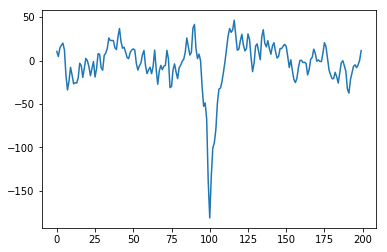

Do you want to save? [Y/n]: 


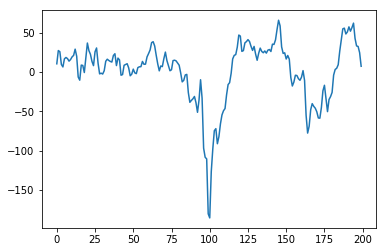

Do you want to save? [Y/n]: 


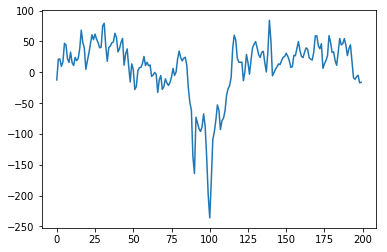

Do you want to save? [Y/n]: n


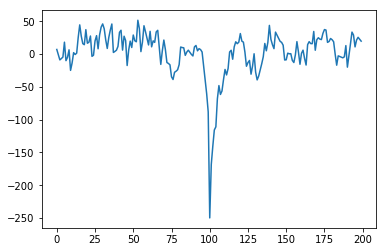

Do you want to save? [Y/n]: 


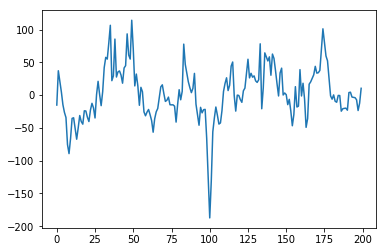

Do you want to save? [Y/n]: 


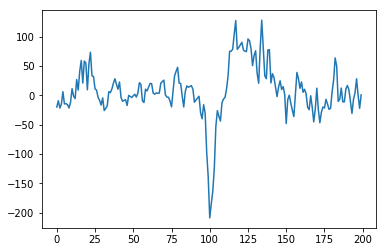

Do you want to save? [Y/n]: 


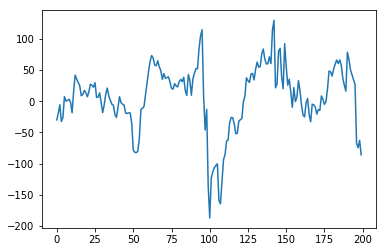

Do you want to save? [Y/n]: 


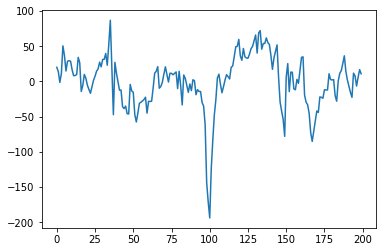

Do you want to save? [Y/n]: 


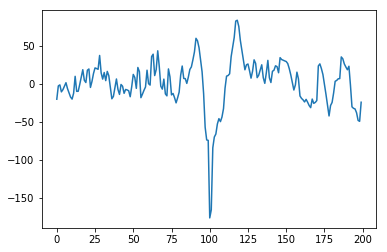

Do you want to save? [Y/n]: 


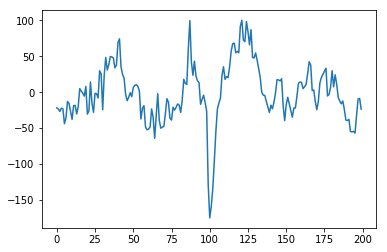

Do you want to save? [Y/n]: 


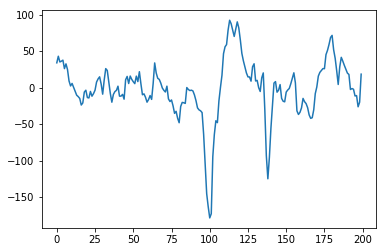

Do you want to save? [Y/n]: 


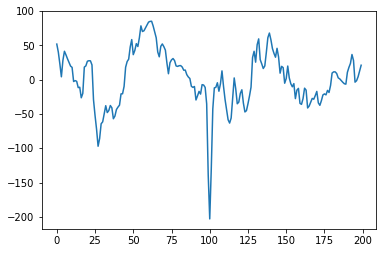

Do you want to save? [Y/n]: 


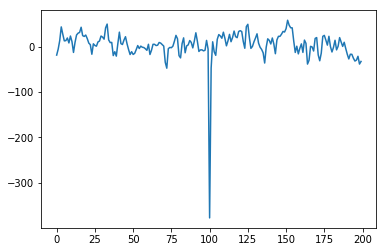

Do you want to save? [Y/n]: n


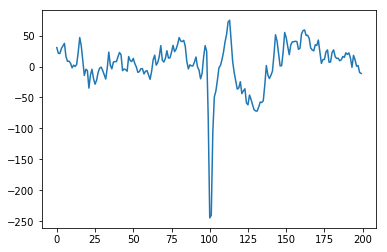

Do you want to save? [Y/n]: 


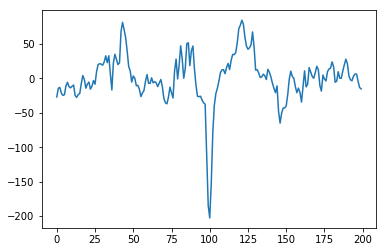

Do you want to save? [Y/n]: 


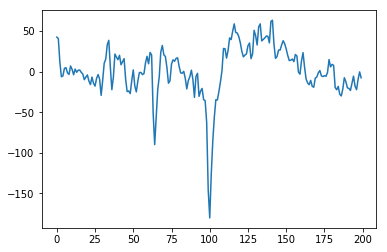

Do you want to save? [Y/n]: 


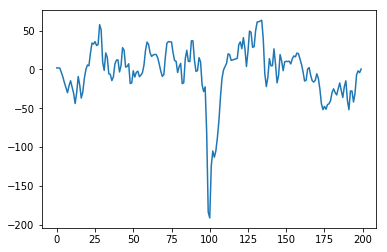

Do you want to save? [Y/n]: 


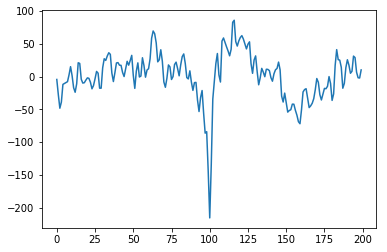

Do you want to save? [Y/n]: 


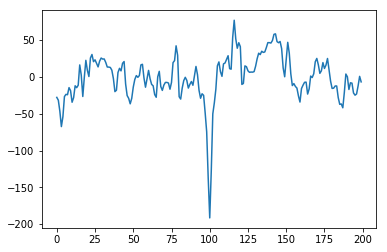

Do you want to save? [Y/n]: 


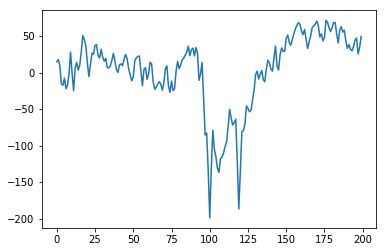

Do you want to save? [Y/n]: n


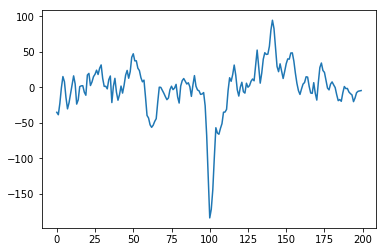

Do you want to save? [Y/n]: 


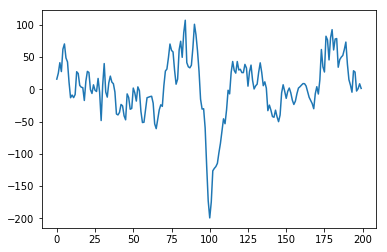

Do you want to save? [Y/n]: n


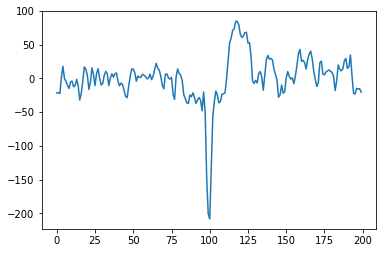

Do you want to save? [Y/n]: 


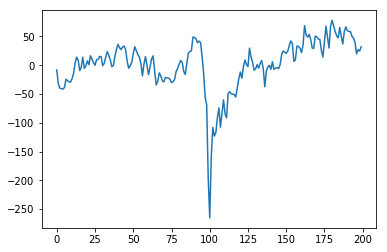

Do you want to save? [Y/n]: 


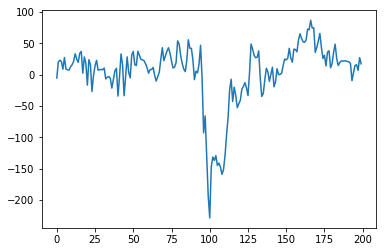

Do you want to save? [Y/n]: n


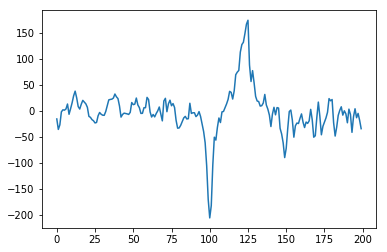

Do you want to save? [Y/n]: 


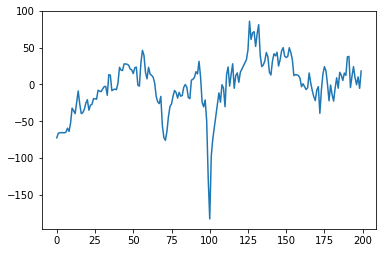

Do you want to save? [Y/n]: 


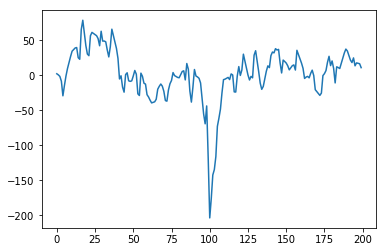

Do you want to save? [Y/n]: 


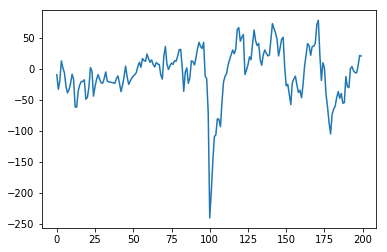

Do you want to save? [Y/n]: 


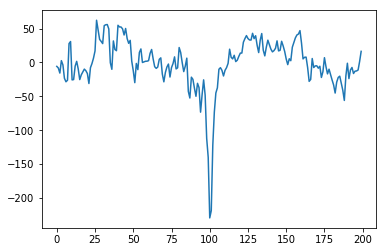

Do you want to save? [Y/n]: 


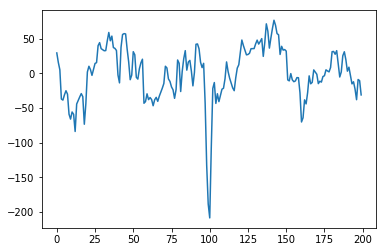

Do you want to save? [Y/n]: 


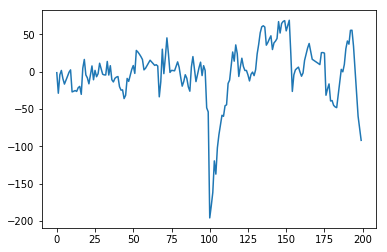

Do you want to save? [Y/n]: 


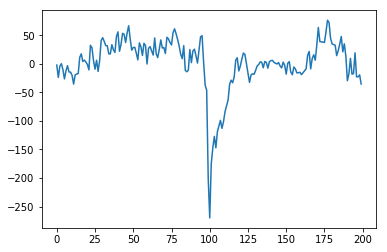

Do you want to save? [Y/n]: 


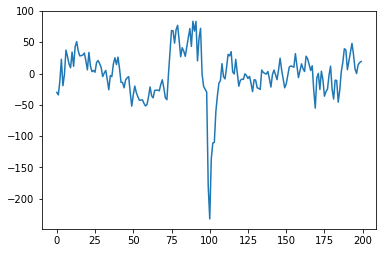

Do you want to save? [Y/n]: 


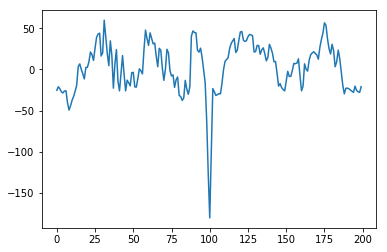

Do you want to save? [Y/n]: 


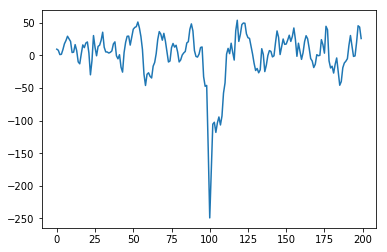

Do you want to save? [Y/n]: 


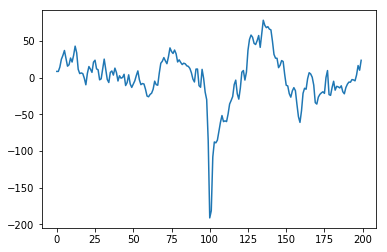

Do you want to save? [Y/n]: 


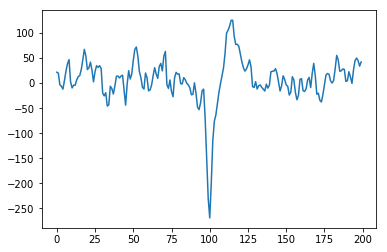

Do you want to save? [Y/n]: 


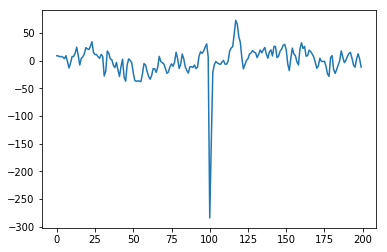

Do you want to save? [Y/n]: 


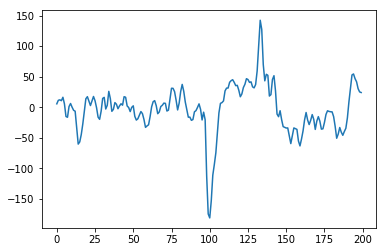

Do you want to save? [Y/n]: 


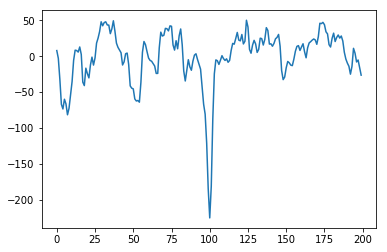

Do you want to save? [Y/n]: 


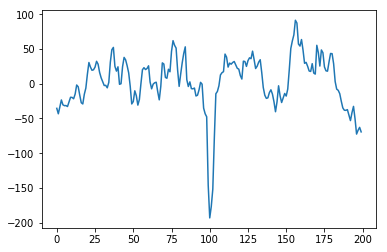

Do you want to save? [Y/n]: 


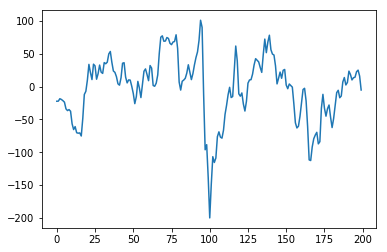

Do you want to save? [Y/n]: 


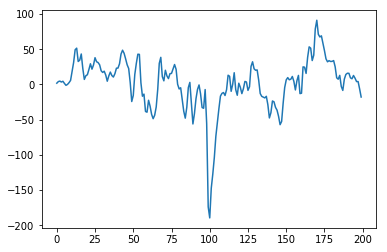

Do you want to save? [Y/n]: 


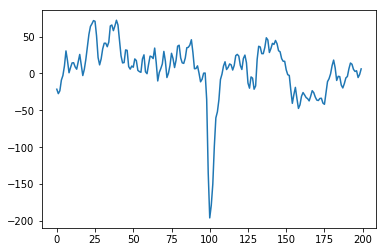

Do you want to save? [Y/n]: 


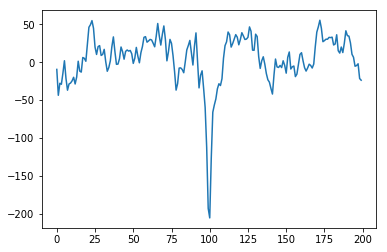

Do you want to save? [Y/n]: 
8 out of 331


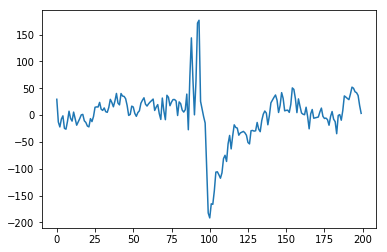

Do you want to save? [Y/n]: 


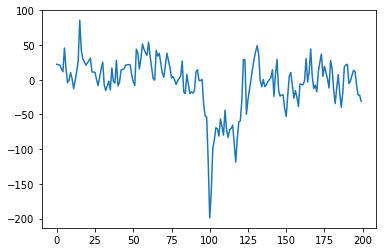

Do you want to save? [Y/n]: 


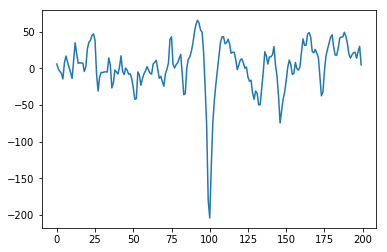

Do you want to save? [Y/n]: 


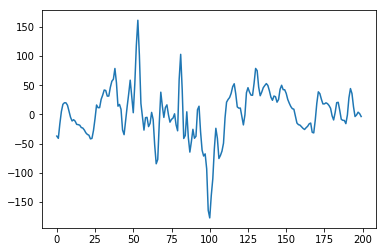

Do you want to save? [Y/n]: n


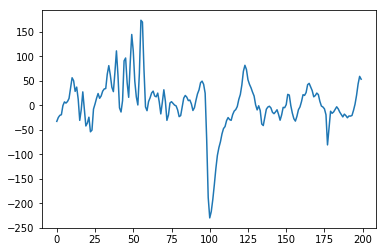

Do you want to save? [Y/n]: 


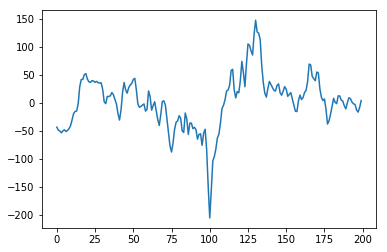

Do you want to save? [Y/n]: 


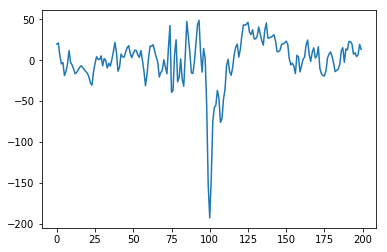

Do you want to save? [Y/n]: 


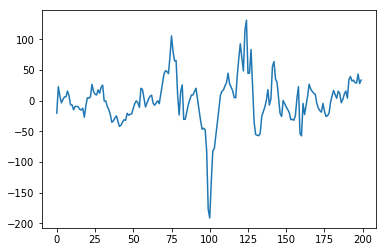

Do you want to save? [Y/n]: 


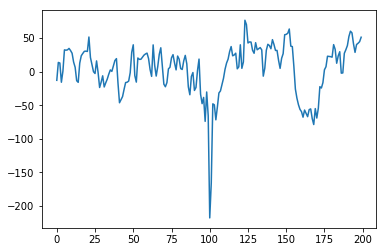

Do you want to save? [Y/n]: 


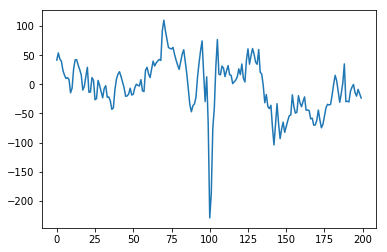

Do you want to save? [Y/n]: 


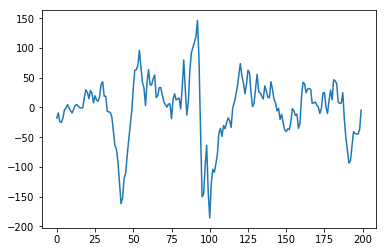

Do you want to save? [Y/n]: n


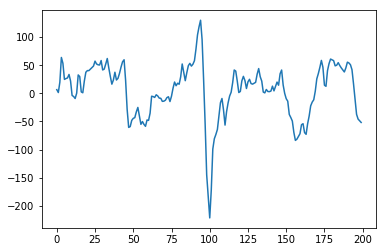

Do you want to save? [Y/n]: 


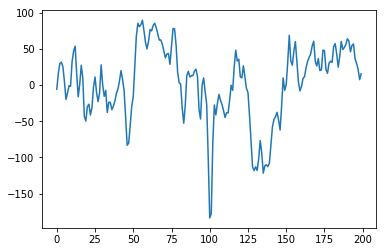

Do you want to save? [Y/n]: n


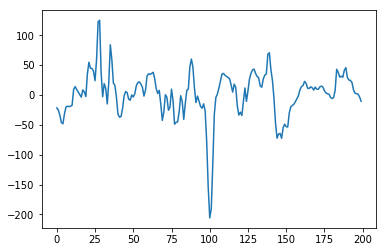

Do you want to save? [Y/n]: 


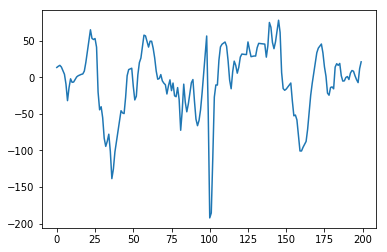

Do you want to save? [Y/n]: 


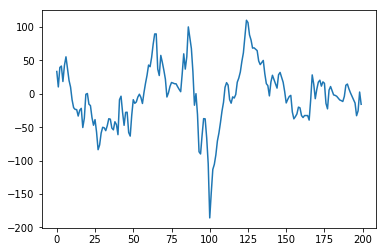

Do you want to save? [Y/n]: n


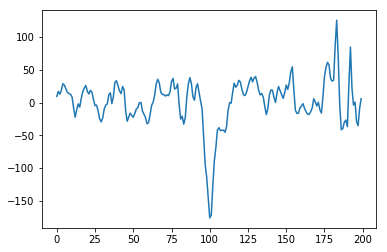

Do you want to save? [Y/n]: 


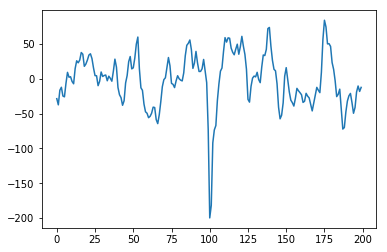

Do you want to save? [Y/n]: 


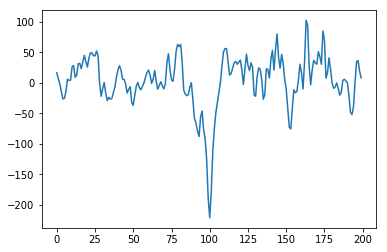

Do you want to save? [Y/n]: 


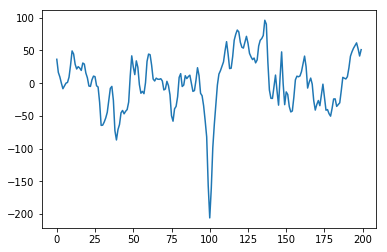

Do you want to save? [Y/n]: 


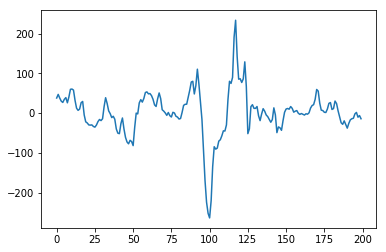

Do you want to save? [Y/n]: 


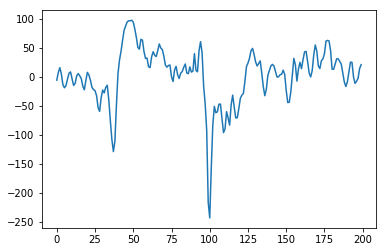

Do you want to save? [Y/n]: 


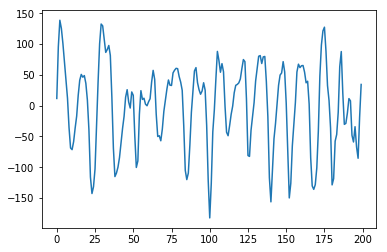

Do you want to save? [Y/n]: n


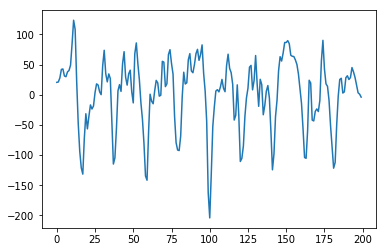

Do you want to save? [Y/n]: n


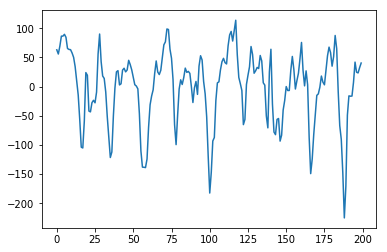

Do you want to save? [Y/n]: n


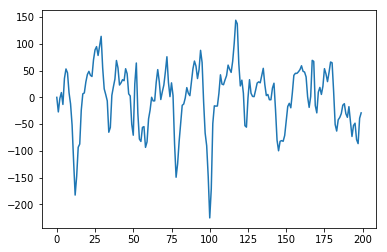

Do you want to save? [Y/n]: n


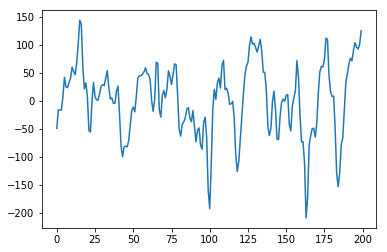

Do you want to save? [Y/n]: n


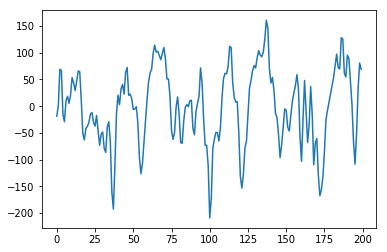

Do you want to save? [Y/n]: n


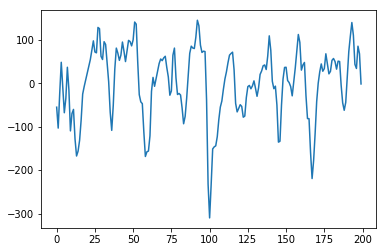

Do you want to save? [Y/n]: n


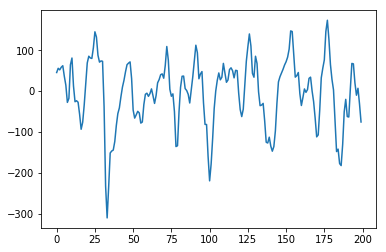

Do you want to save? [Y/n]: n


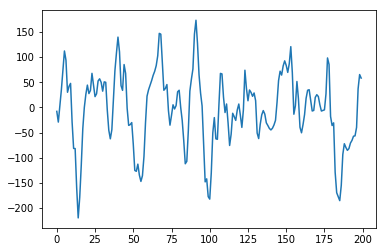

Do you want to save? [Y/n]: n


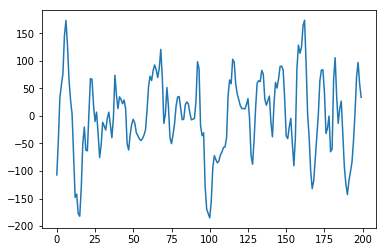

Do you want to save? [Y/n]: n


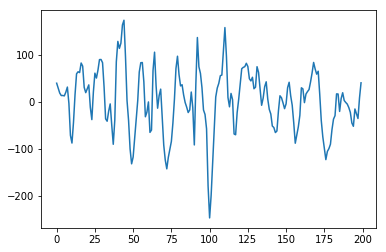

Do you want to save? [Y/n]: n


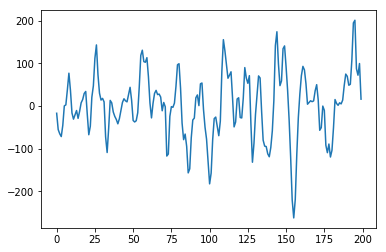

Do you want to save? [Y/n]: n


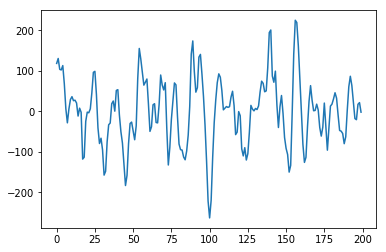

Do you want to save? [Y/n]: n


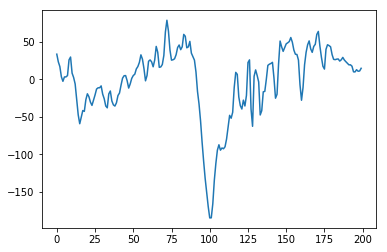

Do you want to save? [Y/n]: 


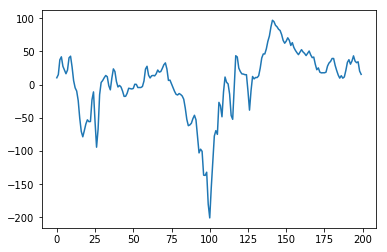

Do you want to save? [Y/n]: n


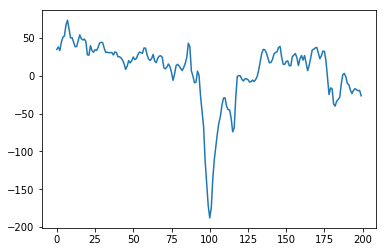

Do you want to save? [Y/n]: 


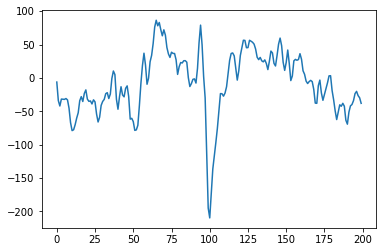

Do you want to save? [Y/n]: 


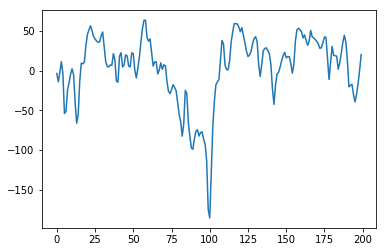

Do you want to save? [Y/n]: 


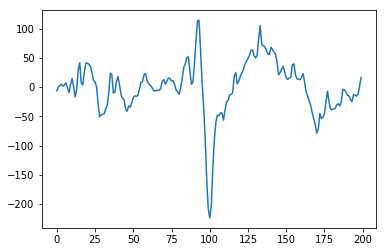

Do you want to save? [Y/n]: 


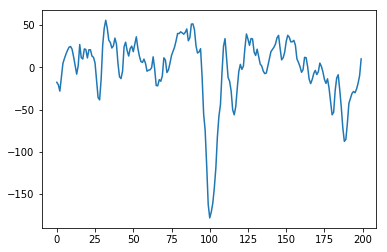

Do you want to save? [Y/n]: 


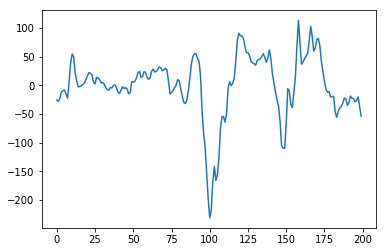

Do you want to save? [Y/n]: 


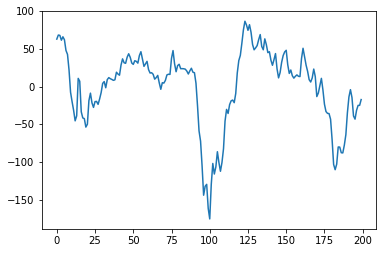

Do you want to save? [Y/n]: n


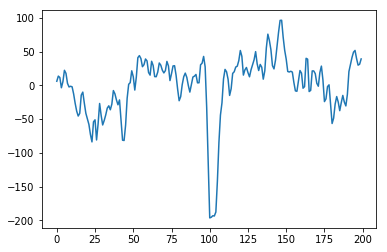

Do you want to save? [Y/n]: 


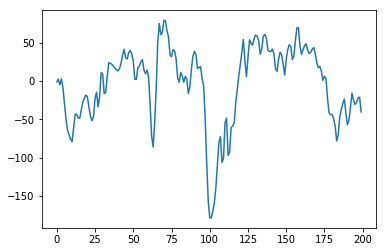

Do you want to save? [Y/n]: 


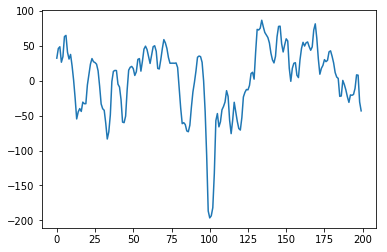

Do you want to save? [Y/n]: 


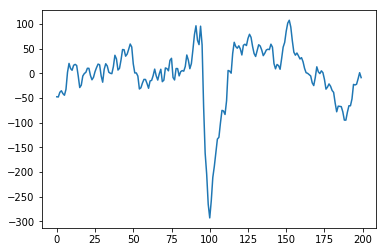

Do you want to save? [Y/n]: 


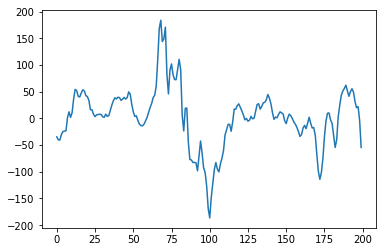

Do you want to save? [Y/n]: 


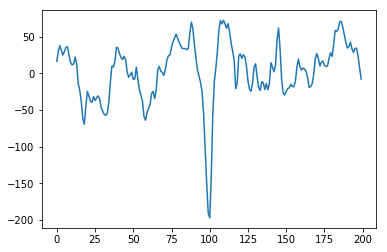

Do you want to save? [Y/n]: 
9 out of 331


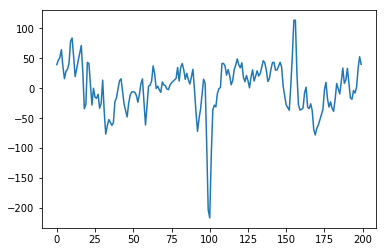

Do you want to save? [Y/n]: 


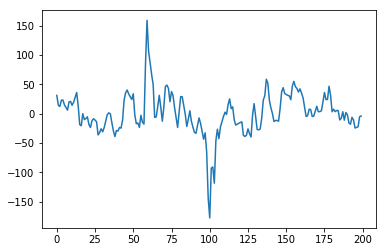

Do you want to save? [Y/n]: 


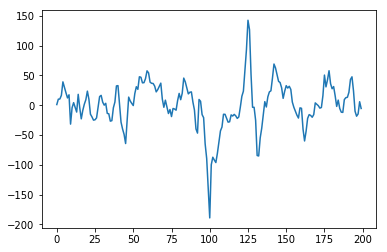

Do you want to save? [Y/n]: 


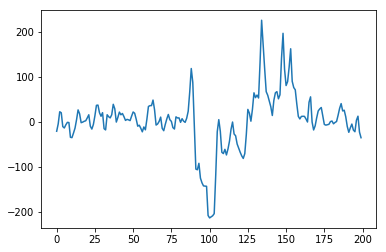

Do you want to save? [Y/n]: 


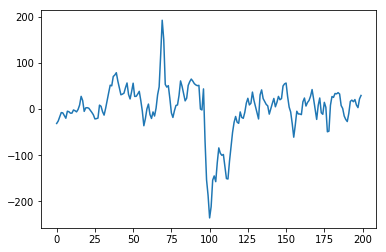

Do you want to save? [Y/n]: 


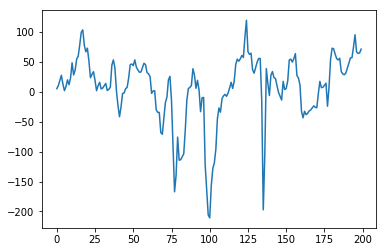

Do you want to save? [Y/n]: 


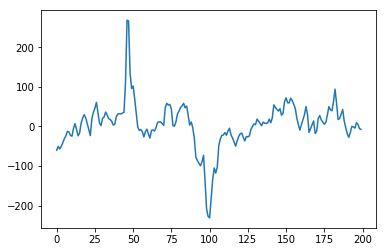

Do you want to save? [Y/n]: n


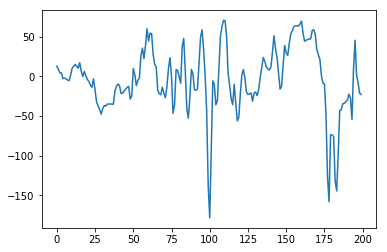

Do you want to save? [Y/n]: 


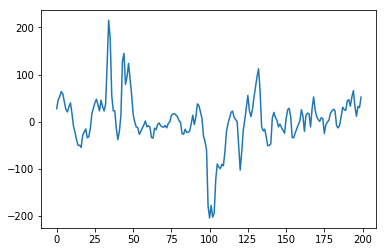

Do you want to save? [Y/n]: n


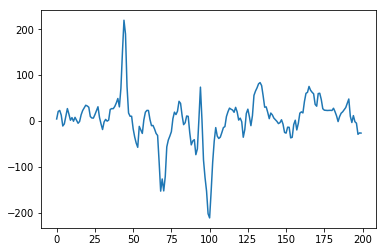

Do you want to save? [Y/n]: 


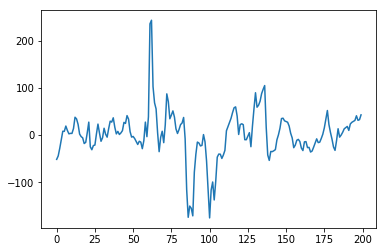

Do you want to save? [Y/n]: n


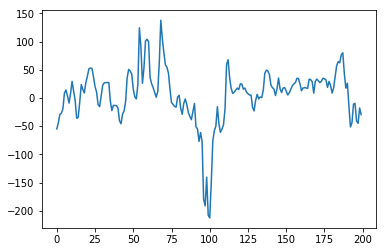

Do you want to save? [Y/n]: n


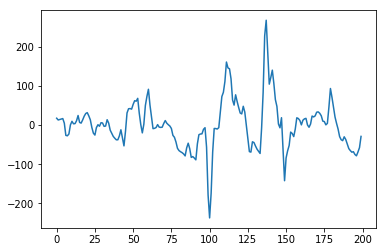

Do you want to save? [Y/n]: n


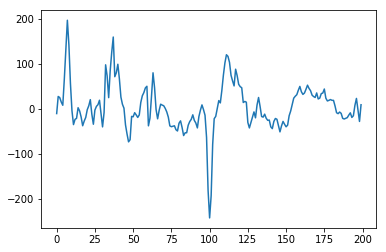

Do you want to save? [Y/n]: 


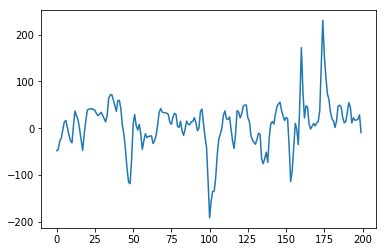

Do you want to save? [Y/n]: 


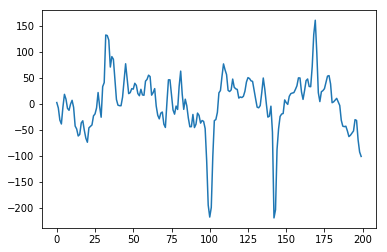

Do you want to save? [Y/n]: 


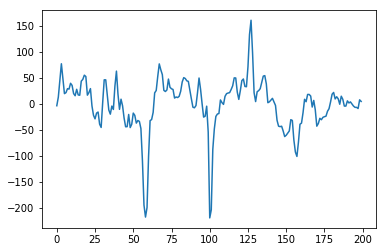

Do you want to save? [Y/n]: 


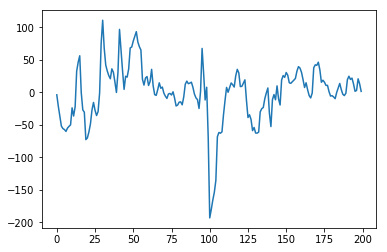

Do you want to save? [Y/n]: 


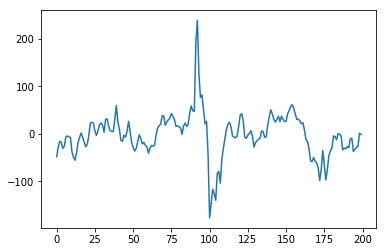

Do you want to save? [Y/n]: 


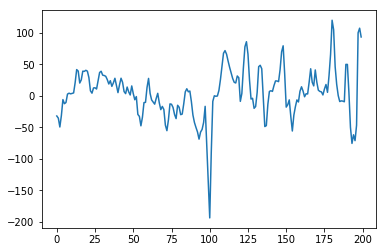

Do you want to save? [Y/n]: n


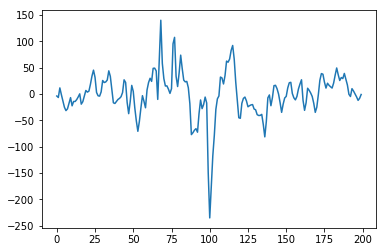

Do you want to save? [Y/n]: 


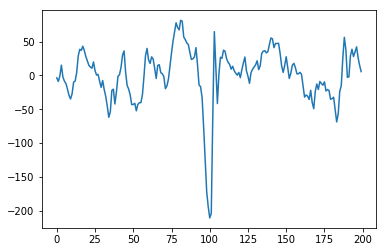

Do you want to save? [Y/n]: 


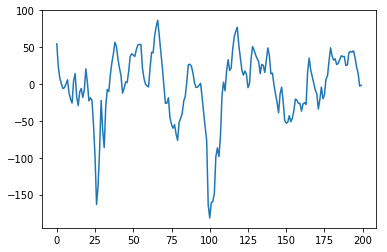

Do you want to save? [Y/n]: 


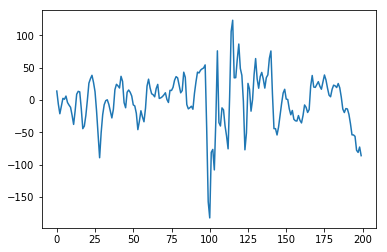

Do you want to save? [Y/n]: 


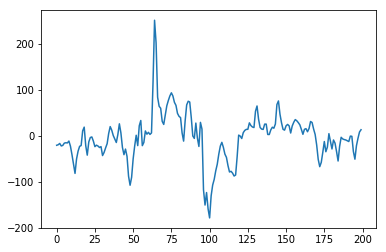

Do you want to save? [Y/n]: n


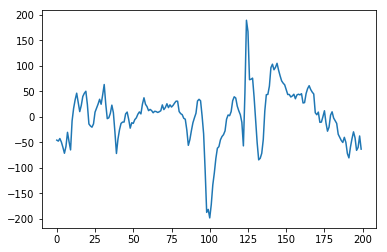

Do you want to save? [Y/n]: 


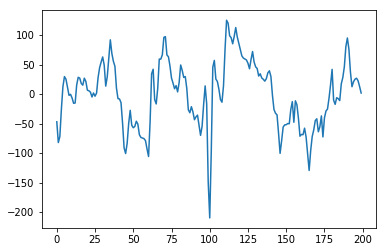

Do you want to save? [Y/n]: 


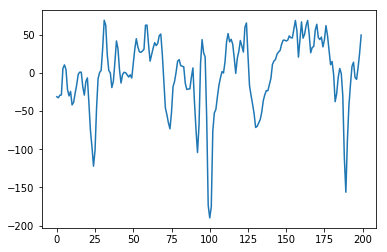

Do you want to save? [Y/n]: 


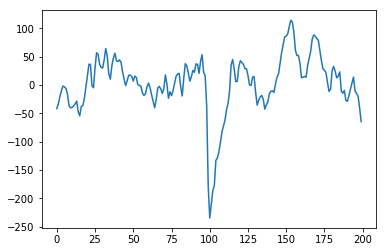

Do you want to save? [Y/n]: 


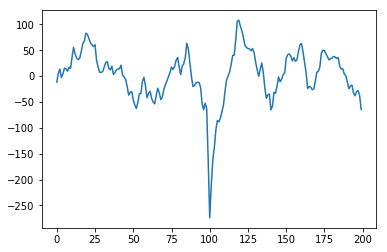

Do you want to save? [Y/n]: 


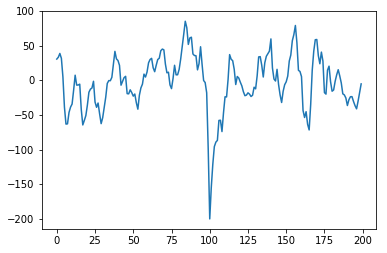

Do you want to save? [Y/n]: 


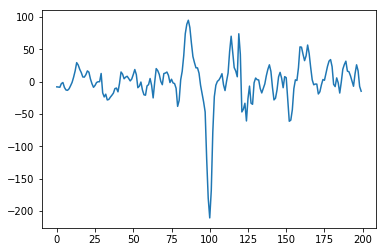

Do you want to save? [Y/n]: 


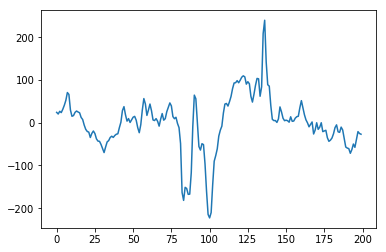

Do you want to save? [Y/n]: n


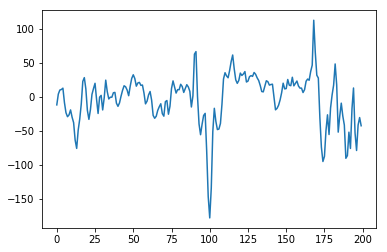

Do you want to save? [Y/n]: 


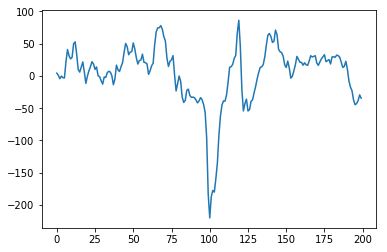

Do you want to save? [Y/n]: 


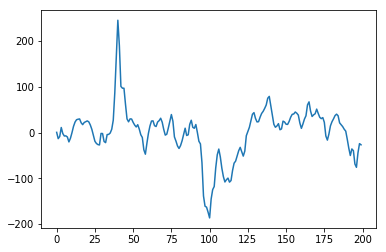

Do you want to save? [Y/n]: n


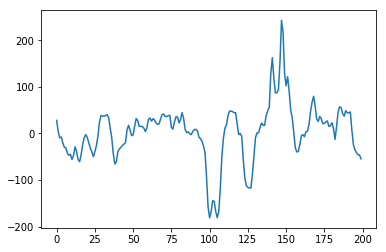

Do you want to save? [Y/n]: n


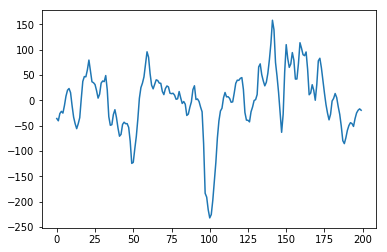

Do you want to save? [Y/n]: 


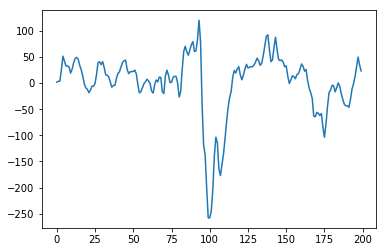

Do you want to save? [Y/n]: 


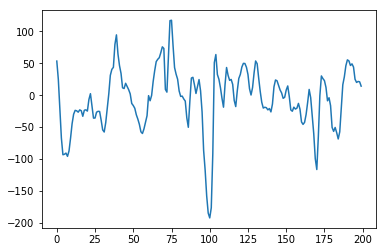

Do you want to save? [Y/n]: 


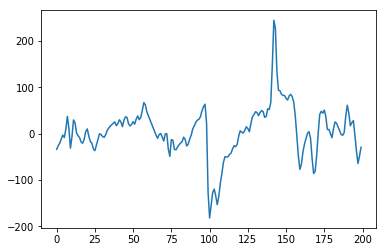

Do you want to save? [Y/n]: n


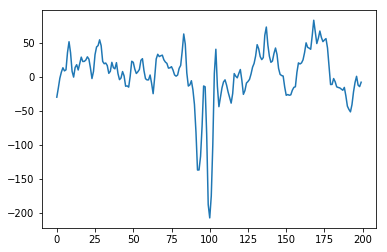

Do you want to save? [Y/n]: 


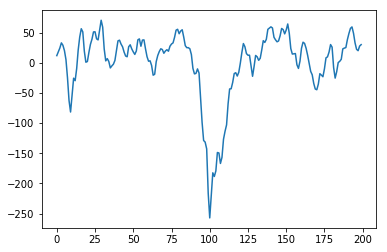

Do you want to save? [Y/n]: 


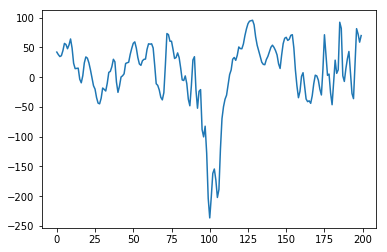

Do you want to save? [Y/n]: n


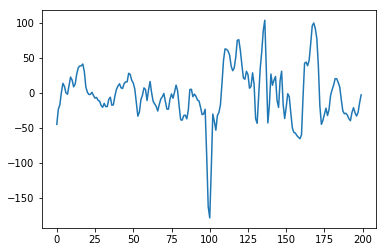

Do you want to save? [Y/n]: 


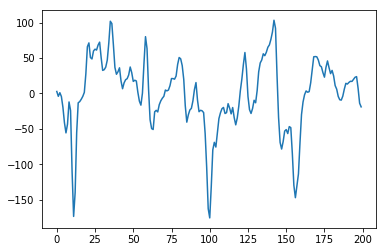

Do you want to save? [Y/n]: 


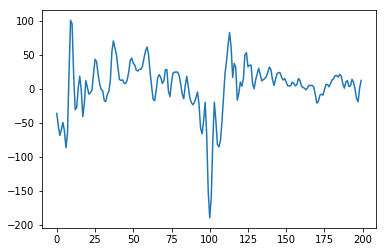

Do you want to save? [Y/n]: n


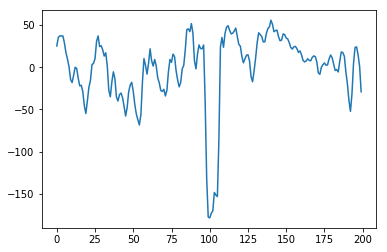

Do you want to save? [Y/n]: 


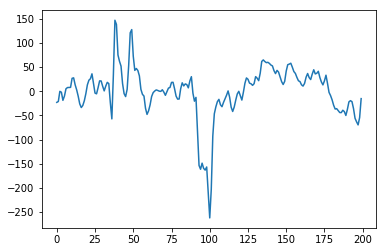

Do you want to save? [Y/n]: n


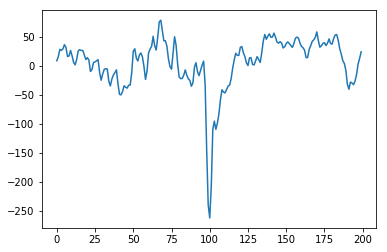

Do you want to save? [Y/n]: 
10 out of 331


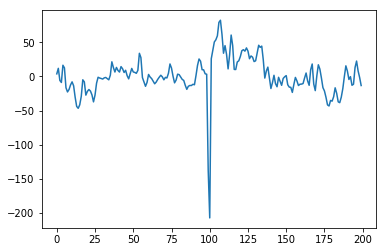

Do you want to save? [Y/n]: 


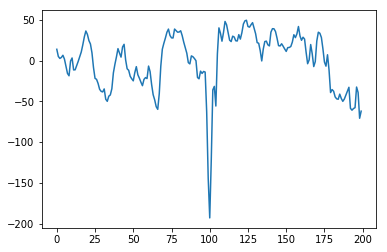

Do you want to save? [Y/n]: 


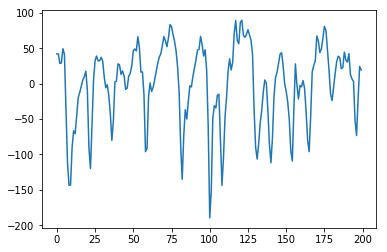

Do you want to save? [Y/n]: n


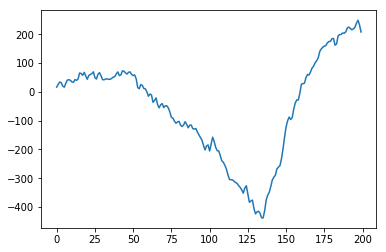

Do you want to save? [Y/n]: n


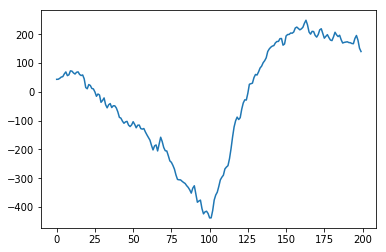

Do you want to save? [Y/n]: n


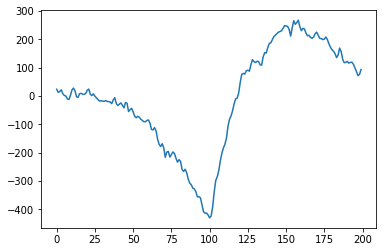

Do you want to save? [Y/n]: n
11 out of 331


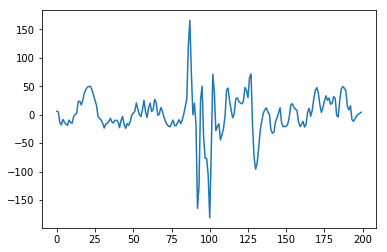

Do you want to save? [Y/n]: n


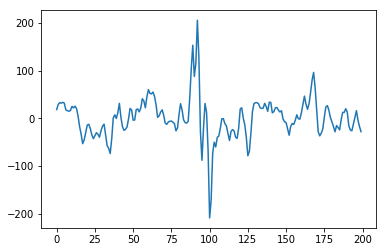

Do you want to save? [Y/n]: n


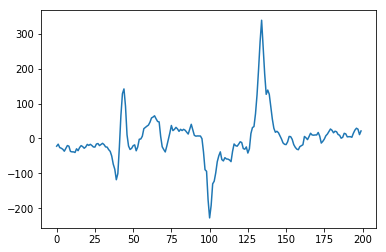

Do you want to save? [Y/n]: n


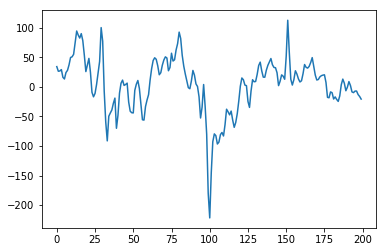

Do you want to save? [Y/n]: 


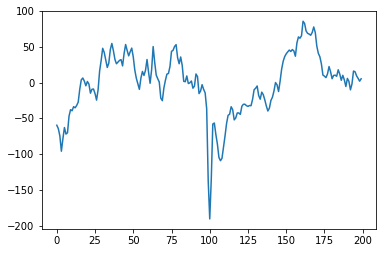

Do you want to save? [Y/n]: 


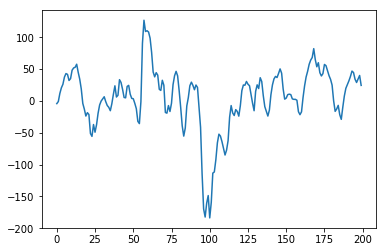

Do you want to save? [Y/n]: 


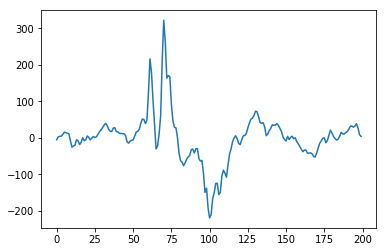

Do you want to save? [Y/n]: 


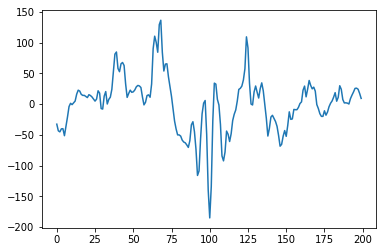

Do you want to save? [Y/n]: 


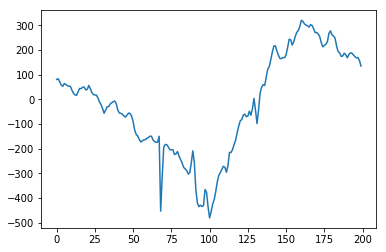

Do you want to save? [Y/n]: n


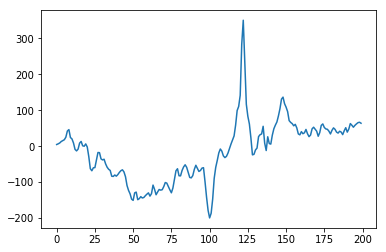

Do you want to save? [Y/n]: n


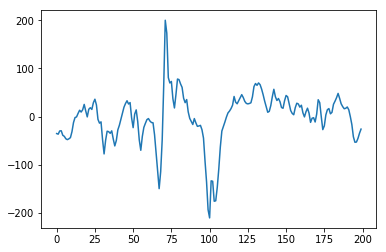

Do you want to save? [Y/n]: n


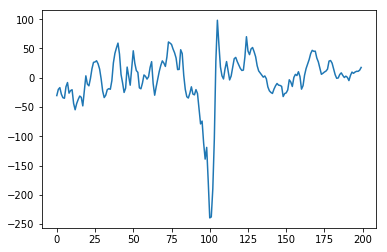

Do you want to save? [Y/n]: 


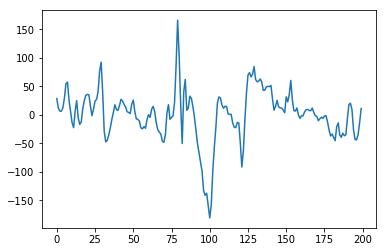

Do you want to save? [Y/n]: n


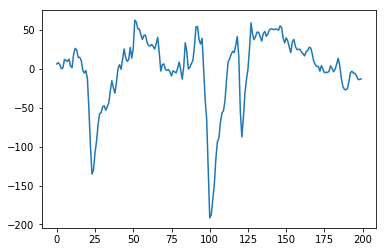

Do you want to save? [Y/n]: 


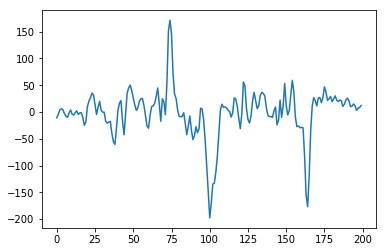

Do you want to save? [Y/n]: 


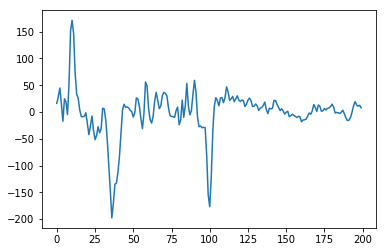

Do you want to save? [Y/n]: 


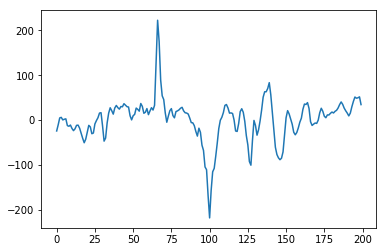

Do you want to save? [Y/n]: 


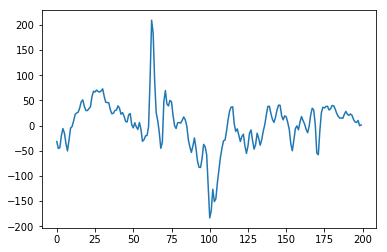

Do you want to save? [Y/n]: n


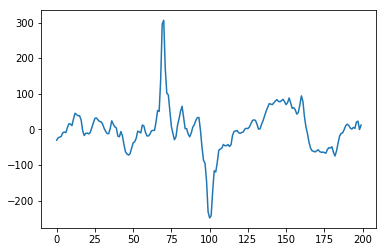

Do you want to save? [Y/n]: 


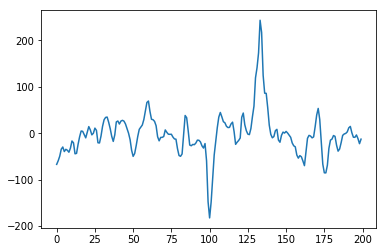

Do you want to save? [Y/n]: 


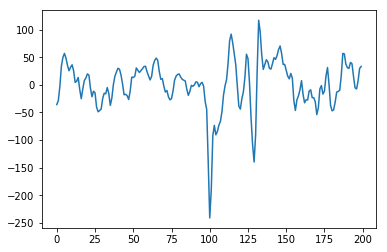

Do you want to save? [Y/n]: 


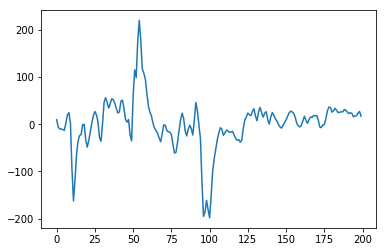

Do you want to save? [Y/n]: 


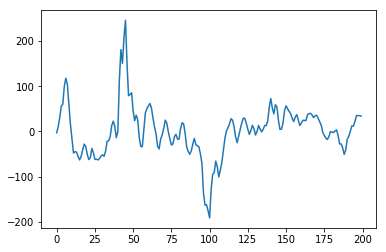

Do you want to save? [Y/n]: 


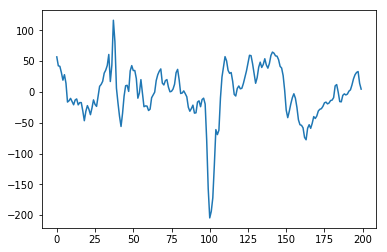

Do you want to save? [Y/n]: 


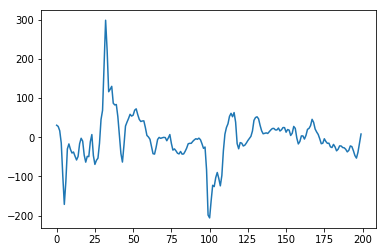

Do you want to save? [Y/n]: 


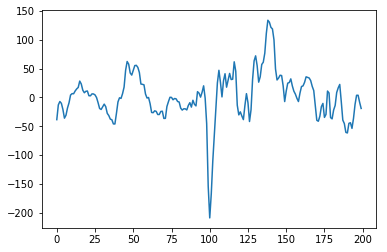

Do you want to save? [Y/n]: 


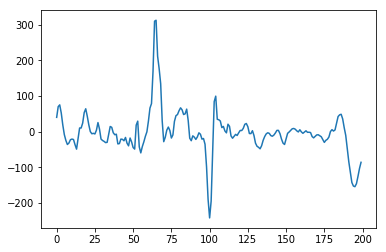

Do you want to save? [Y/n]: 


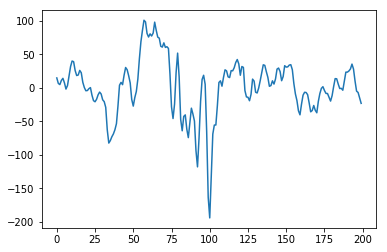

Do you want to save? [Y/n]: 


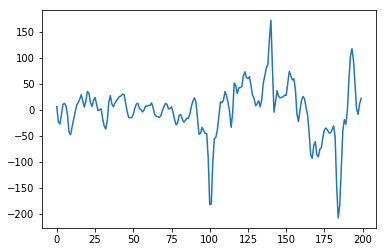

Do you want to save? [Y/n]: 


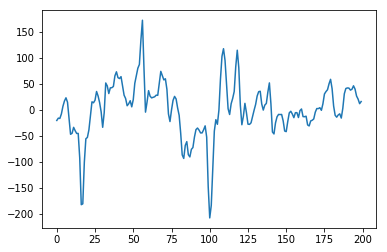

Do you want to save? [Y/n]: 


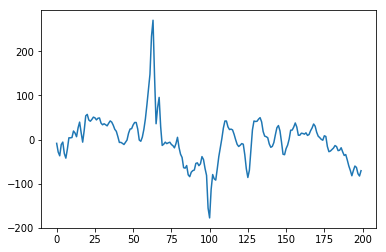

Do you want to save? [Y/n]: 


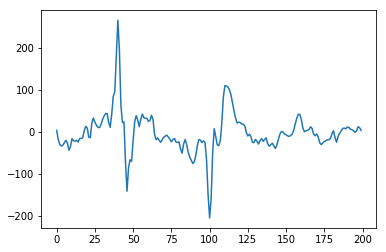

Do you want to save? [Y/n]: 


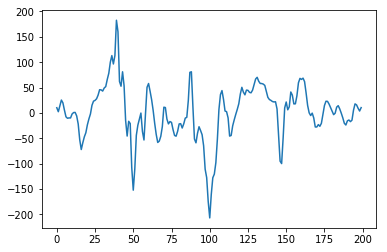

Do you want to save? [Y/n]: 


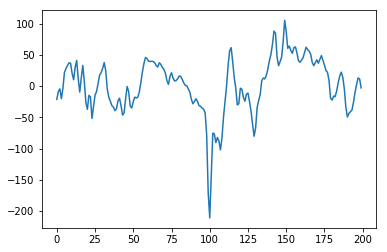

Do you want to save? [Y/n]: 


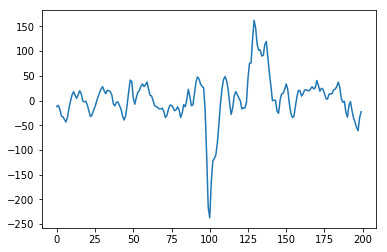

Do you want to save? [Y/n]: 


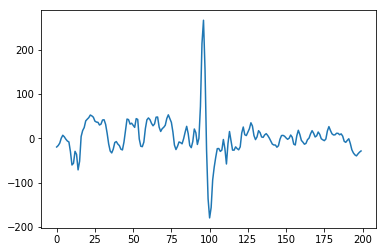

Do you want to save? [Y/n]: 


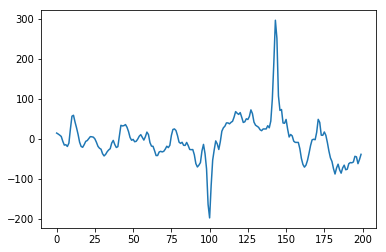

Do you want to save? [Y/n]: 


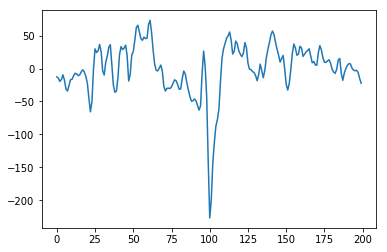

Do you want to save? [Y/n]: 


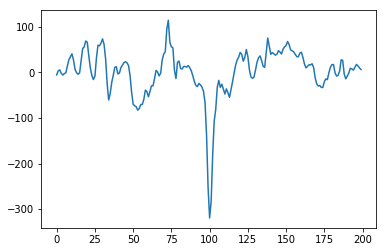

Do you want to save? [Y/n]: 


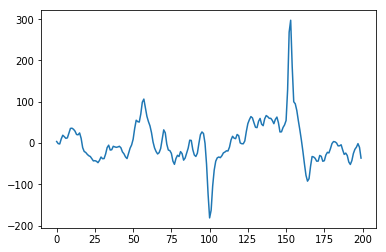

Do you want to save? [Y/n]: 


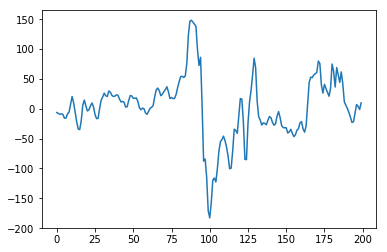

Do you want to save? [Y/n]: 


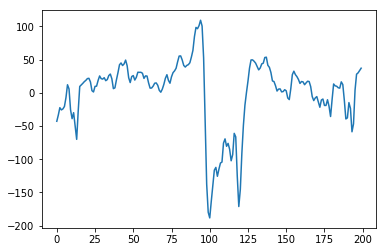

Do you want to save? [Y/n]: 


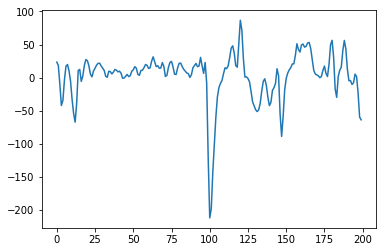

Do you want to save? [Y/n]: 


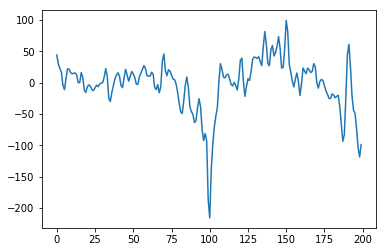

Do you want to save? [Y/n]: 


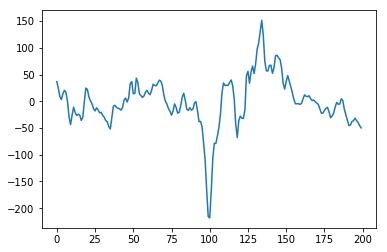

Do you want to save? [Y/n]: 


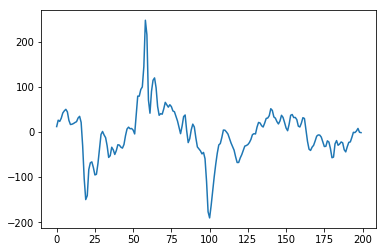

Do you want to save? [Y/n]: 


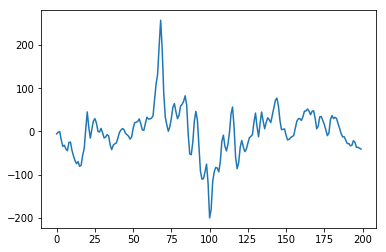

Do you want to save? [Y/n]: 


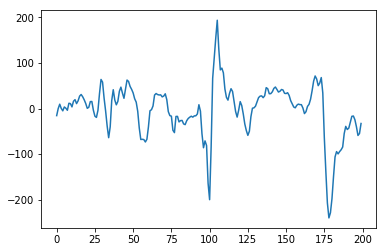

Do you want to save? [Y/n]: 


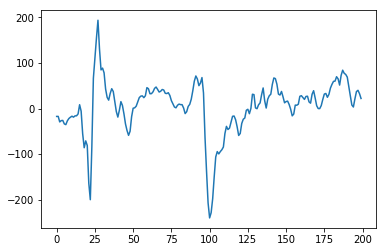

Do you want to save? [Y/n]: 


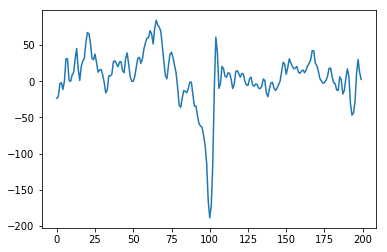

Do you want to save? [Y/n]: 
12 out of 331


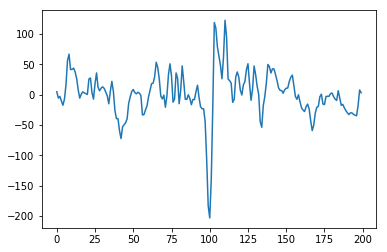

Do you want to save? [Y/n]: 


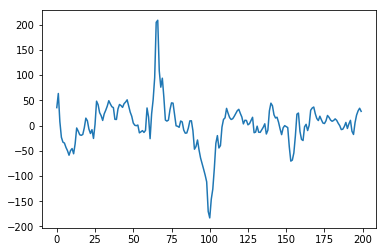

Do you want to save? [Y/n]: 


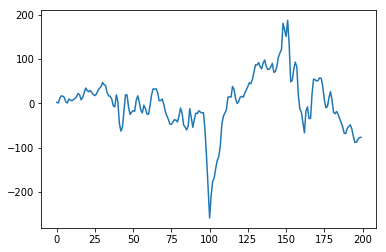

Do you want to save? [Y/n]: 


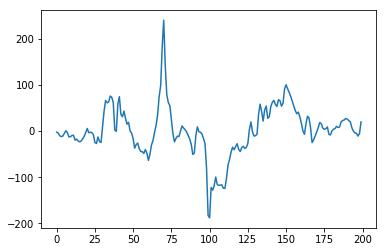

Do you want to save? [Y/n]: 


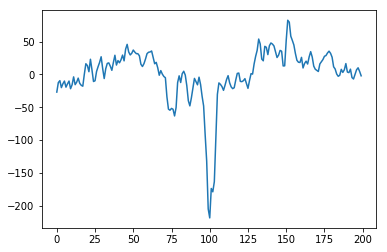

Do you want to save? [Y/n]: 


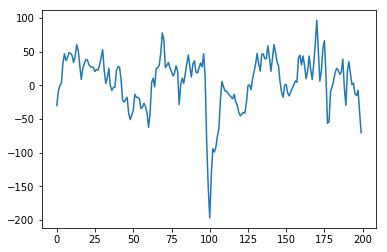

Do you want to save? [Y/n]: 


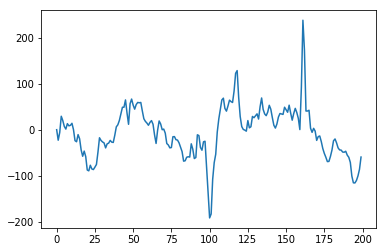

Do you want to save? [Y/n]: 


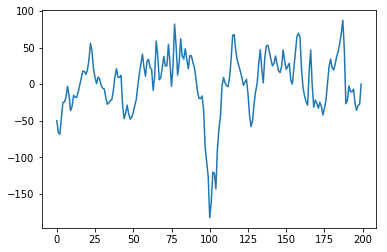

Do you want to save? [Y/n]: 


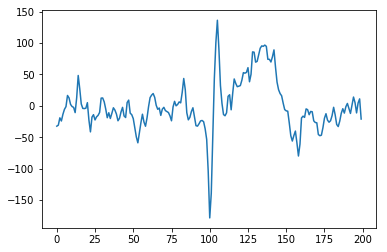

Do you want to save? [Y/n]: 


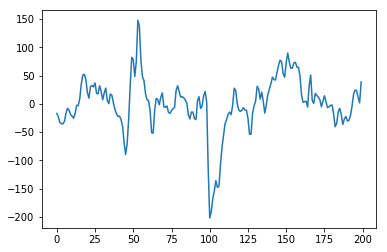

Do you want to save? [Y/n]: 


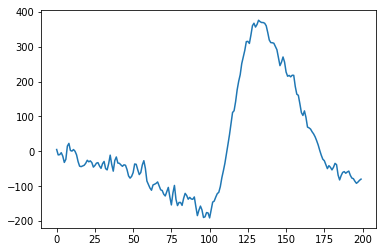

Do you want to save? [Y/n]: n


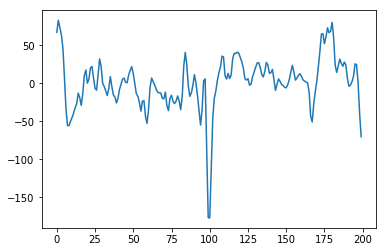

Do you want to save? [Y/n]: 


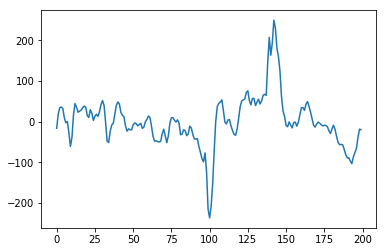

Do you want to save? [Y/n]: n


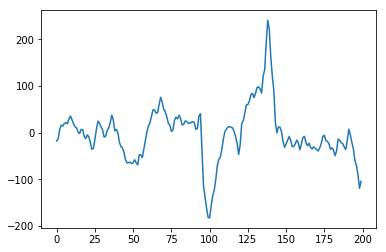

Do you want to save? [Y/n]: n


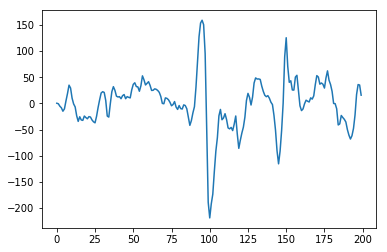

Do you want to save? [Y/n]: n


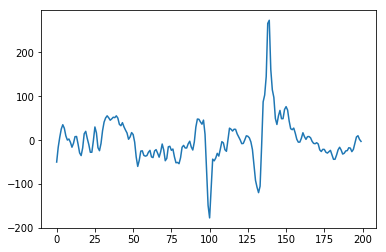

Do you want to save? [Y/n]: 


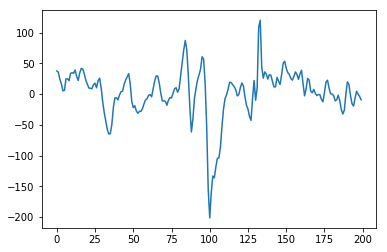

Do you want to save? [Y/n]: 


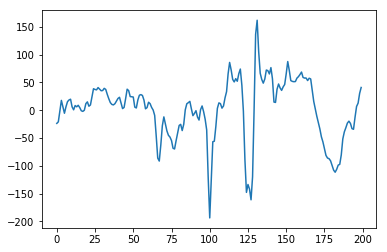

Do you want to save? [Y/n]: 


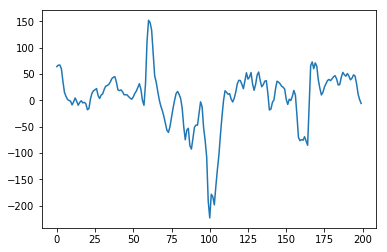

Do you want to save? [Y/n]: 


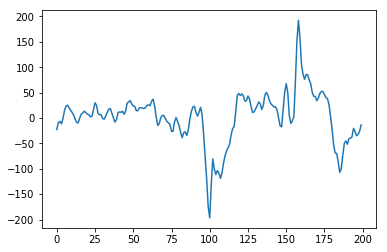

Do you want to save? [Y/n]: 


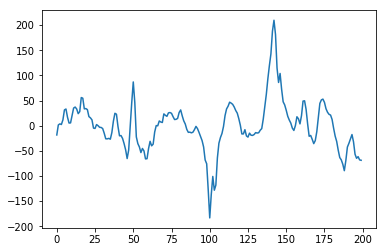

Do you want to save? [Y/n]: 


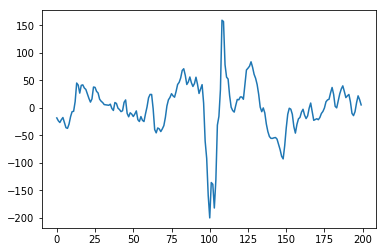

Do you want to save? [Y/n]: 


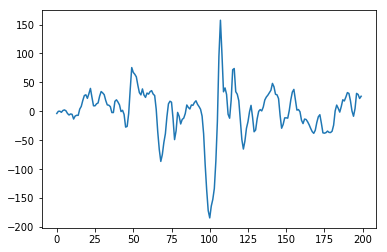

Do you want to save? [Y/n]: 


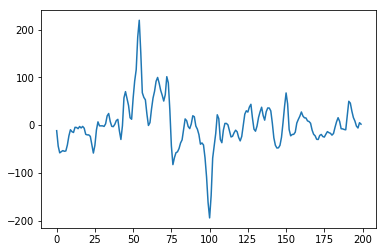

Do you want to save? [Y/n]: 


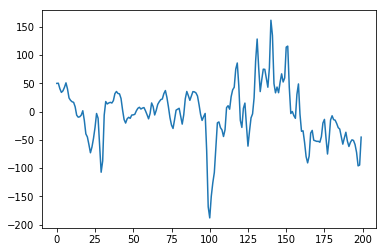

Do you want to save? [Y/n]: 


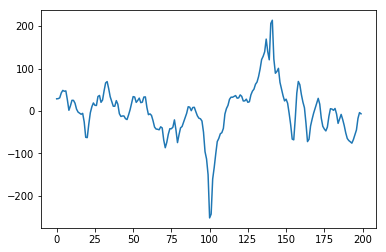

Do you want to save? [Y/n]: 


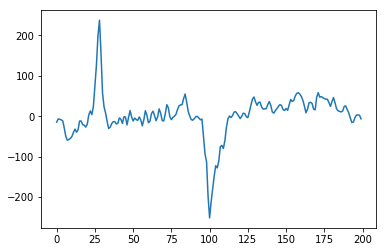

Do you want to save? [Y/n]: 


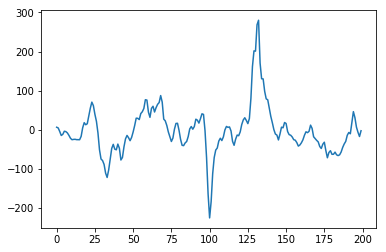

Do you want to save? [Y/n]: 


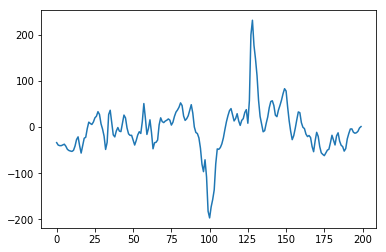

Do you want to save? [Y/n]: 


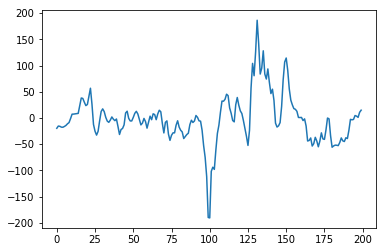

Do you want to save? [Y/n]: 


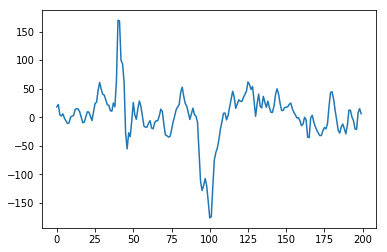

Do you want to save? [Y/n]: 


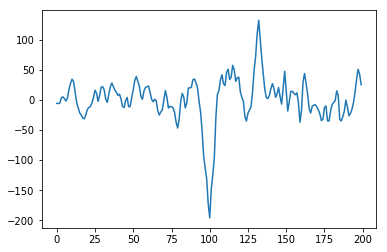

Do you want to save? [Y/n]: 


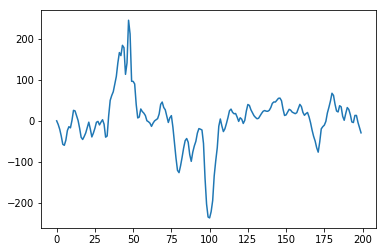

Do you want to save? [Y/n]: 


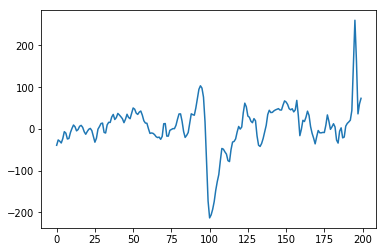

Do you want to save? [Y/n]: 


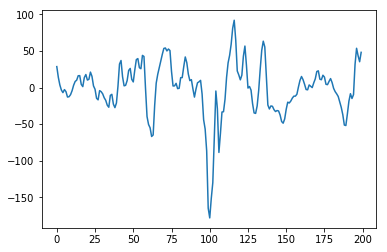

Do you want to save? [Y/n]: 


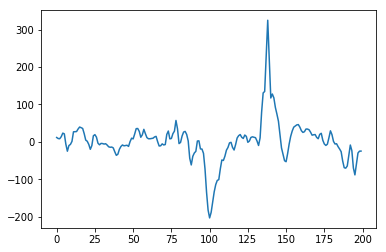

Do you want to save? [Y/n]: 


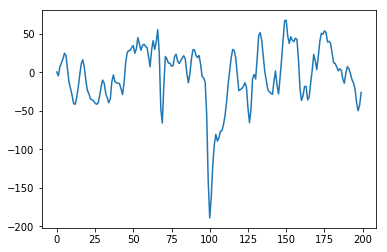

Do you want to save? [Y/n]: 


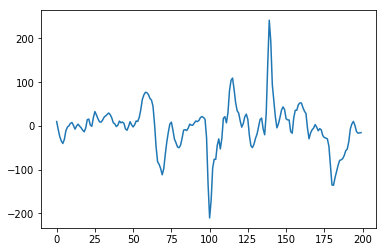

Do you want to save? [Y/n]: 


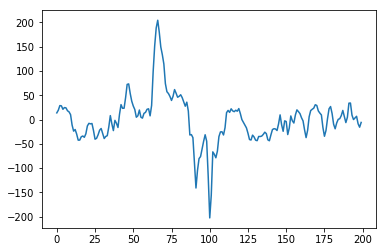

Do you want to save? [Y/n]: 


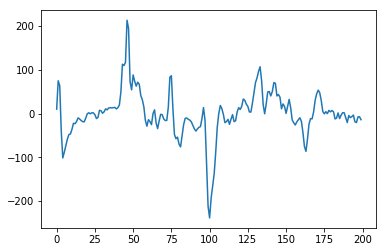

Do you want to save? [Y/n]: 


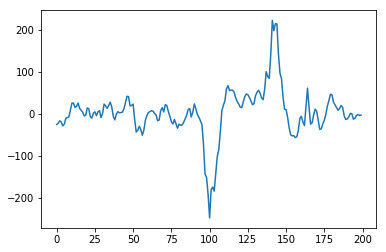

Do you want to save? [Y/n]: 


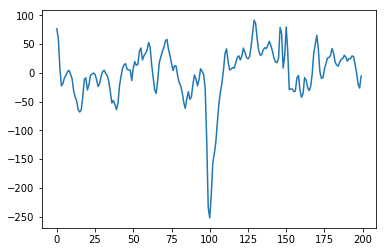

Do you want to save? [Y/n]: 


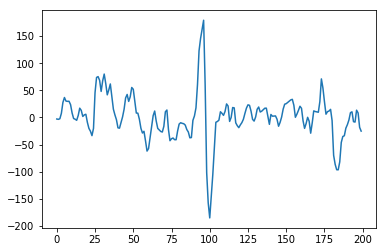

Do you want to save? [Y/n]: 


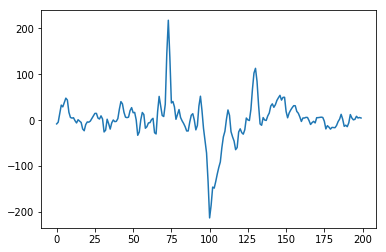

Do you want to save? [Y/n]: 


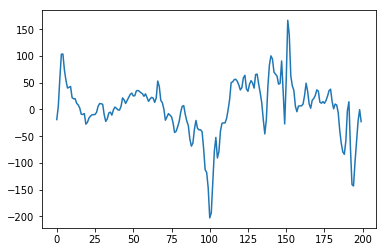

Do you want to save? [Y/n]: 


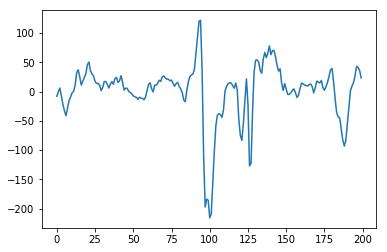

Do you want to save? [Y/n]: 


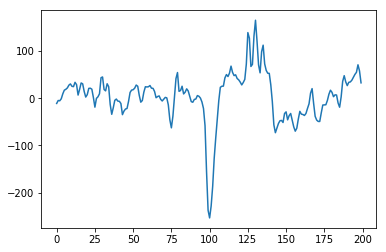

Do you want to save? [Y/n]: 


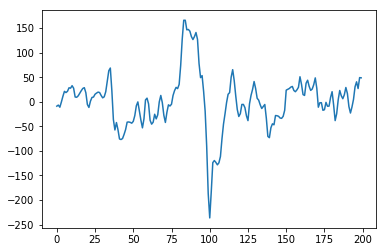

Do you want to save? [Y/n]: 


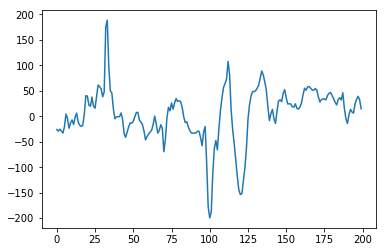

Do you want to save? [Y/n]: 


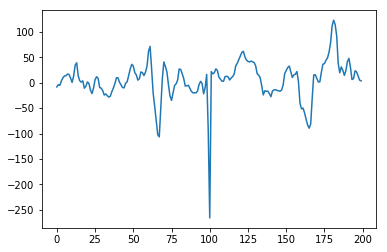

Do you want to save? [Y/n]: 
13 out of 331


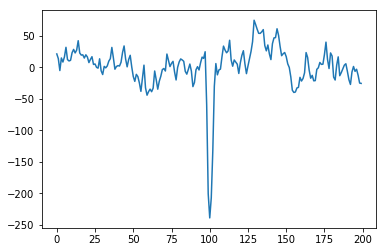

Do you want to save? [Y/n]: 


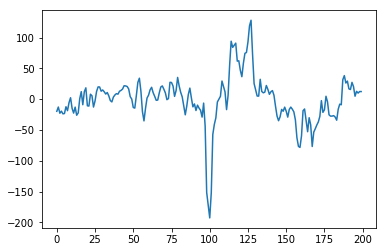

Do you want to save? [Y/n]: 


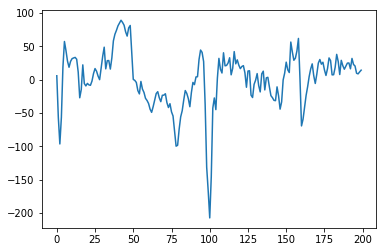

Do you want to save? [Y/n]: 


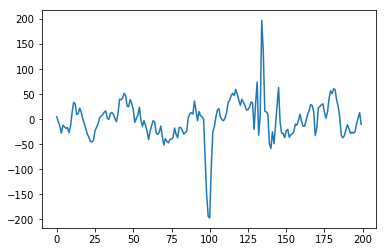

Do you want to save? [Y/n]: 


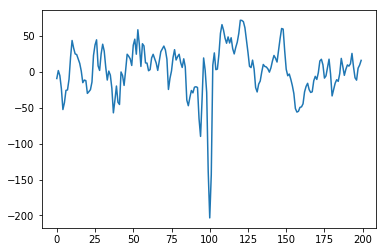

Do you want to save? [Y/n]: 


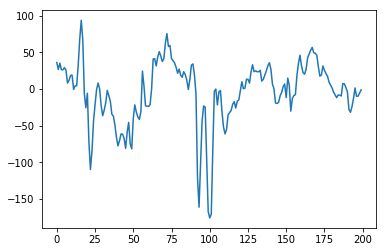

Do you want to save? [Y/n]: 


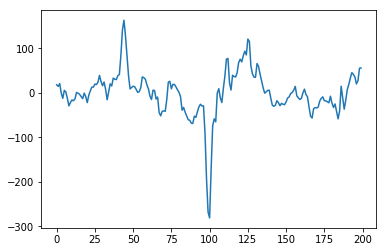

Do you want to save? [Y/n]: 


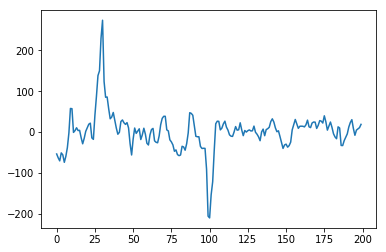

Do you want to save? [Y/n]: 


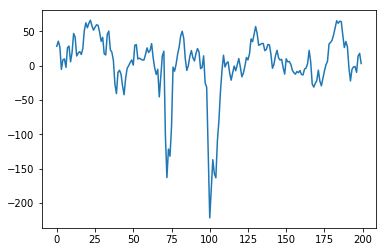

Do you want to save? [Y/n]: 


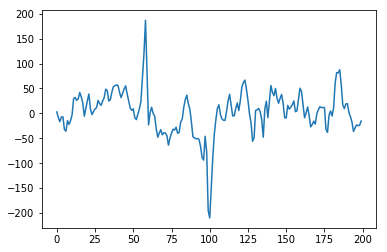

Do you want to save? [Y/n]: 


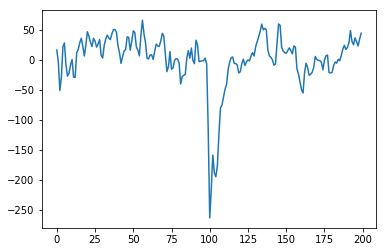

Do you want to save? [Y/n]: 


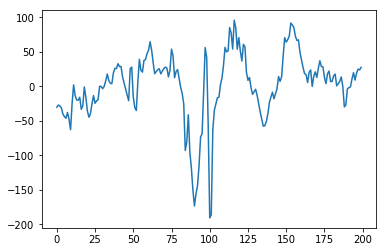

Do you want to save? [Y/n]: 


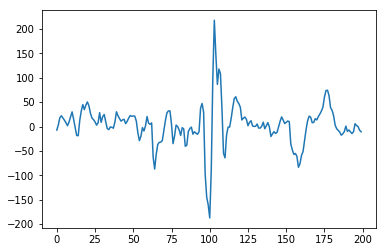

Do you want to save? [Y/n]: 


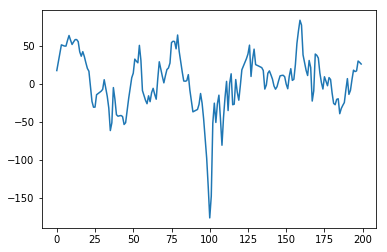

Do you want to save? [Y/n]: 


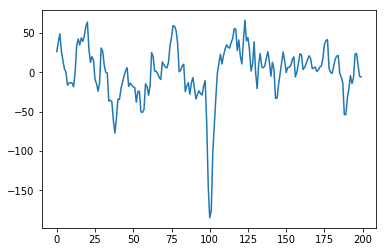

Do you want to save? [Y/n]: 


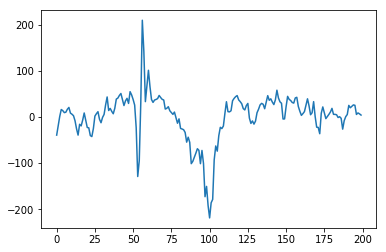

Do you want to save? [Y/n]: n


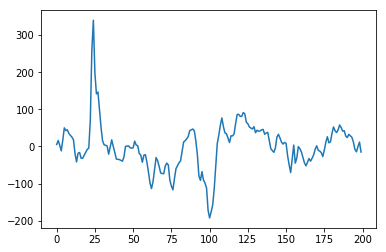

Do you want to save? [Y/n]: n


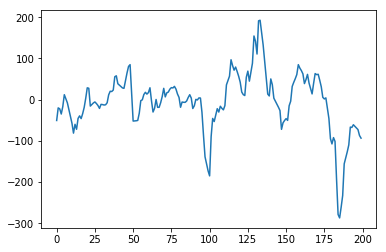

Do you want to save? [Y/n]: n


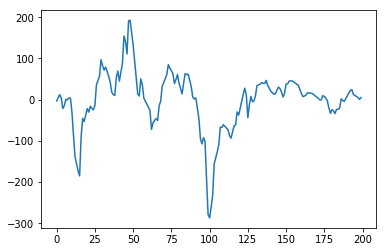

Do you want to save? [Y/n]: 


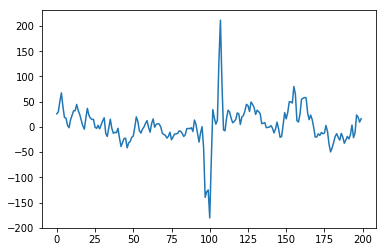

Do you want to save? [Y/n]: 


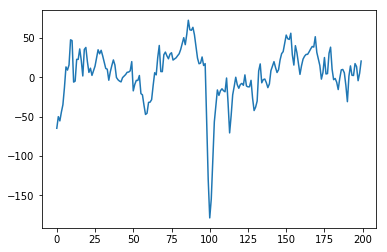

Do you want to save? [Y/n]: 


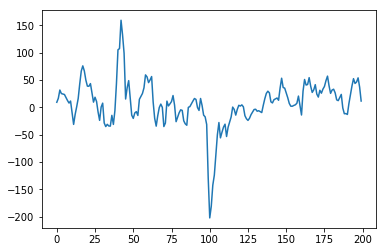

Do you want to save? [Y/n]: 


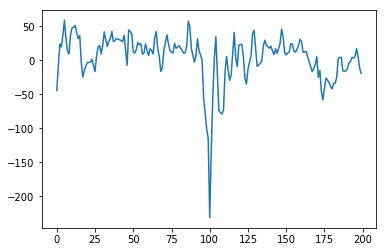

Do you want to save? [Y/n]: 


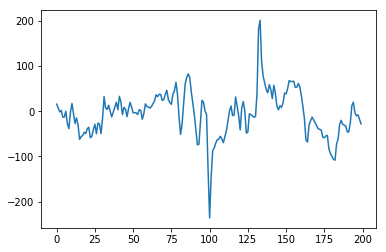

Do you want to save? [Y/n]: 


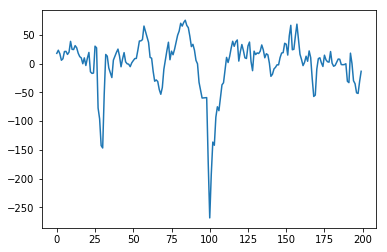

Do you want to save? [Y/n]: 


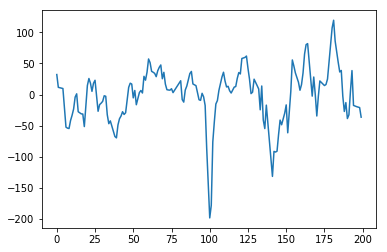

Do you want to save? [Y/n]: 


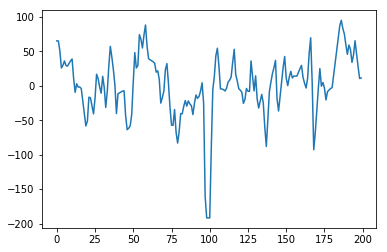

Do you want to save? [Y/n]: 


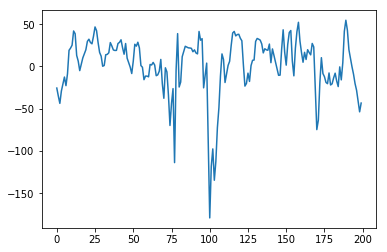

Do you want to save? [Y/n]: 


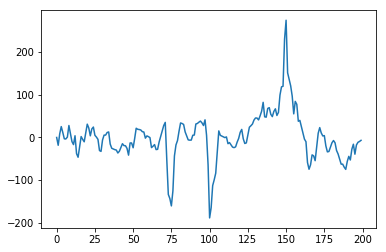

Do you want to save? [Y/n]: 


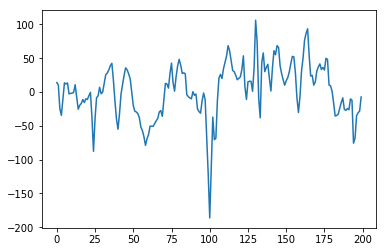

Do you want to save? [Y/n]: 


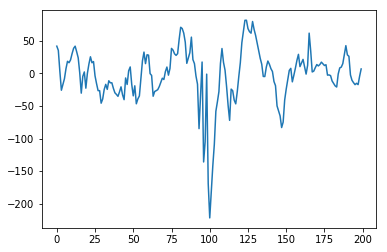

Do you want to save? [Y/n]: 


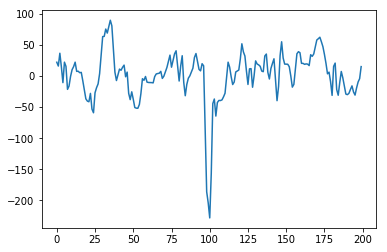

Do you want to save? [Y/n]: 


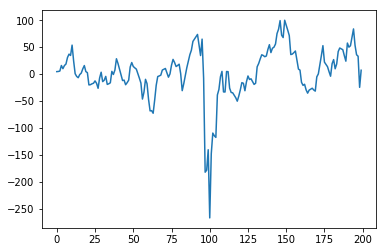

Do you want to save? [Y/n]: 


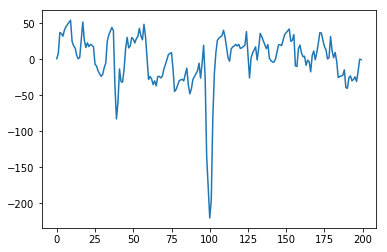

Do you want to save? [Y/n]: 


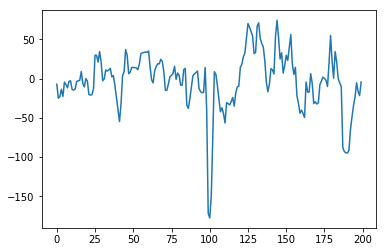

Do you want to save? [Y/n]: 


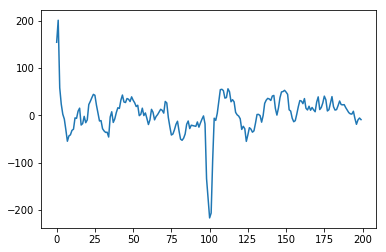

Do you want to save? [Y/n]: 


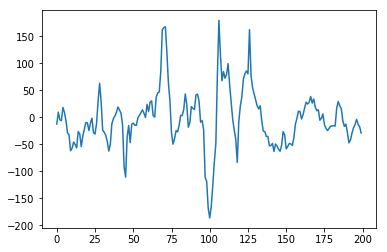

Do you want to save? [Y/n]: 


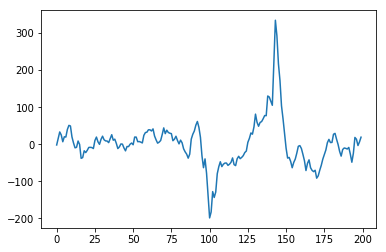

Do you want to save? [Y/n]: 


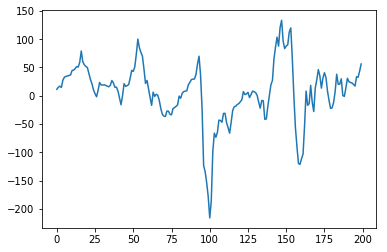

Do you want to save? [Y/n]: 


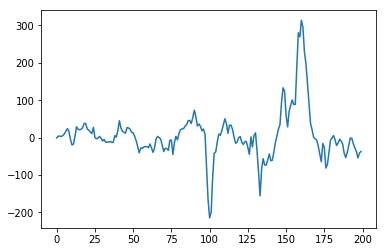

Do you want to save? [Y/n]: 


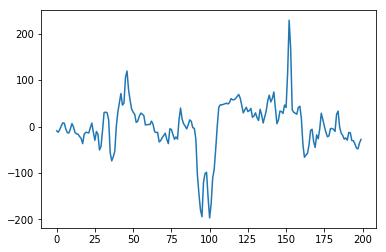

Do you want to save? [Y/n]: 


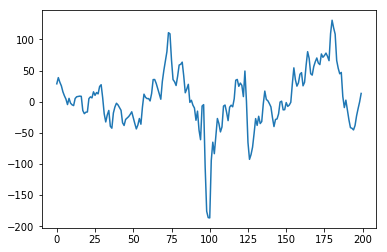

Do you want to save? [Y/n]: 


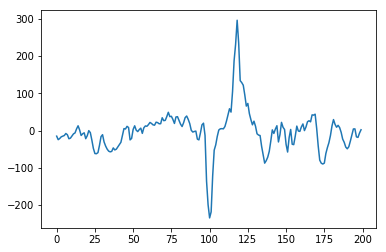

Do you want to save? [Y/n]: 


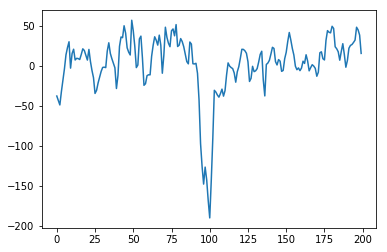

Do you want to save? [Y/n]: 


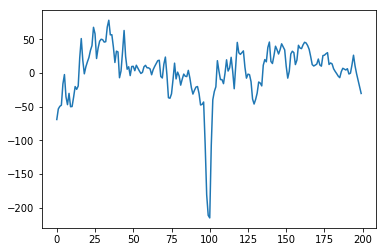

Do you want to save? [Y/n]: 


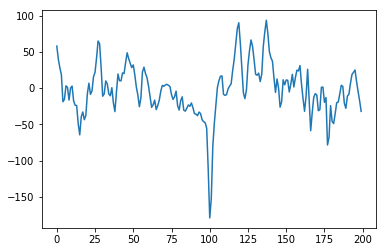

Do you want to save? [Y/n]: 


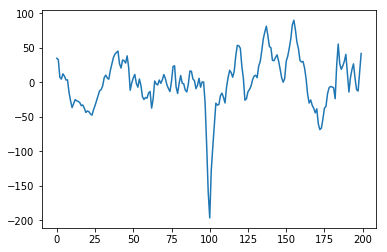

Do you want to save? [Y/n]: 


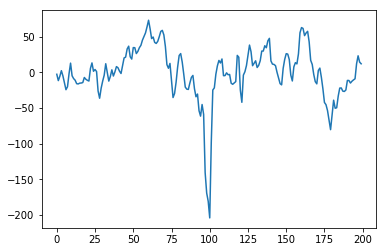

Do you want to save? [Y/n]: 


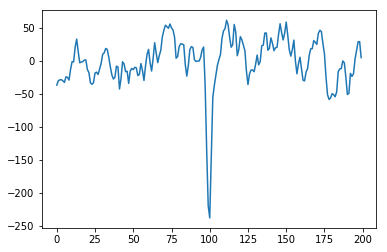

Do you want to save? [Y/n]: 


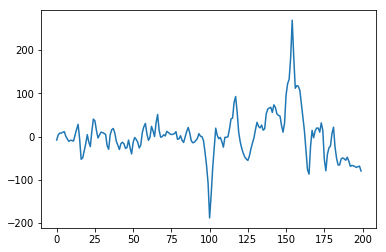

Do you want to save? [Y/n]: 
14 out of 331


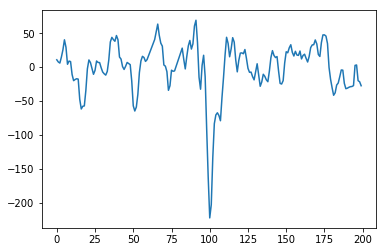

Do you want to save? [Y/n]: 


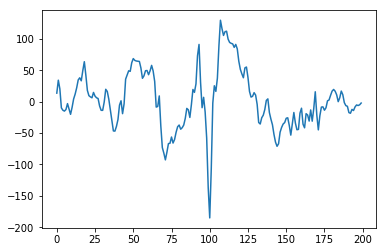

Do you want to save? [Y/n]: 


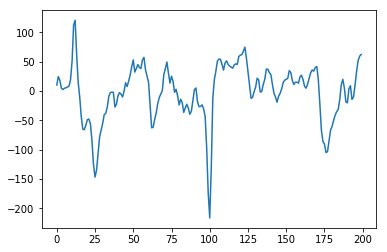

Do you want to save? [Y/n]: 


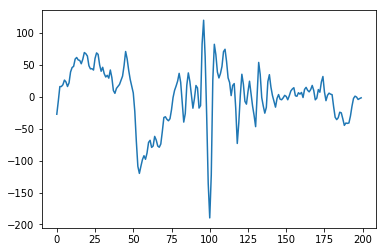

Do you want to save? [Y/n]: 


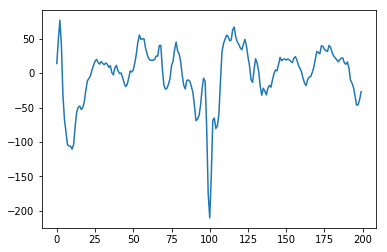

Do you want to save? [Y/n]: 


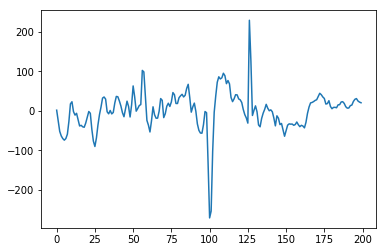

Do you want to save? [Y/n]: 


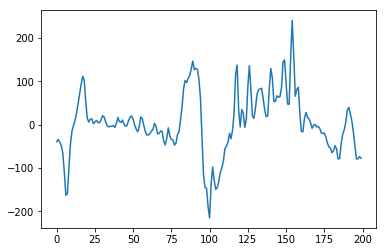

Do you want to save? [Y/n]: n


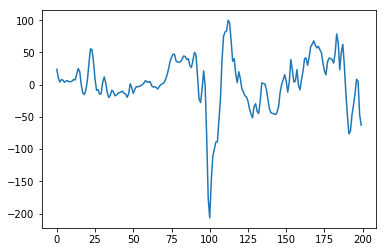

Do you want to save? [Y/n]: 


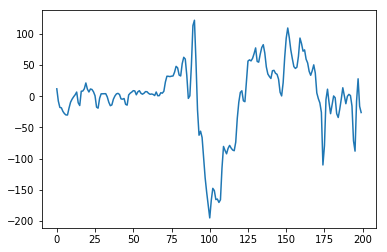

Do you want to save? [Y/n]: n


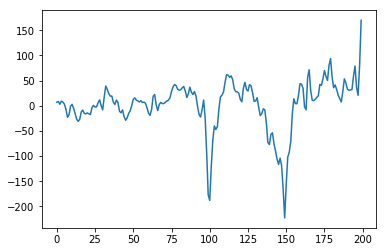

Do you want to save? [Y/n]: 


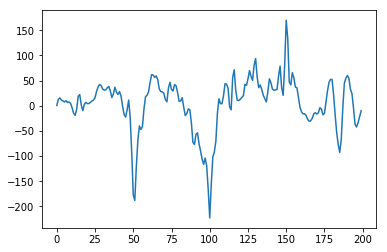

Do you want to save? [Y/n]: 


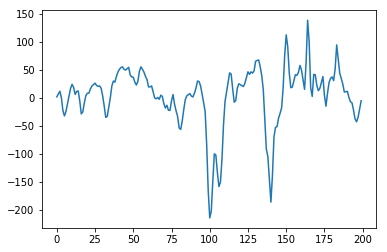

Do you want to save? [Y/n]: 


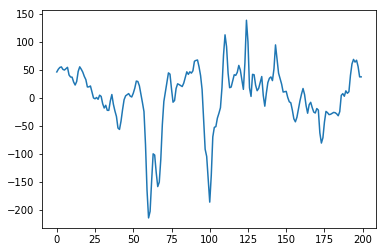

Do you want to save? [Y/n]: 


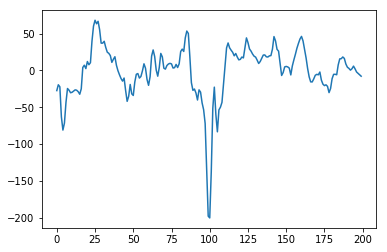

Do you want to save? [Y/n]: 


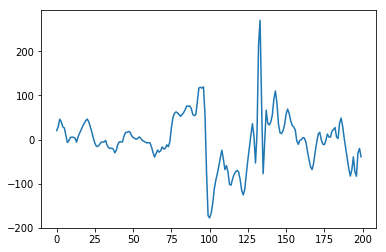

Do you want to save? [Y/n]: 


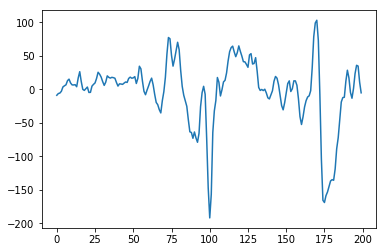

Do you want to save? [Y/n]: 


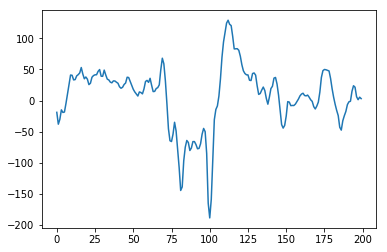

Do you want to save? [Y/n]: 


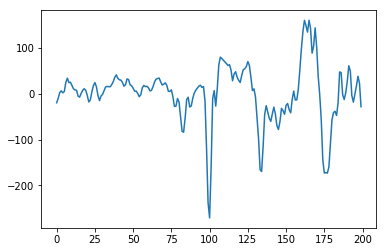

Do you want to save? [Y/n]: 


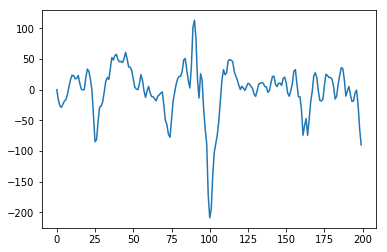

Do you want to save? [Y/n]: 


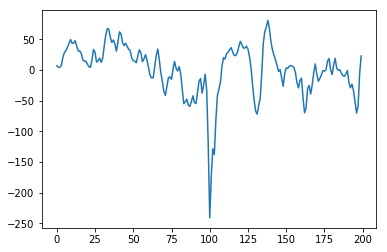

Do you want to save? [Y/n]: 


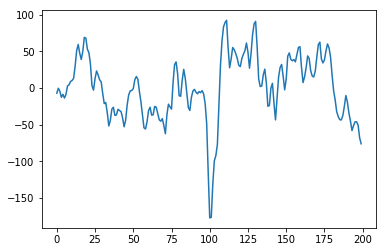

Do you want to save? [Y/n]: 


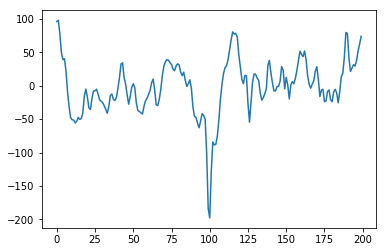

Do you want to save? [Y/n]: 


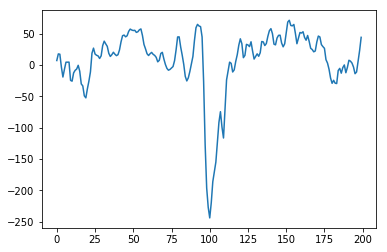

Do you want to save? [Y/n]: 


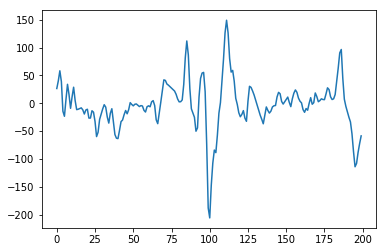

Do you want to save? [Y/n]: 


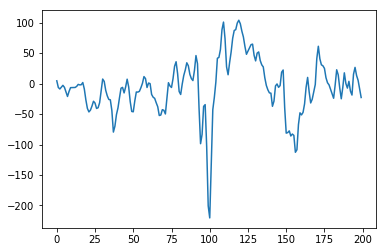

Do you want to save? [Y/n]: 


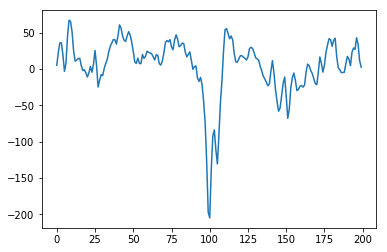

Do you want to save? [Y/n]: 


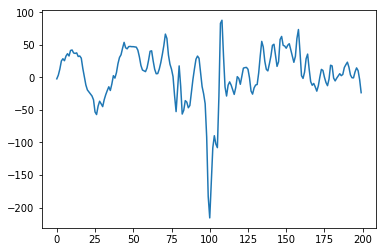

Do you want to save? [Y/n]: 


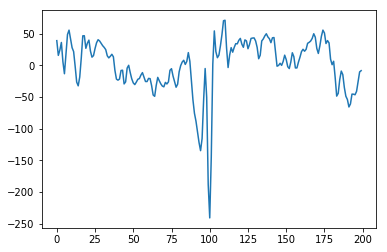

Do you want to save? [Y/n]: 


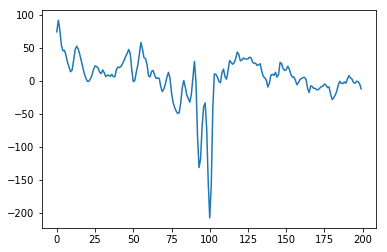

Do you want to save? [Y/n]: 


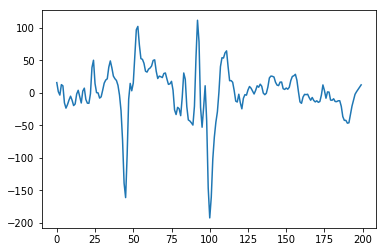

Do you want to save? [Y/n]: 


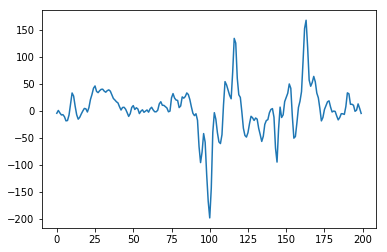

Do you want to save? [Y/n]: 


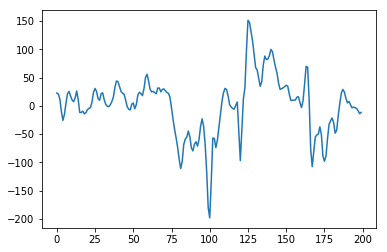

Do you want to save? [Y/n]: 


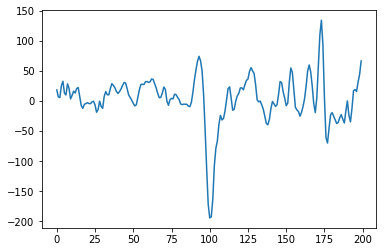

Do you want to save? [Y/n]: 


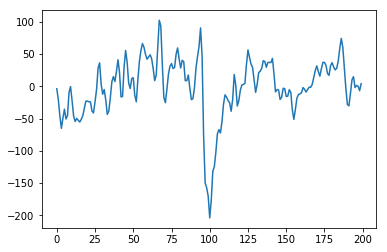

Do you want to save? [Y/n]: 


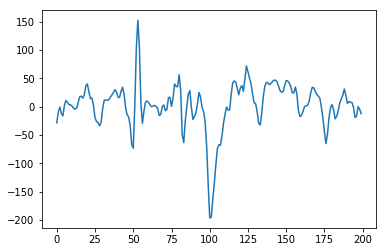

Do you want to save? [Y/n]: 


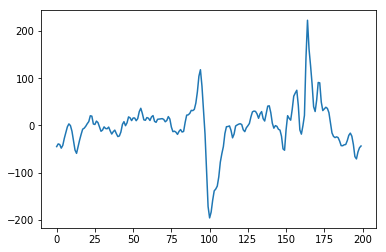

Do you want to save? [Y/n]: 


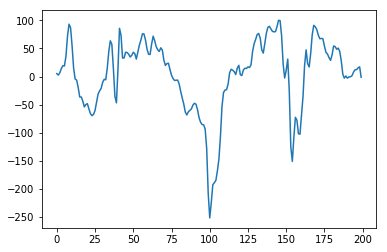

Do you want to save? [Y/n]: 


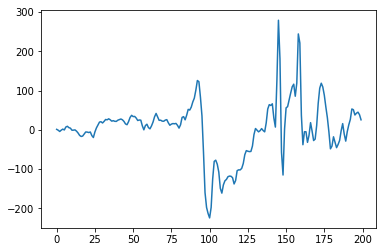

Do you want to save? [Y/n]: n


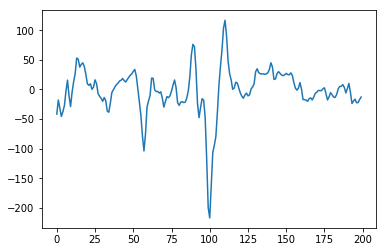

Do you want to save? [Y/n]: 


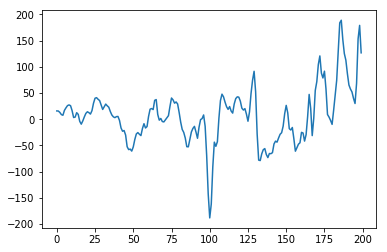

Do you want to save? [Y/n]: 


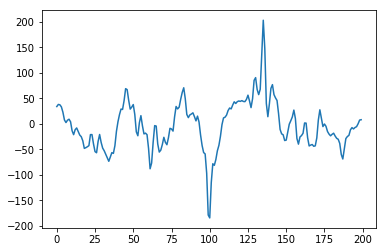

Do you want to save? [Y/n]: 


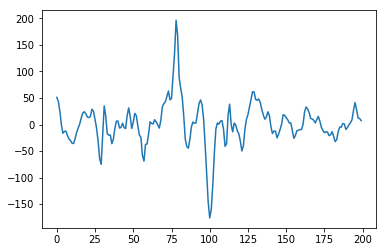

Do you want to save? [Y/n]: 


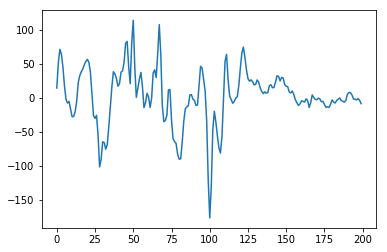

Do you want to save? [Y/n]: 


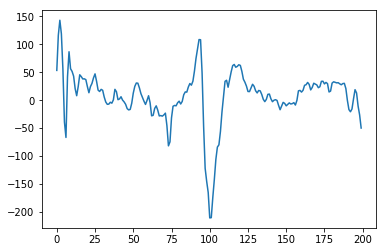

Do you want to save? [Y/n]: 


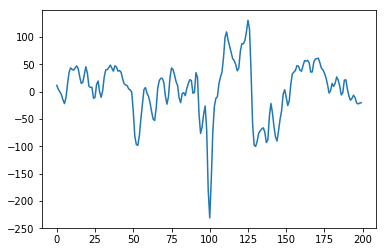

Do you want to save? [Y/n]: 


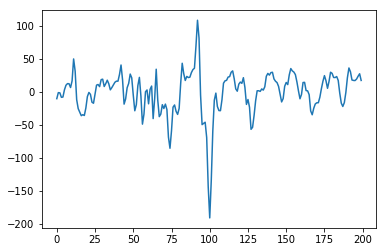

Do you want to save? [Y/n]: 


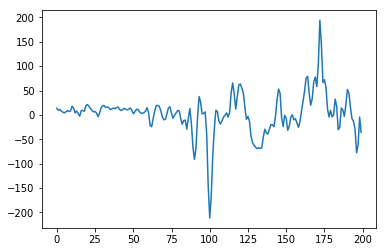

Do you want to save? [Y/n]: 


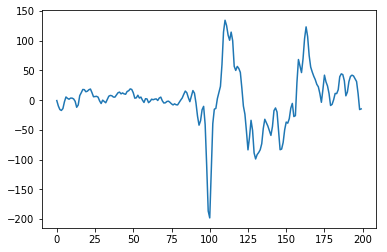

Do you want to save? [Y/n]: 


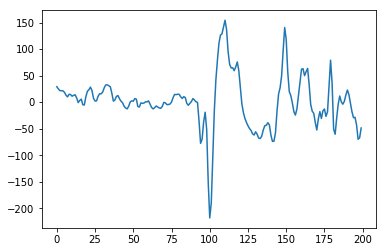

Do you want to save? [Y/n]: 


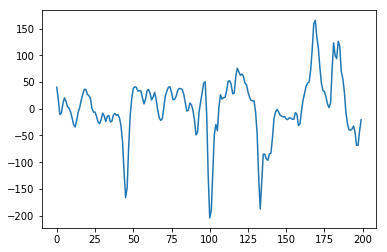

Do you want to save? [Y/n]: 
15 out of 331


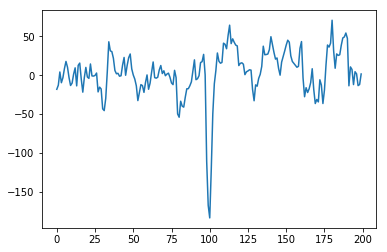

Do you want to save? [Y/n]: 


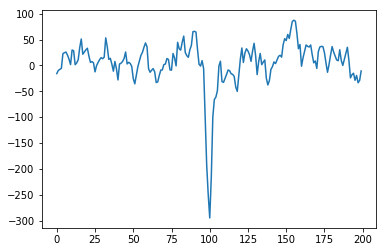

Do you want to save? [Y/n]: 


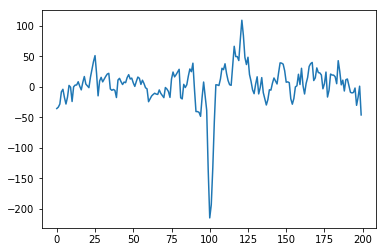

Do you want to save? [Y/n]: 


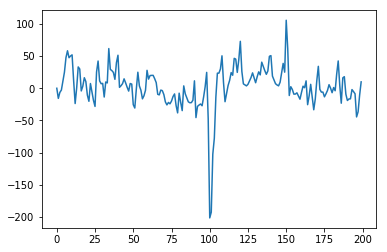

Do you want to save? [Y/n]: 


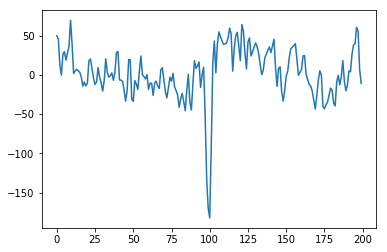

Do you want to save? [Y/n]: 


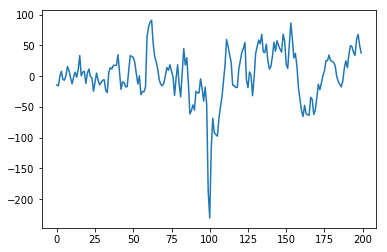

Do you want to save? [Y/n]: 


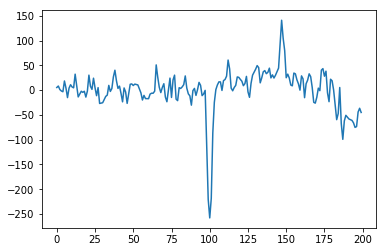

Do you want to save? [Y/n]: 


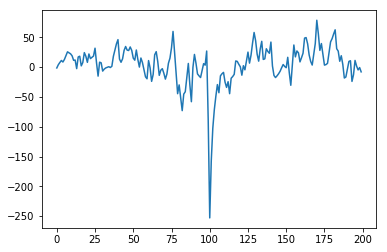

Do you want to save? [Y/n]: 


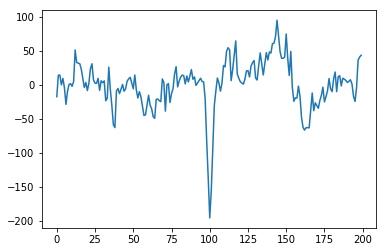

Do you want to save? [Y/n]: 


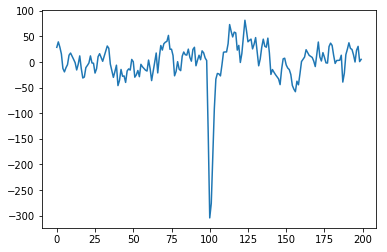

Do you want to save? [Y/n]: 


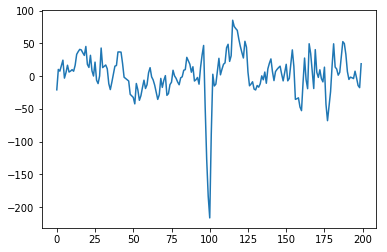

Do you want to save? [Y/n]: 


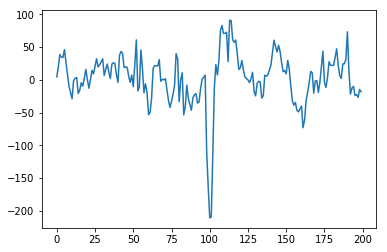

Do you want to save? [Y/n]: 


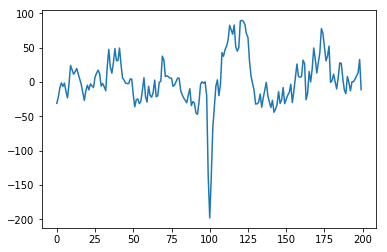

Do you want to save? [Y/n]: 


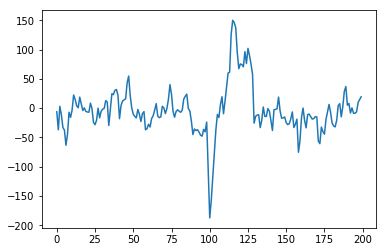

Do you want to save? [Y/n]: 


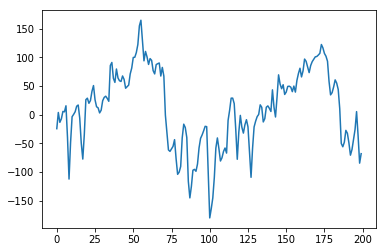

Do you want to save? [Y/n]: 


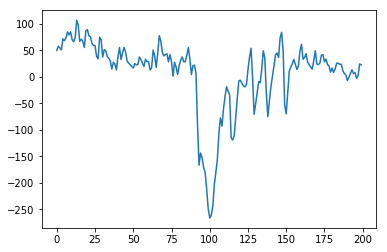

Do you want to save? [Y/n]: 


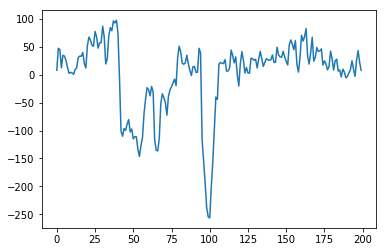

Do you want to save? [Y/n]: 


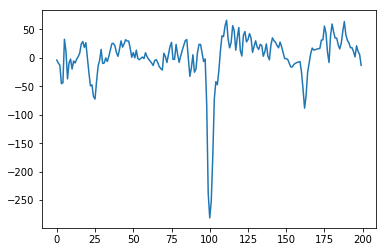

Do you want to save? [Y/n]: 


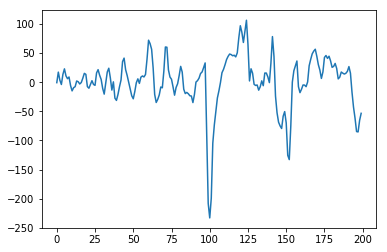

Do you want to save? [Y/n]: 


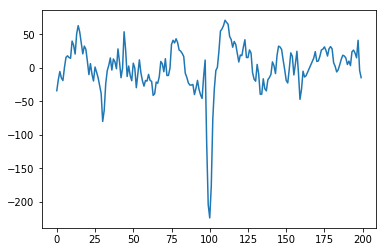

Do you want to save? [Y/n]: 


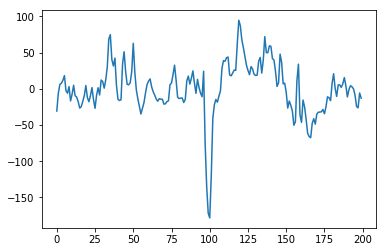

Do you want to save? [Y/n]: 


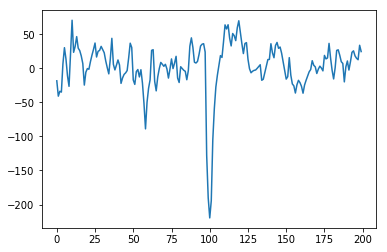

Do you want to save? [Y/n]: 


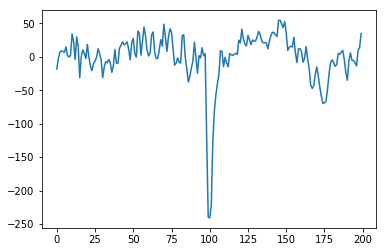

Do you want to save? [Y/n]: 


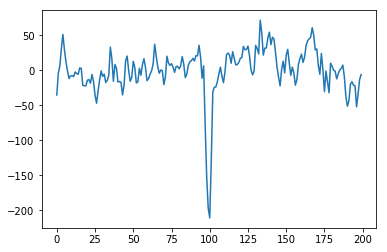

Do you want to save? [Y/n]: 


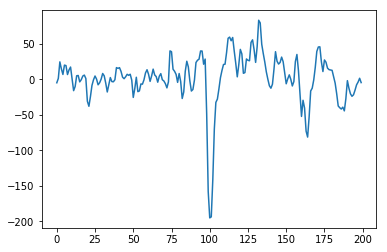

Do you want to save? [Y/n]: 


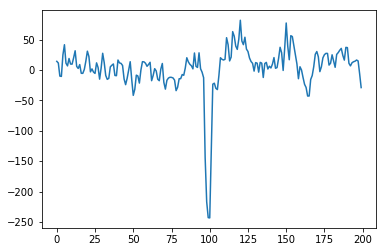

Do you want to save? [Y/n]: 


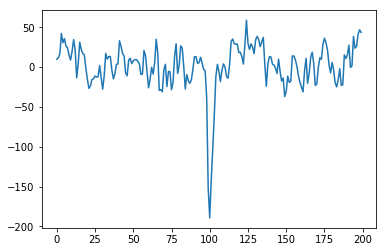

Do you want to save? [Y/n]: 


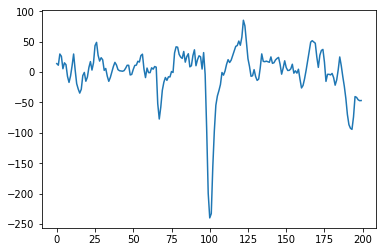

Do you want to save? [Y/n]: 


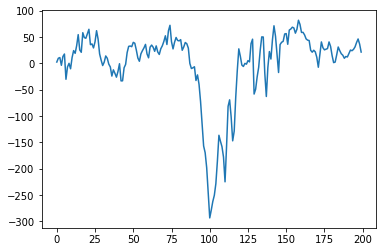

Do you want to save? [Y/n]: 


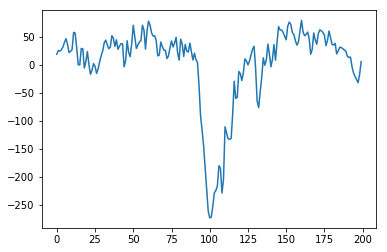

Do you want to save? [Y/n]: 


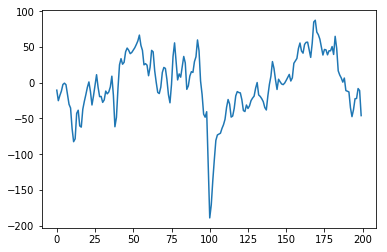

Do you want to save? [Y/n]: 


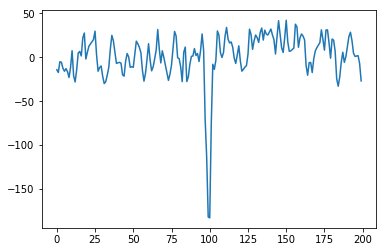

Do you want to save? [Y/n]: 


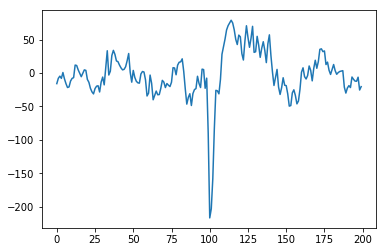

Do you want to save? [Y/n]: 


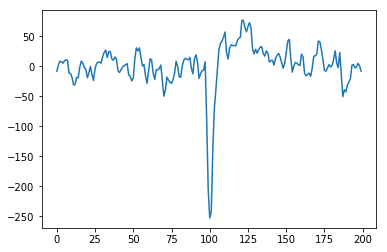

Do you want to save? [Y/n]: 


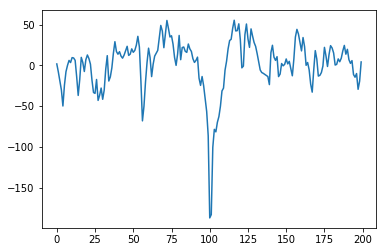

Do you want to save? [Y/n]: 


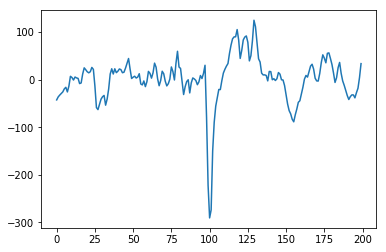

Do you want to save? [Y/n]: 


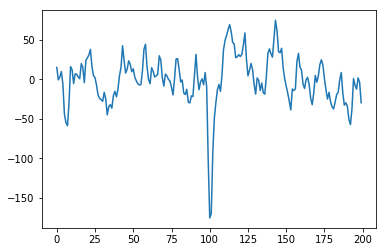

Do you want to save? [Y/n]: 


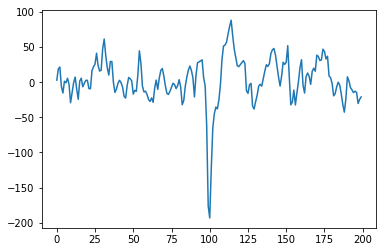

Do you want to save? [Y/n]: 


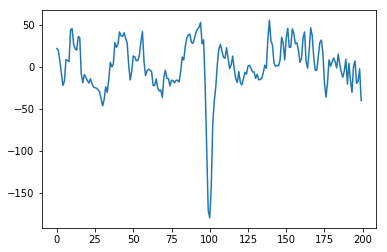

Do you want to save? [Y/n]: 


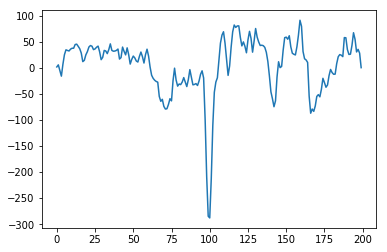

Do you want to save? [Y/n]: 


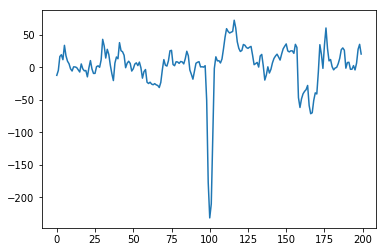

Do you want to save? [Y/n]: 


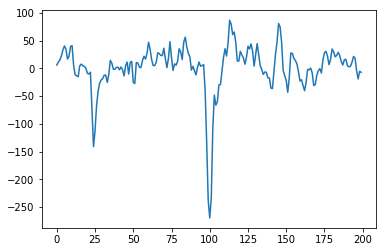

Do you want to save? [Y/n]: 


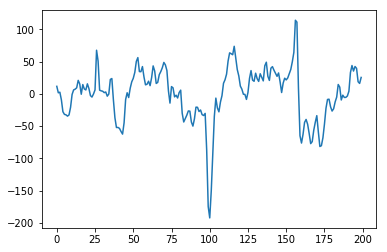

Do you want to save? [Y/n]: 


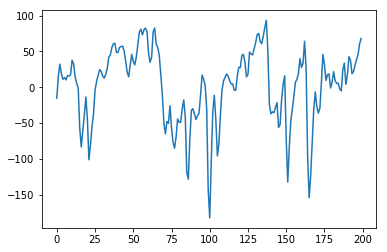

Do you want to save? [Y/n]: 


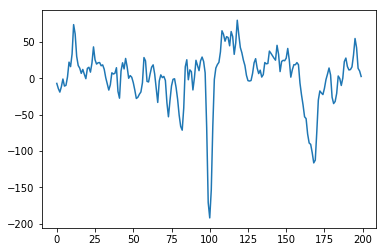

Do you want to save? [Y/n]: 


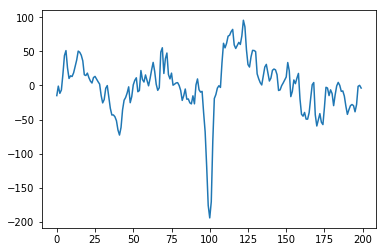

Do you want to save? [Y/n]: 


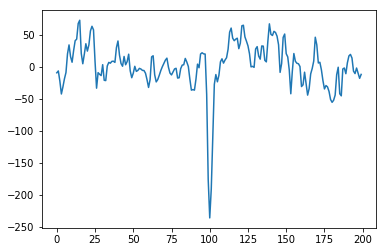

Do you want to save? [Y/n]: 


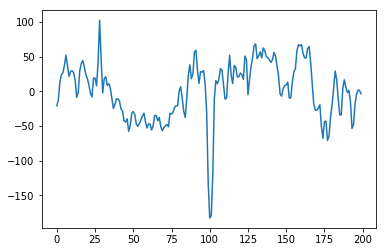

Do you want to save? [Y/n]: 


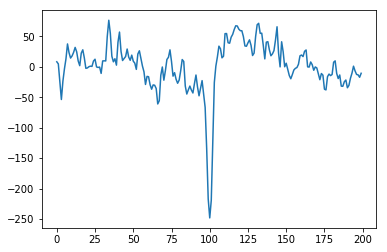

Do you want to save? [Y/n]: 


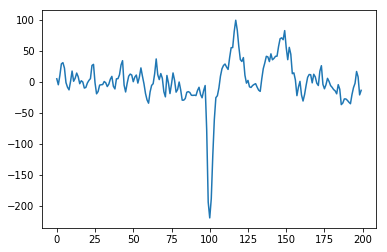

Do you want to save? [Y/n]: 


In [18]:
import click

Spikes = []
    
Potentials = []

Pos_dex = []
Neg_dex = []

Amps = []

Completion = 1

Amplitudes = pd.DataFrame()


for i in  np.random.randint(low = 0, high = len(h5_files), size=15):

    Spike_amps = []
    Potential_amps = []
    
    
    print(str(Completion) + " out of " + str(len(h5_files)))
    Completion = Completion + 1
    Pos_dexes = []
    Neg_dexes = []
    
    y = Indexing.loc[i,'File']
    x = Indexing.loc[i,'Timestamps']
    
    h5file = pg.H5File(y)
    
    DataHC = np.array(h5file[HC]['data'])
    DataDF_HC_for_detection = -DataHC
    
    
    if len(x) < 50:
        lim = len(x)
    else:
        lim = 50
    
    
    for i in np.arange(0,lim):
        if x[i] > 1842800:
            continue
        if x[i] < 101:
            continue
    
        Spike = -DataDF_HC_for_detection[x[i]-100:x[i]+400]
        Spike = np.nan_to_num(Spike)

        plt.plot(Spike[0:200])        
        plt.pause(0.05)

        if click.confirm('Do you want to save?', default=True):
            Pos_dexes.append(x[i])
        else:
            Neg_dexes.append(x[i])
           
            
    plt.show()
    
    Pos_dex_temp = {'File':[y],'Timestamps':[Pos_dexes], 'Count':[len(Pos_dexes)]}
    Pos_dex_temp_df = pd.DataFrame(data = Pos_dex_temp)
    Pos_dex.append(Pos_dex_temp_df)
    
    Neg_dex_temp = {'File':[y],'Timestamps':[Neg_dexes], 'Count':[len(Neg_dexes)]}
    Neg_dex_temp_df = pd.DataFrame(data = Neg_dex_temp)
    Neg_dex.append(Neg_dex_temp_df)
    
    
    
Pos_dex = pd.concat(Pos_dex, axis = 0, ignore_index=True)

Neg_dex = pd.concat(Neg_dex, axis = 0, ignore_index=True)


In [19]:
Pos_dex

,File,Timestamps,Count
0,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[48968, 68477, 118229, 155844, 219090, 271639,...",16
1,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[5580, 7616, 8982, 12395, 14032, 15481, 18372,...",42
2,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[6162, 7464, 13156, 36399, 66097, 66926, 70757...",40
3,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[826, 1168, 1327, 1476, 1621, 2640, 3086, 3707...",42
4,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[11151, 180190, 215605, 242640, 244650, 246871...",41
5,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[50420, 183592, 479536, 480451, 500019, 505448...",23
6,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[118584, 135577, 197782, 198710, 198973, 31144...",44
7,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[2647, 13446, 127746, 151511, 187314, 282634, ...",31
8,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[11884, 13188, 16274, 17804, 18503, 19033, 222...",36
9,F:\Yichen NDF files\TiD 130_132\h5\BASELINE\M1...,"[368995, 545725]",2


In [20]:
Filter_Dex_neg = []
Spikes = []
Potentials = []
Amp_neg = []
Coherence_neg = []
Max_rate_neg = []
Max_spike_low_neg = []
Max_potential_low_neg = []
Max_spike_high_neg = []
Max_potential_high_neg = []

Freq_sum_neg = []

Kurtosis_neg = []

Neg_spike_spectrum = []
Neg_potential_spectrum = []

T50_neg = []

Completion = 1
for i in np.arange(0,len(Neg_dex)):
    print(str(Completion) + " out of " + str(len(Neg_dex)))
    
    y = Neg_dex.loc[i,'File']
    x = Neg_dex.loc[i,'Timestamps']
    
    h5file = pg.H5File(y)
    
    DataHC = np.array(h5file[HC]['data'])
    DataDF_HC_for_detection = -DataHC
    
    for a in x:
        if a > 1842800:
            continue
        if a < 119:
            continue
            
        Spike = -DataDF_HC_for_detection[a-128:a+128]
        Spike = np.nan_to_num(Spike)
        Spikes.append(Spike)
        
        Spike_rate = np.diff(Spike)
        Spike_rate_time = Spike_rate/(1/256)
        
        
        f, Pxx_den_spike = signal.welch(Spike, fs = 256)

        Index_4_spike = np.array([int(128)])      
        
        results_50 = scipy.signal.peak_widths(-Spike, Index_4_spike, rel_height=0.5, prominence_data=None)
        
        T50 = results_50[0][0]
        
        Amp_neg.append(Spike[128])
       
        Max_rate_neg.append(np.min(Spike_rate_time))
        
        Max_spike_low_neg.append(np.max(Pxx_den_spike[0:10]))
       
        
        Max_spike_high_neg.append(np.max(Pxx_den_spike[40:]))
       
        T50_neg.append(T50)
       
               
        Neg_spike_spectrum.append(Pxx_den_spike)
        
        Kurtosis_neg.append(kurtosis(Spike))
            
    Completion = Completion+1

1 out of 15
2 out of 15
3 out of 15
4 out of 15
5 out of 15
6 out of 15
7 out of 15
8 out of 15
9 out of 15
10 out of 15
11 out of 15
12 out of 15
13 out of 15
14 out of 15
15 out of 15


In [21]:
Filter_Dex_pos = []
Spikes = []
Potentials = []

Amp_pos = []
Max_rate_pos = []
Max_spike_low_pos = []
Max_potential_low_pos = []
Max_spike_high_pos = []
Max_potential_high_pos = []
T50_pos = []
Freq_sum_pos = []

Pos_spike_spectrum = []
Pos_potential_spectrum = []

Kurtosis_pos = []

Completion = 1
for i in np.arange(0,len(Pos_dex)):
    
    print(str(Completion) + " out of " + str(len(Pos_dex)))
    
    y = Pos_dex.loc[i,'File']
    x = Pos_dex.loc[i,'Timestamps']
    
    h5file = pg.H5File(y)
    
    DataHC = np.array(h5file[HC]['data'])
    DataDF_HC_for_detection = -DataHC
        
    for a in x:
        if a > 1842800:
            continue
        if a < 12:
            continue
            
        Spike = -DataDF_HC_for_detection[a-128:a+128]
        Spike = np.nan_to_num(Spike)
        Spikes.append(Spike)
        
        Spike_rate = np.diff(Spike)
        Spike_rate_time = Spike_rate/(1/256)
        
        
        f, Pxx_den_spike = signal.welch(Spike, fs = 256)
        
        Index_4_spike = np.array([int(128)])
        
           
        results_50 = scipy.signal.peak_widths(-Spike, Index_4_spike, rel_height=0.5, prominence_data=None)
        T50 = results_50[0][0]
        
        Amp_pos.append(Spike[128])
       
        Max_rate_pos.append(np.min(Spike_rate_time))
        
        Max_spike_low_pos.append(np.max(Pxx_den_spike[0:10]))
        
        Max_spike_high_pos.append(np.max(Pxx_den_spike[40:]))
        
        T50_pos.append(T50)
        
        Pos_spike_spectrum.append(Pxx_den_spike)
        
        Kurtosis_pos.append(kurtosis(Spike))
        
    Completion = Completion+1
                        

1 out of 15
2 out of 15
3 out of 15
4 out of 15
5 out of 15
6 out of 15
7 out of 15
8 out of 15
9 out of 15
10 out of 15
11 out of 15
12 out of 15
13 out of 15
14 out of 15
15 out of 15


In [24]:
Amp_pos 
Max_rate_pos 
Max_spike_low_pos 
Max_spike_high_pos 
T50_pos
Kurtosis_pos 


[-210.24353,
 -183.59525,
 -188.16757,
 -176.66254,
 -193.63776,
 -194.59564,
 -180.98416,
 -181.57428,
 -203.29778,
 -175.69005,
 -187.64624,
 -176.2046,
 -178.91425,
 -184.98244,
 -199.30487,
 -198.01178,
 -187.5081,
 -186.16042,
 -199.65326,
 -198.02835,
 -212.3562,
 -180.89146,
 -175.61197,
 -191.56395,
 -200.5619,
 -202.91855,
 -218.72797,
 -184.00238,
 -189.72496,
 -209.08995,
 -177.34592,
 -241.60304,
 -211.85925,
 -187.18463,
 -193.79189,
 -213.28217,
 -184.56462,
 -229.71349,
 -184.66367,
 -185.61665,
 -192.04434,
 -209.44804,
 -179.23758,
 -187.84393,
 -209.60046,
 -186.20627,
 -184.49055,
 -188.12225,
 -213.14084,
 -190.62956,
 -216.52922,
 -201.00206,
 -214.86404,
 -187.7747,
 -208.3812,
 -185.84145,
 -177.0992,
 -223.22209,
 -181.99846,
 -176.62932,
 -179.56552,
 -222.38945,
 -175.8976,
 -194.5697,
 -230.02647,
 -271.18524,
 -183.5134,
 -187.26476,
 -182.1368,
 -240.09839,
 -267.55276,
 -186.33998,
 -281.95044,
 -190.6728,
 -329.54218,
 -201.43617,
 -177.96732,
 -187.3983,

C:\Users\sajon\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\sajon\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: scipy.stats.norm.pdf
  
C:\Users\sajon\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: MatplotlibDeprecationWarning: scipy.stats.norm.pdf


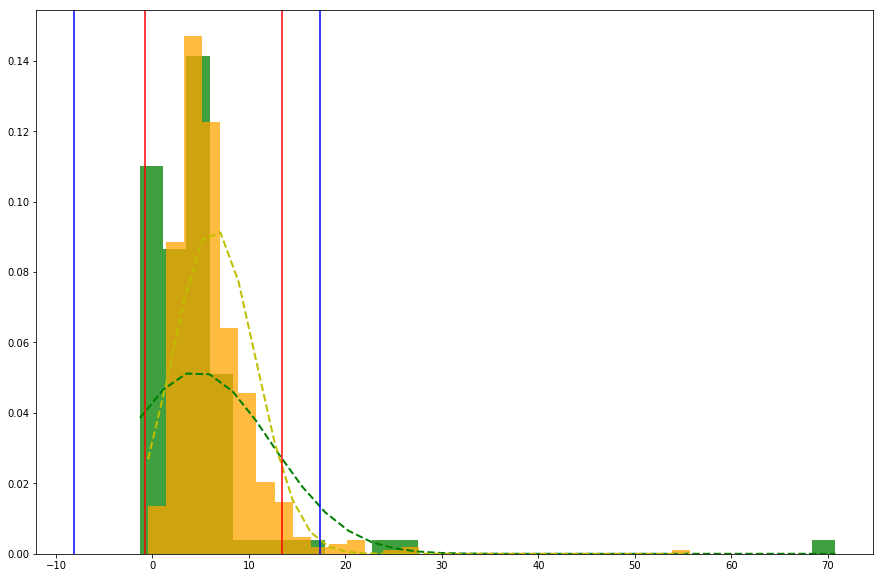

In [43]:
import matplotlib.mlab as mlab
from scipy.stats import norm

Pos_data = Kurtosis_pos  
Neg_data = Kurtosis_neg
Pos_ci = norm(*norm.fit(Pos_data)).interval(0.9)
Neg_ci = norm(*norm.fit(Neg_data)).interval(0.9)


plt.figure(figsize = (15,10))
(mu_neg, sigma_neg) = norm.fit(Neg_data)
n, bins_neg, patches = plt.hist(Neg_data, 30, normed=1, facecolor='green', alpha=0.75)

y_neg = mlab.normpdf( bins_neg, mu_neg, sigma_neg)
l_neg = plt.plot(bins_neg, y_neg, 'g--', linewidth=2)

(mu_pos, sigma_pos) = norm.fit(Pos_data)
n, bins_pos, patches = plt.hist(Pos_data, 30, normed=1, facecolor='orange', alpha=0.75)

# add a 'best fit' line
y_pos = mlab.normpdf(bins_pos, mu_pos, sigma_pos)
l = plt.plot(bins_pos, y_pos, 'y--', linewidth=2)

#plt.title("Max_")

plt.axvline(Pos_ci[0],color='r')
plt.axvline(Pos_ci[1],color='r')
#plt.xlim([0,5])
plt.axvline(Neg_ci[0],color='b')
plt.axvline(Neg_ci[1],color='b')

In [41]:
print("Pos_ci = "),print(Pos_ci)
print("Neg_ci = "),print(Neg_ci)

Pos_ci = 
(-0.7624624038823624, 13.434794752129442)
Neg_ci = 
(-8.078330979910762, 17.318200082442978)


(None, None)

In [94]:
print("Pos_ci = "),print(Pos_ci)
print("Neg_ci = "),print(Neg_ci)

Pos_ci = 
(-12.369248571982277, 26.526034882536322)
Neg_ci = 
(-19.17434360959161, 44.85591906429743)


(None, None)

In [64]:
True_dex = []
Completion = 1

for i in np.arange(0,len(h5_files)):

    print(str(Completion) + " out of " + str(len(h5_files)))
    
    True_indexes = []
    
    y = Indexing.loc[i,'File']
    x = Indexing.loc[i,'Timestamps']
    
    
    h5file = pg.H5File(y)
    
    DataHC = np.array(h5file[HC]['data'])
    DataDF_HC_for_detection = -DataHC
    
    
    for a in x:
        if a > 1842800:
            continue
        if a < 128:
            continue
            
        Spike = -DataDF_HC_for_detection[a-128:a+128]
        Spike = np.nan_to_num(Spike)
              
        f, Pxx_den_spike = signal.welch(Spike, fs = 256)
 
        Spike_rate = np.diff(Spike)
        Spike_rate_time = Spike_rate/(1/256)
        
        Max_rate = np.min(Spike_rate_time)
        
        Max_spike_low = (np.max(Pxx_den_spike[0:10]))

        
        Max_spike_high = (np.max(Pxx_den_spike[40:]))
        
        Kurtosis = kurtosis(Spike)
        
        results_50 = scipy.signal.peak_widths(-Spike, Index_4_spike, rel_height=0.5, prominence_data=None)
        T50 = results_50[0][0]
           
        if Max_spike_high < 35.86109856383929:
            if Max_spike_low < 1168.423621025335:
                if Max_rate < -11485.008836596777:
                    if T50 < 15:
                        if Spike[128] > -750:
                            if Kurtosis > 1:
                                True_indexes.append(a)


    True_dex_temp = {'File':[y],'Timestamps':[True_indexes], 'Count':[len(True_indexes)]}
    True_dex_temp_df = pd.DataFrame(data = True_dex_temp)
    True_dex.append(True_dex_temp_df)
    Completion = Completion + 1
        
True_dex = pd.concat(True_dex, axis = 0, ignore_index=True)

1 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: PeakPropertyWarning: some peaks have a prominence of 0
C:\Users\sajon\Anaconda3\lib\site-packages\ipykernel_launcher.py:43: PeakPropertyWarning: some peaks have a width of 0


2 out of 247
3 out of 247
4 out of 247
5 out of 247
6 out of 247
7 out of 247
8 out of 247
9 out of 247
10 out of 247
11 out of 247
12 out of 247
13 out of 247
14 out of 247
15 out of 247
16 out of 247
17 out of 247
18 out of 247
19 out of 247
20 out of 247
21 out of 247
22 out of 247
23 out of 247
24 out of 247
25 out of 247
26 out of 247
27 out of 247
28 out of 247
29 out of 247
30 out of 247
31 out of 247
32 out of 247
33 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 135, using nperseg = 135
  .format(nperseg, input_length))


34 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 245, using nperseg = 245
  .format(nperseg, input_length))


35 out of 247
36 out of 247
37 out of 247
38 out of 247
39 out of 247
40 out of 247
41 out of 247
42 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 204, using nperseg = 204
  .format(nperseg, input_length))


43 out of 247
44 out of 247
45 out of 247
46 out of 247
47 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 190, using nperseg = 190
  .format(nperseg, input_length))


48 out of 247
49 out of 247
50 out of 247
51 out of 247
52 out of 247
53 out of 247
54 out of 247
55 out of 247
56 out of 247
57 out of 247
58 out of 247
59 out of 247
60 out of 247
61 out of 247
62 out of 247
63 out of 247
64 out of 247
65 out of 247
66 out of 247
67 out of 247
68 out of 247
69 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 178, using nperseg = 178
  .format(nperseg, input_length))


70 out of 247
71 out of 247
72 out of 247
73 out of 247
74 out of 247
75 out of 247
76 out of 247
77 out of 247
78 out of 247
79 out of 247
80 out of 247
81 out of 247
82 out of 247
83 out of 247
84 out of 247
85 out of 247
86 out of 247
87 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 165, using nperseg = 165
  .format(nperseg, input_length))


88 out of 247
89 out of 247
90 out of 247
91 out of 247
92 out of 247
93 out of 247
94 out of 247
95 out of 247
96 out of 247
97 out of 247
98 out of 247
99 out of 247
100 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 208, using nperseg = 208
  .format(nperseg, input_length))


101 out of 247
102 out of 247
103 out of 247
104 out of 247
105 out of 247
106 out of 247
107 out of 247
108 out of 247
109 out of 247
110 out of 247
111 out of 247
112 out of 247
113 out of 247
114 out of 247
115 out of 247
116 out of 247
117 out of 247
118 out of 247
119 out of 247
120 out of 247
121 out of 247
122 out of 247
123 out of 247
124 out of 247
125 out of 247
126 out of 247
127 out of 247
128 out of 247
129 out of 247
130 out of 247
131 out of 247
132 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 220, using nperseg = 220
  .format(nperseg, input_length))


133 out of 247
134 out of 247
135 out of 247
136 out of 247
137 out of 247
138 out of 247
139 out of 247
140 out of 247
141 out of 247
142 out of 247
143 out of 247
144 out of 247
145 out of 247
146 out of 247
147 out of 247
148 out of 247
149 out of 247
150 out of 247
151 out of 247
152 out of 247
153 out of 247
154 out of 247
155 out of 247
156 out of 247
157 out of 247
158 out of 247
159 out of 247
160 out of 247
161 out of 247
162 out of 247
163 out of 247
164 out of 247
165 out of 247
166 out of 247
167 out of 247
168 out of 247
169 out of 247
170 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 187, using nperseg = 187
  .format(nperseg, input_length))


171 out of 247
172 out of 247
173 out of 247
174 out of 247
175 out of 247
176 out of 247
177 out of 247
178 out of 247
179 out of 247
180 out of 247
181 out of 247
182 out of 247
183 out of 247
184 out of 247
185 out of 247
186 out of 247
187 out of 247
188 out of 247
189 out of 247
190 out of 247
191 out of 247
192 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 222, using nperseg = 222
  .format(nperseg, input_length))


193 out of 247
194 out of 247
195 out of 247
196 out of 247
197 out of 247
198 out of 247
199 out of 247
200 out of 247
201 out of 247
202 out of 247
203 out of 247
204 out of 247
205 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 179, using nperseg = 179
  .format(nperseg, input_length))


206 out of 247
207 out of 247
208 out of 247
209 out of 247
210 out of 247
211 out of 247
212 out of 247
213 out of 247
214 out of 247
215 out of 247
216 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 194, using nperseg = 194
  .format(nperseg, input_length))


217 out of 247
218 out of 247
219 out of 247
220 out of 247
221 out of 247
222 out of 247
223 out of 247
224 out of 247
225 out of 247
226 out of 247
227 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 213, using nperseg = 213
  .format(nperseg, input_length))


228 out of 247
229 out of 247
230 out of 247
231 out of 247
232 out of 247
233 out of 247
234 out of 247
235 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\scipy\signal\spectral.py:1969: UserWarning: nperseg = 256 is greater than input length  = 234, using nperseg = 234
  .format(nperseg, input_length))


236 out of 247
237 out of 247
238 out of 247
239 out of 247
240 out of 247
241 out of 247
242 out of 247
243 out of 247
244 out of 247
245 out of 247
246 out of 247
247 out of 247


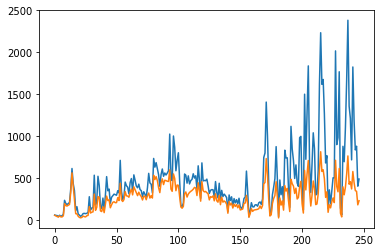

In [65]:
plt.plot(Indexing['Count'])
plt.plot(True_dex['Count'][:])

In [66]:
True_dex.to_pickle((str(HC) + "_" + stage + "_YQ_True_dex.pkl"))

In [67]:
Amplitudes = []
Max_rates = []
T50s = []
ISIs = []
Counts = []

Results_Dex = []

Completion = 1
for i in np.arange(0,len(True_dex)):
    
    print(str(Completion) + " out of " + str(len(True_dex)))
    
    y = True_dex.loc[i,'File']
    x = True_dex.loc[i,'Timestamps']
    
    h5file = pg.H5File(y)
    
    DataHC = np.array(h5file[HC]['data'])
    DataDF_HC_for_detection = -DataHC
    
    Amp_pos = []
    Max_rate_pos = []
    T50_pos = []
        
    for a in x:
        if a > 921200:
            continue
        if a < 129:
            continue
            
            
        Spike = -DataDF_HC_for_detection[a-128:a+128]
               
        
        f, Pxx_den_spike = signal.welch(Spike, fs = 256)
        
        Index_4_spike = np.array([int(100)])
        
        ISI = np.mean(np.diff(x))/256
        
        Amp_pos.append(np.min(Spike[120:140]))      
        
        
    Amplitude = (np.mean(Amp_pos))
    Max_rates.append(np.mean(Max_rate_pos))
    T50s.append(np.mean(T50_pos))
    ISIs.append(ISI)
 
    
    if len(x) == 0:
        ISI = str( )
        Amplitude = str( )
    
    
    Results_Dex_data = {'File':[y],'Count':[len(x)],'Amplitude':[Amplitude],'ISI':[ISI]}
    Results_Dex_temp_df = pd.DataFrame(data = Results_Dex_data)
    Results_Dex.append(Results_Dex_temp_df)
    Completion = Completion + 1
        
Results_Dex = pd.concat(Results_Dex, axis = 0, ignore_index=True)

1 out of 247
2 out of 247


C:\Users\sajon\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\sajon\Anaconda3\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


3 out of 247
4 out of 247
5 out of 247
6 out of 247
7 out of 247
8 out of 247
9 out of 247
10 out of 247
11 out of 247
12 out of 247
13 out of 247
14 out of 247
15 out of 247
16 out of 247
17 out of 247
18 out of 247
19 out of 247
20 out of 247
21 out of 247
22 out of 247
23 out of 247
24 out of 247
25 out of 247
26 out of 247
27 out of 247
28 out of 247
29 out of 247
30 out of 247
31 out of 247
32 out of 247
33 out of 247
34 out of 247
35 out of 247
36 out of 247
37 out of 247
38 out of 247
39 out of 247
40 out of 247
41 out of 247
42 out of 247
43 out of 247
44 out of 247
45 out of 247
46 out of 247
47 out of 247
48 out of 247
49 out of 247
50 out of 247
51 out of 247
52 out of 247
53 out of 247
54 out of 247
55 out of 247
56 out of 247
57 out of 247
58 out of 247
59 out of 247
60 out of 247
61 out of 247
62 out of 247
63 out of 247
64 out of 247
65 out of 247
66 out of 247
67 out of 247
68 out of 247
69 out of 247
70 out of 247
71 out of 247
72 out of 247
73 out of 247
74 out of 247

In [68]:
Results_Dex.to_csv(str(HC) + "_" + stage + '_YQ_data.csv')

In [69]:
Spike_avs = []
Completion = 1
Spikes = []

for i in np.arange(0,len(True_dex)):

    print(str(Completion) + " out of " + str(len(True_dex)))
    
    y = True_dex.loc[i,'File']
    x = True_dex.loc[i,'Timestamps']
    
    h5file = pg.H5File(y)
    
    DataHC = np.array(h5file[HC]['data'])

    for a in x:        
        Spike = DataHC[a-128:a+128]
        Spike = np.nan_to_num(Spike)
        Spikes.append(Spike)    
        
    Completion = Completion + 1

1 out of 247
2 out of 247
3 out of 247
4 out of 247
5 out of 247
6 out of 247
7 out of 247
8 out of 247
9 out of 247
10 out of 247
11 out of 247
12 out of 247
13 out of 247
14 out of 247
15 out of 247
16 out of 247
17 out of 247
18 out of 247
19 out of 247
20 out of 247
21 out of 247
22 out of 247
23 out of 247
24 out of 247
25 out of 247
26 out of 247
27 out of 247
28 out of 247
29 out of 247
30 out of 247
31 out of 247
32 out of 247
33 out of 247
34 out of 247
35 out of 247
36 out of 247
37 out of 247
38 out of 247
39 out of 247
40 out of 247
41 out of 247
42 out of 247
43 out of 247
44 out of 247
45 out of 247
46 out of 247
47 out of 247
48 out of 247
49 out of 247
50 out of 247
51 out of 247
52 out of 247
53 out of 247
54 out of 247
55 out of 247
56 out of 247
57 out of 247
58 out of 247
59 out of 247
60 out of 247
61 out of 247
62 out of 247
63 out of 247
64 out of 247
65 out of 247
66 out of 247
67 out of 247
68 out of 247
69 out of 247
70 out of 247
71 out of 247
72 out of 247
7

In [70]:
Spikes_DF_Treated = pd.DataFrame(Spikes)

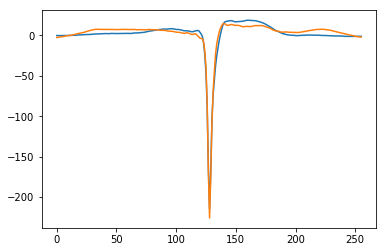

In [71]:
Baseline = (Spikes_DF_Baseline.mean(axis = 0))
Treated = (Spikes_DF_Treated.mean(axis = 0))

plt.plot(Baseline)
plt.plot(Treated)

In [72]:
Base = pd.DataFrame(Baseline)
Treat = pd.DataFrame(Treated)

result = pd.concat([Base, Treat], axis=1)

In [73]:
result.to_csv(str(HC)+'_AB_WAVEFORMS.csv')